In [1]:
import sys

import pandas as pd

import superlets_package.superlets

sys.path.insert(0, '..')


In [2]:
import jax.numpy as jnp
import matplotlib.pyplot as plt
import numpy as np
import importlib
import scipy.signal as signal_scipy
import os

import superlets_package.morlet as morlet
import superlets_package.superlets as superlet

#from superlets_package.superlets import wavelet_transform, adaptive_superlet_transform, fdeluca_changing, compute_psd_welch, meanfreq, instant_mean

In [3]:
importlib.reload(superlet)

<module 'superlets_package.superlets' from '/Users/neuralrehabilitationgroup/PycharmProjects/Superlets-Marina/superlets_package/superlets.py'>

# SIN and COS demo signal

In [4]:
# fs = 1024
# burst_freqs = [110]
# f_shift = 10
# n_cycles = 11
# n_neighb_cycles = 12
# #
# ys = []
# #
# # # create a 0.1s blank signal to start
# ys.append(jnp.zeros(int(fs*0.1)))
# #
# for f in burst_freqs:
# #   # frequency contaminated signal
# #   ############ CONTAMINATION
# #   t = 1/f * n_cycles
# #   x = jnp.linspace(0, t, int(t * fs))
# #   y = jnp.sin(2*jnp.pi*f*x) + jnp.sin(2*jnp.pi*(f+f_shift)*x - jnp.pi/1.5)
# #   ys.append(y)
# #   ############ CONTAMINATION
# #
# #   # time contaminated signal, 2 cycles later
#   ys.append(jnp.zeros(int(fs*(1/f)*2)))
# #
#   t2 = 1/f * n_neighb_cycles
#   x = jnp.linspace(0, t2, int(t2 * fs))
#   y = jnp.sin(2*jnp.pi*f*x)
#   ys.append(y)
# #
# #   # space between bursts of 0.1s
#   ys.append(jnp.zeros(int(fs*0.1)))
# #
# signal = jnp.concatenate(ys)

# Create simulated EMG signals

#### Baseline parameters

In [5]:
fs = 1024
signal_duration = 3
t = np.linspace(0, signal_duration, signal_duration * fs)
#noise = np.randomnormal(0, 0.01, len(t))  # Gaussian noise
noise = np.zeros(len(t))

### Burst parameters

In [6]:
burst_duration_1 = 1 #seconds
burst_start_1 = 1

#### Select method (DeLuca, band-pass filter)

In [7]:
mode = 'DeLuca'
#mode = 'Filter'
#mode = 'Matlab'

### Charge signals generated in Matlab

In [8]:
if mode == 'Matlab':
    burst_1 = pd.read_csv('burst_1s_matlab.csv', header = None)
    burst_1 = burst_1[0]

### Simulated EMG signal with bandpass filter

In [9]:
if mode == 'Filter':
    
    # Create noise
    #MNF_1 = [110.71]  # Central frequency
    bw = 100    # Filter bandwidth
    
    low_cut = 20
    high_cut = 300
    
    plot = True
    
    # We generate gaussian noise
    samples = int(burst_duration_1 * fs)
    t = np.linspace(0, burst_duration_1, samples, endpoint=False)
    gauss_noise = np.random.normal(0, 1, samples)  # Ruido gaussiano de media 0 y varianza 1
    
    # Create and apply filter
    nyquist = fs / 2
    #frec_baja = (MNF_1[0] - bw / 2) / nyquist
    frec_baja = low_cut / nyquist
    #frec_alta = (MNF_1[0] + bw / 2) / nyquist
    frec_alta = high_cut / nyquist
    # Diseñar filtro paso banda Butterworth
    b, a = signal_scipy.butter(N=4, Wn=[frec_baja, frec_alta], btype='band')
    burst_1 = signal_scipy.filtfilt(b, a, gauss_noise)
    
    if plot:
        plt.figure(figsize=(12, 6))
        plt.subplot(2, 1, 1)
        plt.plot(t, gauss_noise)
        plt.title("Gaussian noise")
        plt.xlabel("Time (s)")
        plt.ylabel("Amplitude")
        plt.grid()
        plt.subplot(2, 1, 2)
        plt.plot(t, burst_1, color='orange')
        plt.title(f"Filtered noise")
        plt.xlabel("Time (s)")
        plt.ylabel("Amplitude")
        plt.grid()
        plt.tight_layout()
        plt.show()
        
    w, h = signal_scipy.freqz(b, a, worN=8000)  # worN determina el número de puntos a evaluar

    # Graficar respuesta en frecuencia
    plt.figure()
    plt.plot(w * nyquist / np.pi, 20 * np.log10(abs(h)), label="Respuesta en Frecuencia")
    plt.title("Respuesta en Frecuencia del Filtro Butterworth")
    plt.xlabel("Frecuencia (Hz)")
    plt.ylabel("Amplitud (dB)")
    plt.grid()
    plt.legend()
    plt.show()


### Simulated EMG signal: Modelo de DeLuca

In [10]:
importlib.reload(superlet)

<module 'superlets_package.superlets' from '/Users/neuralrehabilitationgroup/PycharmProjects/Superlets-Marina/superlets_package/superlets.py'>

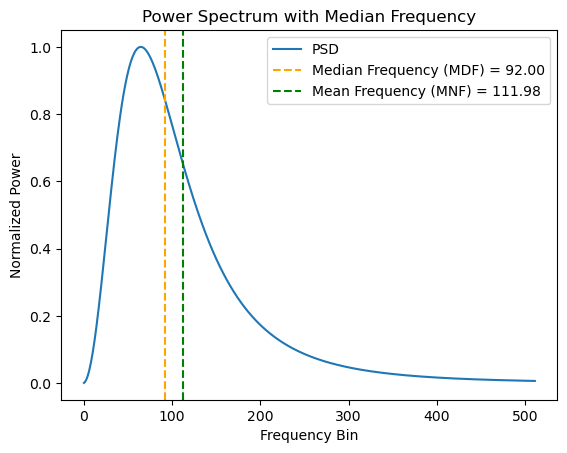

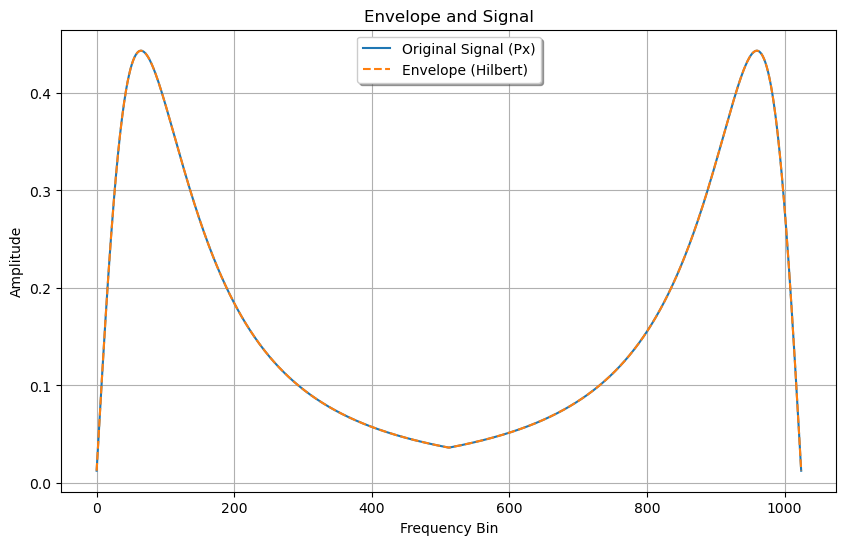

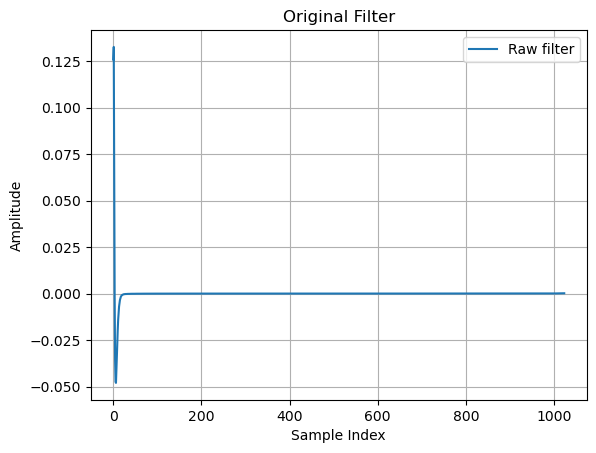

In [11]:
if mode == 'DeLuca':
    burst_1 = []
    #[filtro, Pdeluca, burst_1] = superlet.fdeluca(72, 110, 1024, burst_duration_1, plot = True)
    [filtro, Pdeluca, burst_1, MNF, MNF_analytic] = superlet.fdeluca(100, 80, fs, burst_duration_1, plot = True)
    f = np.arange(0, fs / 2)
    MNF_IDEAL = superlet.meanfreq(Pdeluca,f)
    MNF_1 = [MNF_IDEAL]
    t_onset_1 = burst_start_1
    t_offset_1 = burst_start_1 + burst_duration_1
    # bw = 100
    # nyquist = fs / 2
    # frec_baja = (MNF_1[0] - bw / 2) / nyquist
    # frec_alta = (MNF_1[0] + bw / 2) / nyquist
    # # Diseñar filtro paso banda Butterworth
    # b, a = signal.butter(N=4, Wn=[frec_baja, frec_alta], btype='band')
    # burst_1 = signal.filtfilt(b, a, burst_1)

In [12]:
MNF

111.9768544755227

In [13]:
MNF_IDEAL

110.97685447552273

In [14]:
# burst_1 = []
# # if mode == 'DeLuca':   
# [Pxx_1, burst_1, MNF_1, MDF_1] = superlet.fdeluca_changing(80, 120, 60, 100, fs, T = burst_duration_1, wind_change = burst_duration_1, plot = True)
# #     # nyquist = 0.5 * fs
#     # low = 20 / nyquist
#     # high = 300 / nyquist
#     # b, a = signal.butter(N=4, Wn=[low, high], btype='band')  # Filtro pasa banda
#     # burst_1 = signal.filtfilt(b, a, burst_1)

#### Add noise to the signal with a particular value for SNR

In [15]:
# def add_wgn_to_sig(signal, w_g_noise, ssnnrr):
#     
#     sign_UnitaryVar = (signal - np.mean(signal)) / np.std(signal)
#     Pn = np.var(w_g_noise)
#     Ps = Pn * (10**(ssnnrr / 10))
#     new_signals = np.sqrt(Ps) * sign_UnitaryVar
#     noisy_signal = new_signals + w_g_noise
# 
#     return noisy_signal


In [16]:
def add_noise(x, snr, plot = False):
    """
    Add Gaussian random noise to a signal with a specified SNR.

    Parameters:
        x (numpy array): Original signal (vector)
        snr (float): Desired Signal-to-Noise Ratio (in dB)

    Returns:
        numpy array: Signal with added Gaussian noise
    """
    n = len(x)  # Length of the signal
    Px = np.sum(np.abs(x)**2) / n  # Power of the original signal
    Pn = Px / (10**(snr / 10))  # Noise power for the given SNR

    noise = np.sqrt(Pn) * np.random.randn(*x.shape)  # Generate Gaussian noise
    xn = x + noise  # Add noise to the original signal

    # Plot the original and noisy signals
    if plot:
        plt.figure()
        plt.plot(xn, 'r', label='Noisy Signal')
        plt.plot(x, 'b', label='Original Signal')
        plt.legend()
        plt.title(f'Signal with Added White Gaussian Noise (SNR = {snr} dB)')
        plt.xlabel('Sample Index')
        plt.ylabel('Amplitude')
        plt.show()

    return xn

### We add burst to baseline signal

In [17]:
baseline_1 = noise.copy()
baseline_1[int(burst_start_1*fs):int(burst_start_1*fs + len(burst_1))] += burst_1

In [18]:
# burst_duration_2 = 3
# burst_start_2 = 5
# 
# [Pxx_2, burst_2, MNF_2, MDF_2] = superlet.fdeluca_changing(100, 140, 80, 120, fs, burst_duration_2, 0.125, plot = True)
# # t_2 = np.linspace(0, burst_duration_2, len(burst_2))
# # plt.plot(t_2, burst_2)
# # plt.title('Burst 2')
# # 
# plt.figure()
# psd_welch, f_welch = superlet.compute_psd_welch(burst_2, fs, plot=True, muscle='Burst 2')
# 
# baseline_1[burst_start_2*fs:burst_start_2*fs + len(burst_2)] += burst_2
# # plt.figure()
# # plt.plot(baseline_1)
# # plt.title('Baseline + Burst 2')

In [19]:
# # High frequency and very fast burst
# burst_duration_3 = 0.5
# burst_start_3 = 8.5
# 
# [Pxx_3, burst_3, MNF_3, MDF_3] = superlet.fdeluca_changing(220, 250, 200, 230, fs, burst_duration_3, 0.125, plot = False)
# # t_3 = np.linspace(0, burst_duration_3, len(burst_3))
# # plt.plot(t_3, burst_3)
# # plt.title('Burst 3')
# # 
# # plt.figure()
# psd_welch, f_welch = superlet.compute_psd_welch(burst_3, fs, plot=True, muscle='Burst 3')
# 
# baseline_1[int(burst_start_3 * fs):int(burst_start_3 * fs + len(burst_3))] += burst_3
# # plt.figure()
# # plt.plot(baseline_1)
# # plt.title('Baseline + Burst 3')

### Signal visualization

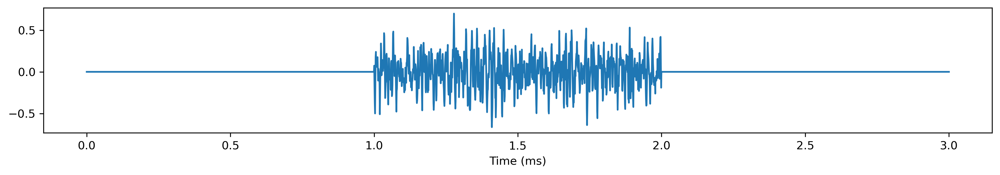

In [20]:
signal = baseline_1
fig, ax = plt.subplots(figsize=(15, 2), dpi=300)
ax.set_xlabel("Time (ms)")
ax.plot(jnp.linspace(0, len(signal)/fs, len(signal)), signal)

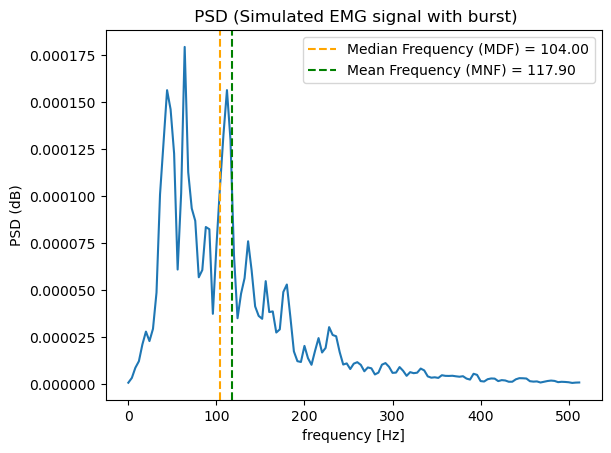

In [21]:
psd_welch, f_welch, MNF = superlet.compute_psd_welch(signal, fs, plot=True, muscle='Simulated EMG signal with burst')
#MNF_1 = [MNF]

We first apply regular wavelet transforms to the signal, with wavelets of 3, 16 and 33 cycles long, respectively. Note that we specifically use the complex Morlet wavelet for both the wavelet and superlet transforms.

In [22]:
MNF_1

[110.97685447552273]

In [23]:
def calculate_mae(estimates, true_value):
    errors = np.abs(np.array(estimates) - true_value)
    mae = np.mean(errors)
    std_error = np.std(np.array(estimates))
    return mae, std_error

In [24]:
freqs = np.linspace(20,500,int(fs/2)) # Número de puntos del vector frecuencia
freq_min = freqs[0]  # Minimum freq
freq_max = freqs[-1]  # Frecuencia máxima
num_freqs = len(freqs)  # Resolución del rango de frecuencias

In [25]:
if 'SNR' not in globals():
    SNR = "Inf"

## WAVELET PARAMETERS = 3, 16, 33, 55, 60, 115 cycles

In [26]:
importlib.reload(morlet)

<module 'superlets_package.morlet' from '/Users/neuralrehabilitationgroup/PycharmProjects/Superlets-Marina/superlets_package/morlet.py'>

In [27]:
importlib.reload(superlet)

<module 'superlets_package.superlets' from '/Users/neuralrehabilitationgroup/PycharmProjects/Superlets-Marina/superlets_package/superlets.py'>

In [28]:
plot_1 = False
plot_2 = False
save = False

In [29]:
offset = 0 # Para que la figura del instant mean frequency sea más mona
offset_burst = 0

In [30]:
#params_wavelet = [3, 16, 33, 55, 60, 115]
params_wavelet = [3, 16, 33, 55, 60]
#params_wavelet = [120, 160, 200, 240, 260, 300]

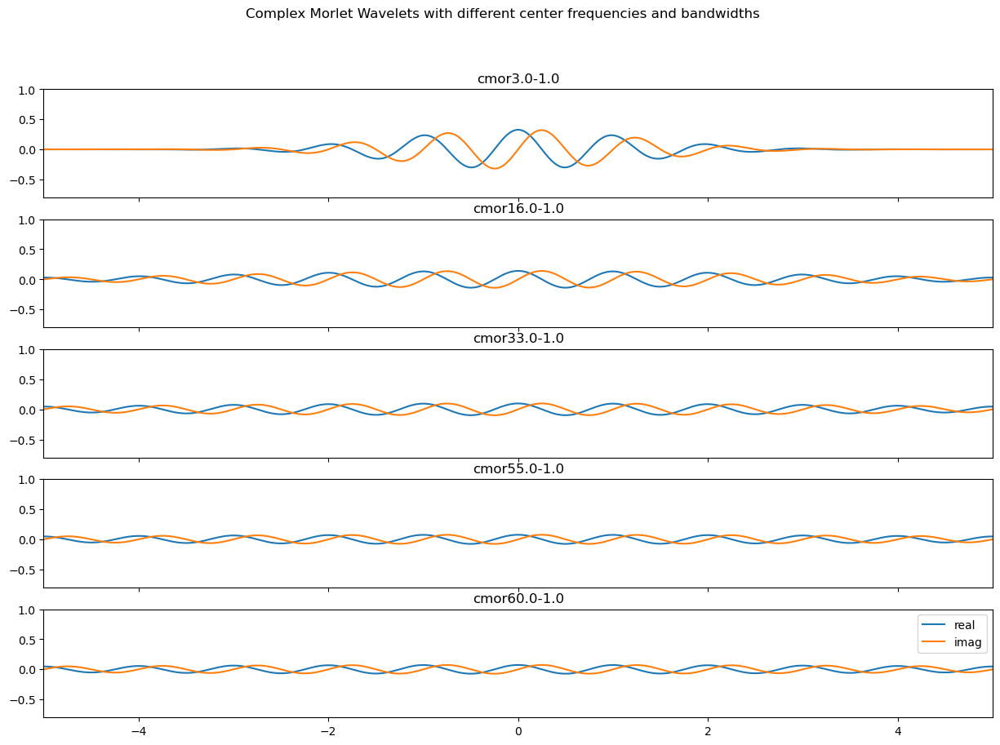

In [31]:
# plot complex morlet wavelets with different center frequencies and bandwidths
import pywt
#wavelets = [f"cmor{x:.1f}-{y:.1f}" for x, y in zip(params_wavelet,[0.5, 1.0, 1.5, 2.0, 2.5, 3.0])]
wavelets = [f"cmor{x:.1f}-{y:.1f}" for x, y in zip(params_wavelet,[1.0, 1.0, 1.0, 1.0, 1.0, 1.0])]
#wavelets = [f"gaus{x:}" for x in params_wavelet]
fig, axs = plt.subplots(len(params_wavelet), figsize=(15, 10), sharex=True, sharey=True)
for ax, wavelet in zip(axs.flatten(), wavelets):
    [psi, x] = pywt.ContinuousWavelet(wavelet).wavefun(10)
    ax.plot(x, np.real(psi), label="real")
    ax.plot(x, np.imag(psi), label="imag")
    ax.set_title(wavelet)
    ax.set_xlim([-5, 5])
    ax.set_ylim([-0.8, 1])
ax.legend()
plt.suptitle("Complex Morlet Wavelets with different center frequencies and bandwidths")
plt.show()

In [32]:
MNF_1

[110.97685447552273]

In [33]:
folder_out = "/Users/neuralrehabilitationgroup/PycharmProjects/Superlets-Marina/RESULTS"
new_folder_path = os.path.join(folder_out, str(round(MNF_1[0], 2)) + ' Hz')
os.makedirs(new_folder_path, exist_ok=True)

119.59091
Onset = 0.9925105828720286, offset = 2.0074894171279714
1.0149788342559427
1
117.112946
Onset = 0.986649299902312, offset = 2.012373819602735
1.0257245197004232
1
116.91602
Onset = 0.981764897427548, offset = 2.0133507000976882
1.0315858026701403
1
117.194916
Onset = 0.972972972972973, offset = 2.014327580592641
1.0413546076196678
1
117.27529
Onset = 0.9710192119830674, offset = 2.014327580592641
1.0433083686095734
1


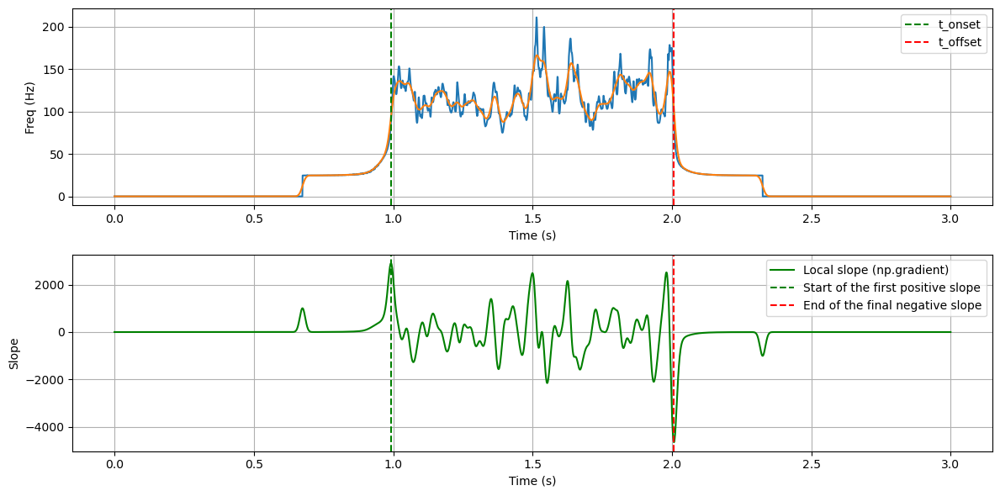

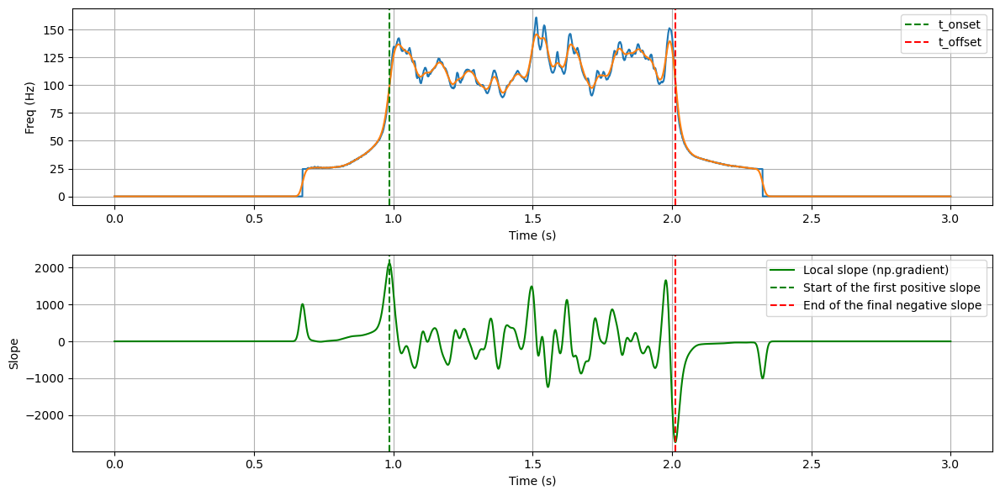

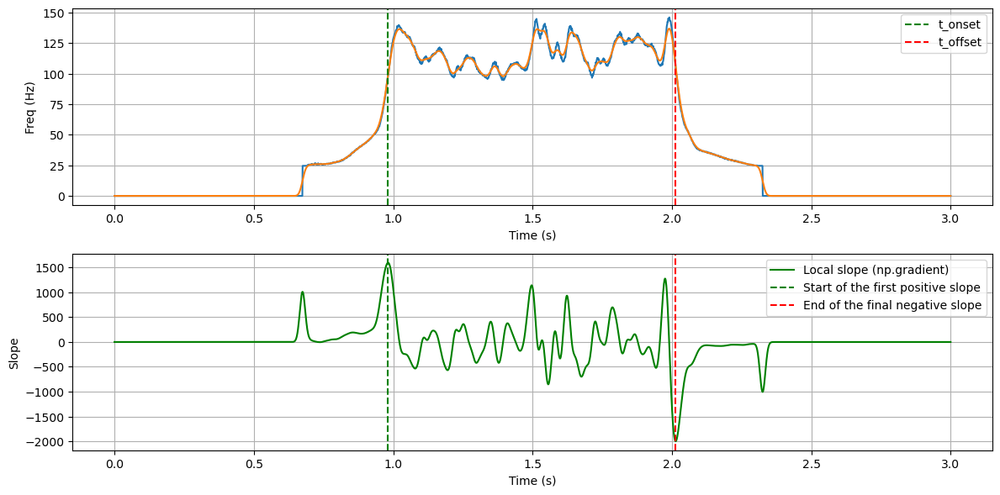

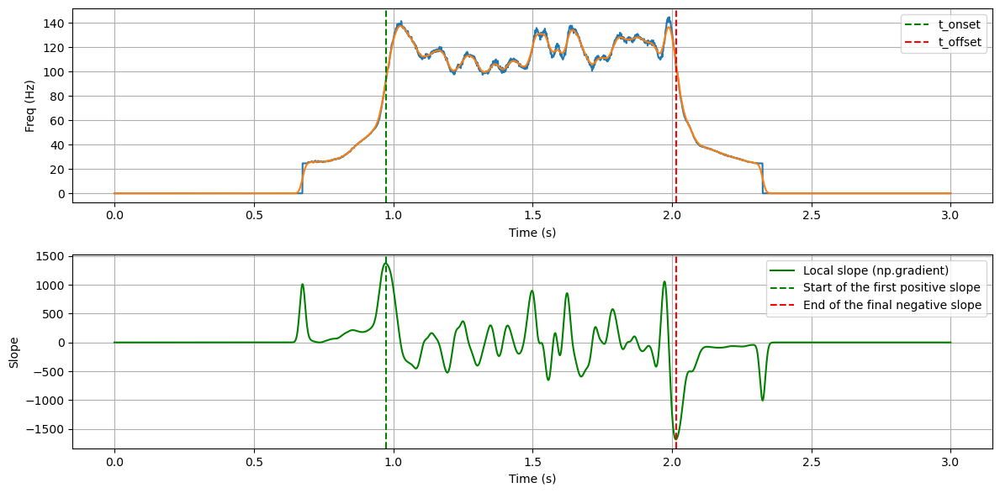

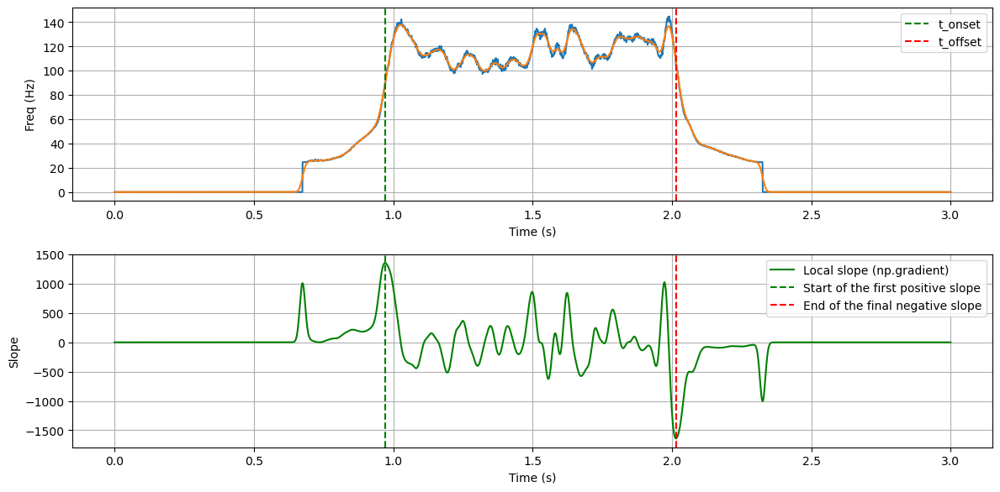

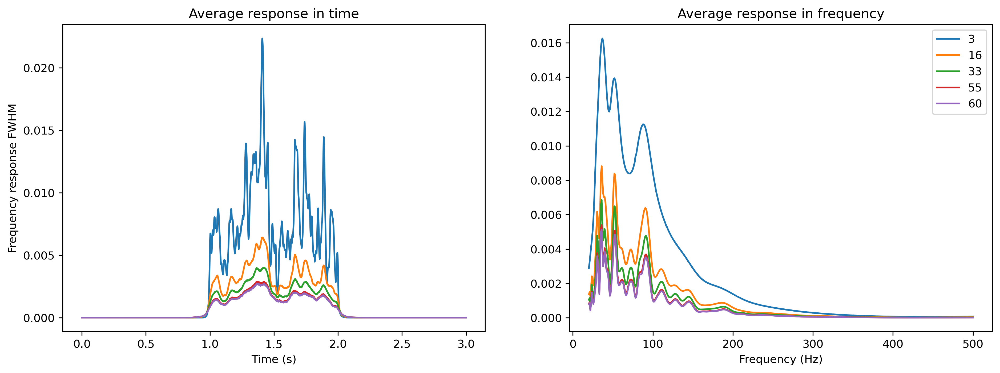

In [34]:
if plot_1:
    fig, ax = plt.subplots(ncols=len(params_wavelet), figsize=(18, 5), dpi=300)
if plot_2:
    # Definir límites de color para que sean iguales en todos los subplots
    fig_2, ax_2 = plt.subplots(ncols=len(params_wavelet), figsize=(18, 5), dpi=300)
    fig_3, ax_3 = plt.subplots(figsize=(10, 6))

mae_wavelet_f = []
std_wavelet_f = []

mae_wavelet_t = []
std_wavelet_t = []

total_time = []
total_freq = []

total_scalogram_wavelet = []
res_wavelet = []

# Iterar sobre los parámetros de wavelet
for i, c in enumerate(params_wavelet):
    wavelet = f"cmor{c}-1.0"

    cwtmatr, f, physical_freqs = morlet.wavelet_transform_2(signal,wavelet,freqs,fs)
    cwtmatr = np.abs(cwtmatr[:, :])
    
    if save:
        df = pd.DataFrame(cwtmatr)
    
        # Guardar en un archivo CSV
        filename = os.path.join(new_folder_path, str(SNR) + "dB_wv_" + str(c) + ".csv")
        df.to_csv(filename, index=False, header=False)  # Sin índices ni encabezados
    
    scalogram_2 = jnp.abs(cwtmatr)**2

    if plot_1:
        pcm = ax[i].pcolormesh(t,f, scalogram_2, shading='gouraud', cmap='jet')
        
        ax[i].set_title(f'c={c}')
        ax[i].set_ylabel('Frecuencia [Hz]')
        ax[i].set_xlabel('Tiempo [s]')
        
        cbar = fig.colorbar(pcm, ax=ax[i], orientation='horizontal')
        cbar.set_label('Power', rotation=0, labelpad=15)  # Etiqueta de la colorbar
    
        ax[i].set_ylim(freqs[0], freqs[-1])  # Ajustar el rango de frecuencias si es necesario
        plt.tight_layout()

    total_scalogram_wavelet.append(scalogram_2)
    instant_mean_freq_total = []

    denominador = np.sum(scalogram_2, axis=0)
    denominador = np.where(denominador == 0, 1e-10, denominador)
    instant_freq = np.sum(scalogram_2 * f[:, np.newaxis], axis=0) / denominador
    
    # b, a = signal_scipy.butter(4, 5/(0.5 * 1024), btype='low', analog=False)
    # envelope = signal_scipy.filtfilt(b, a, instant_freq)
    # 
    # plt.figure()
    # plt.plot(envelope, label=f"Envelope {c}")
    # plt.legend()
    
    # # Identificar la anchura de la meseta (cuando la señal es 1)
    # threshold_value = 30  # El valor constante de la meseta
    # indices_meseta = np.where(instant_freq >= threshold_value)[0]
    # 
    # # Calcular la anchura
    # if len(indices_meseta) > 0:
    #     # La anchura es la diferencia entre el primer y el último índice de la meseta
    #     anchura = indices_meseta[-1] - indices_meseta[0]
    #     print(f"La anchura de la meseta es: {anchura} samples = {anchura / fs} s")
    # else:
    #     print("No se encuentra una meseta en la señal")
    #     
    # t_onset = t[indices_meseta[0]]
    # t_offset = t[indices_meseta[-1]]
    # 
    # plt.figure()
    # plt.plot(t, instant_freq, label=f"{c}")
    # plt.axvline(x=t[indices_meseta[0]], color='r', linestyle='--', label=f"t_onset={t[indices_meseta[0]]:.2f}s")
    # plt.axvline(x=t[indices_meseta[-1]], color='g', linestyle='--', label=f"t_offset={t[indices_meseta[-1]]:.2f}s")
    # plt.legend()

    # OBTAIN THE POINTS IN TIME WHERE BURST IS DETECTED
    # slope_threshold = 600
    
    from scipy.ndimage import gaussian_filter1d
    # 1. Compute the derivative to see the slope
    sigma = 10  # Desviación estándar del filtro
    y_smooth = gaussian_filter1d(instant_freq, sigma)

    # Calcular pendientes locales usando np.gradient sobre la señal suavizada
    slope_gradient = np.gradient(y_smooth, t)
    #slope_gradient = np.gradient(instant_freq, t)
    
    time_range = len(slope_gradient)//2
    time_shift = round(burst_duration_1 * 0.7 * fs)
    inicio = time_range-time_shift
    
    first_index = np.argmax(slope_gradient[inicio:time_range]) + inicio
    last_index = np.argmin(slope_gradient[time_range:time_range+time_shift]) + time_range  # Índice del mínimo más significativo
    
    # Encontrar el índice de la pendiente ascendente más pronunciada
    
    
    # # Start of the first positive slope
    # first_positive_index = np.where(slope_gradient > slope_threshold)[0][0]
    # 
    # # End of the final negative slope
    # last_negative_index = np.where(slope_gradient < -slope_threshold)[0][-1]
    
    t_onset = t[first_index]
    t_offset = t[last_index]
    
    # Visualization
    plt.figure(figsize=(12, 6))

    plt.subplot(2, 1, 1)
    plt.plot(t, instant_freq)
    plt.plot(t, y_smooth)
    plt.axvline(t_onset, color='green', linestyle='--', label='t_onset')
    plt.axvline(t_offset, color='red', linestyle='--', label='t_offset')
    plt.xlabel('Time (s)')
    plt.ylabel('Freq (Hz)')
    plt.legend()
    plt.grid()
    
    # Slopes and t_onset and t_offset
    plt.subplot(2, 1, 2)
    plt.plot(t, slope_gradient, 'g-', label='Local slope (np.gradient)')
    plt.axvline(t[first_index], color='green', linestyle='--', label='Start of the first positive slope')
    plt.axvline(t[last_index], color='red', linestyle='--', label='End of the final negative slope')
    plt.xlabel('Time (s)')
    plt.ylabel('Slope')
    plt.legend()
    plt.grid()

    plt.tight_layout()

    start_idx = np.searchsorted(t, burst_start_1)  # Encuentra el índice de inicio
    end_idx = np.searchsorted(t, burst_start_1 + burst_duration_1)  # Encuentra el índice final
#
    instant_mean_freq_burst = instant_freq[start_idx:end_idx]

    if plot_2:
        ax_2[i].plot(t, instant_freq)

        ax_2[i].set_xlabel("Time (s)")
        ax_2[i].set_ylabel("Frequency (Hz)")
        #ax_2[i].set_xlim(t[0], t[-1])
        #plt.title("Medias de cada fila en función del tiempo")
        ax_2[i].grid(True)

        ax_3.plot(t, instant_freq, label=f"Mean frequency (Cycles: {c})")
        plt.tight_layout()

    #MAE in frequency
    print(np.mean(instant_mean_freq_burst))
    mae_f, std_f = calculate_mae(instant_mean_freq_burst, MNF_1)
    mae_wavelet_f.append(mae_f)
    std_wavelet_f.append(std_f)
    
    #MAE in time
    print(f'Onset = {t_onset}, offset = {t_offset}')
    estimates_combined = t_offset - t_onset
    print(estimates_combined)
    true_values_combined = t_offset_1 - t_onset_1
    print(true_values_combined)

    mae_t, std_t = calculate_mae(estimates_combined, true_values_combined)
    mae_wavelet_t.append(mae_t)
    std_wavelet_t.append(std_t)

    time = np.arange(scalogram_2.shape[1]) / fs

    total_time.append(time)
    total_freq.append(freqs)

# Configuración del gráfico
if plot_2:
    ax_3.set_xlabel("Time (s)")
    ax_3.set_ylabel("Frequency (Hz)")
    ax_3.legend()
    ax_3.grid(True)
    ax_3.set_title("Comparación de frecuencias medias instantáneas")

res_wavelet = superlet.compute_avg_response_resolution(total_scalogram_wavelet, total_time, total_freq, params_wavelet)

In [35]:
mae_wavelet_f

[17.98834143654191,
 12.294081253115408,
 10.789174868636747,
 10.107083429131656,
 10.040272115074695]

In [36]:
mae_wavelet_t

[0.014978834255942708,
 0.02572451970042322,
 0.03158580267014033,
 0.041354607619667805,
 0.04330836860957343]

### Wavelet visualization

In [37]:
# import matplotlib.pyplot as plt
# 
# # Supongamos que la frecuencia central de cada wavelet varía en un rango de frecuencias
# frequencies = jnp.linspace(1, 50, 141)  # Por ejemplo, de 1 a 50 Hz con 141 frecuencias
# 
# # Define un vector de tiempo
# t = jnp.linspace(-1, 1, 2048)  # Tiempo con 2048 puntos
# 
# # Grafica la wavelet para una frecuencia específica (por ejemplo, la frecuencia central de 20 Hz)
# freq_idx = 70  # Índice de frecuencia alrededor de la mitad del rango
# plt.plot(t, jnp.real(wv[freq_idx]), label=f'Wavelet en {frequencies[freq_idx]:.2f} Hz')
# plt.xlabel("Tiempo (s)")
# plt.ylabel("Amplitud")
# plt.title("Parte Real de la Wavelet Morlet a una Frecuencia Específica")
# plt.xlim(-1.3, 1.3)
# plt.legend()
# plt.show()



In [38]:
# plt.imshow(jnp.abs(wv), aspect='auto', extent=[-1, 1, frequencies[-1], frequencies[0]], cmap='viridis')
# plt.colorbar(label="Amplitud")
# plt.xlabel("Tiempo (s)")
# plt.ylabel("Frecuencia (Hz)")
# plt.title("Representación Tiempo-Frecuencia de la Wavelet")
# plt.show()


There's a tradeoff above; using a low number of cycles results in high temporal resolution, but poor frequency resolution (the activations are "smeared" on the frequency dimension). On the other hand, a high number of cycles results in high frequency resolution, but poor temporal resolution. 

There are fundamental limits to how precise we can be on *both* aspects without making a tradeoff on either (the Gabor limit), but the standard wavelet transform isn't on that optimal boundary. Superlets improve resolution on both (time *and* frequency) by taking the geometric mean of wavelet transforms of different cycle lengths, more tightly approaching the Gabor limit.

## PARÁMETROS SUPERLET: base_cycle, min_order, max_order = [3, 5, 1, 1, 1, 1], [1, 1, 5, 10, 20, 30], [30, 30, 40, 100, 100, 200]

In [39]:
importlib.reload(superlet)

<module 'superlets_package.superlets' from '/Users/neuralrehabilitationgroup/PycharmProjects/Superlets-Marina/superlets_package/superlets.py'>

In [40]:
plot_1 = False
plot_2 = False
save = False

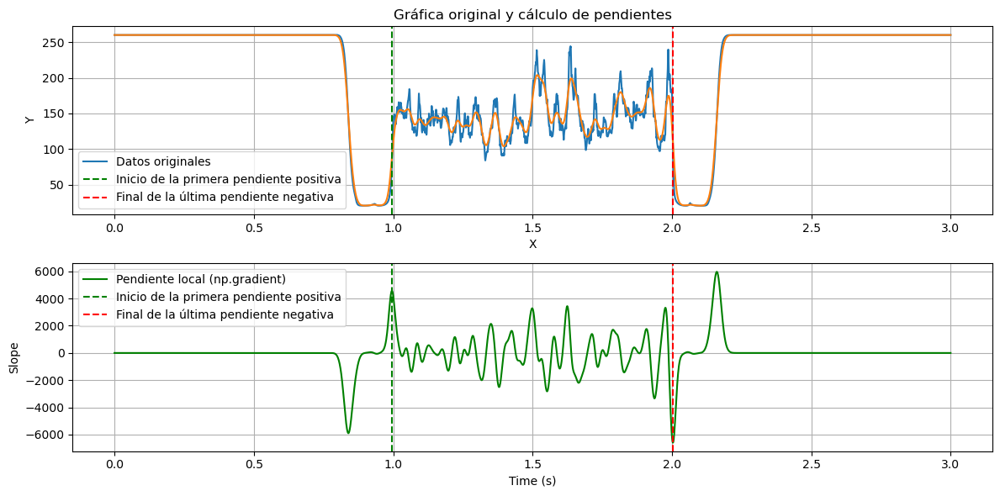

145.68263516857658
Onset = 0.995441224356887, offset = 2.00358189514816
1.0081406707912732
1


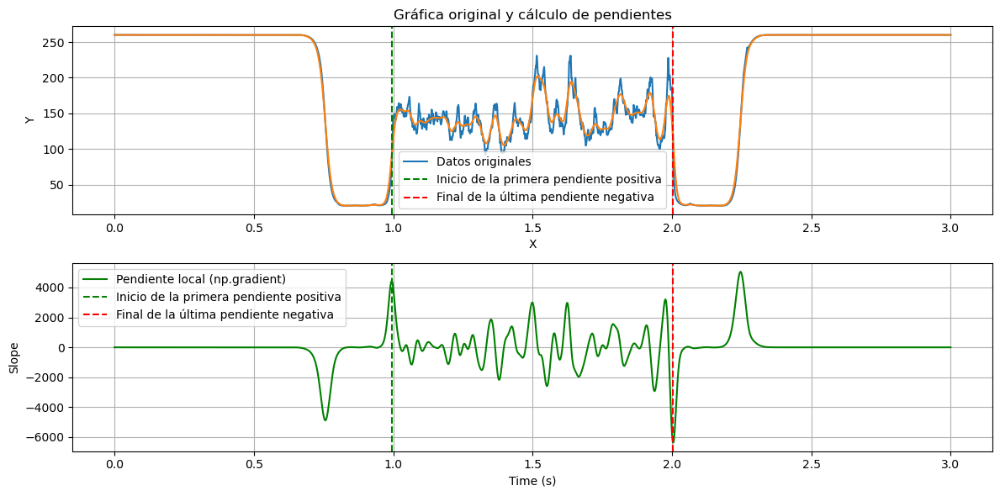

145.07106407066493
Onset = 0.9944643438619343, offset = 2.004558775643113
1.0100944317811789
1


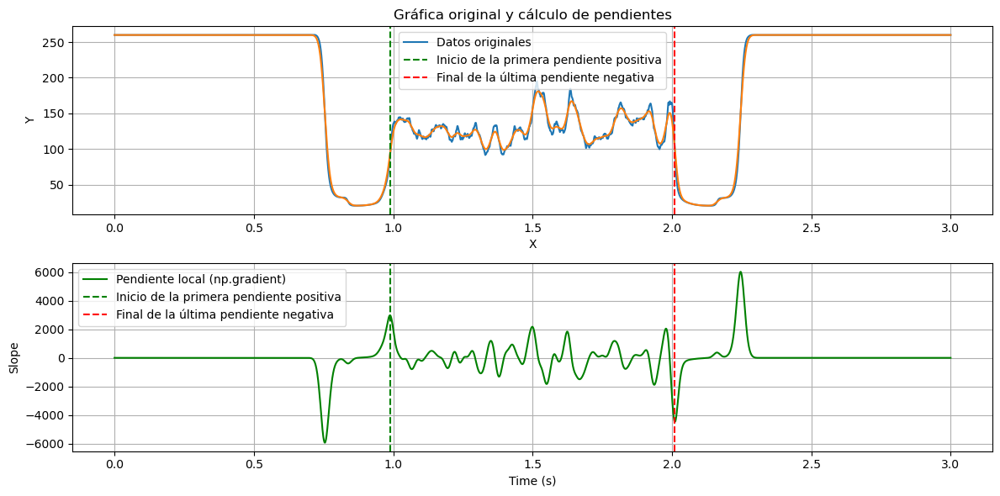

130.1480748259729
Onset = 0.9886030608922175, offset = 2.0104200586128296
1.0218169977206122
1


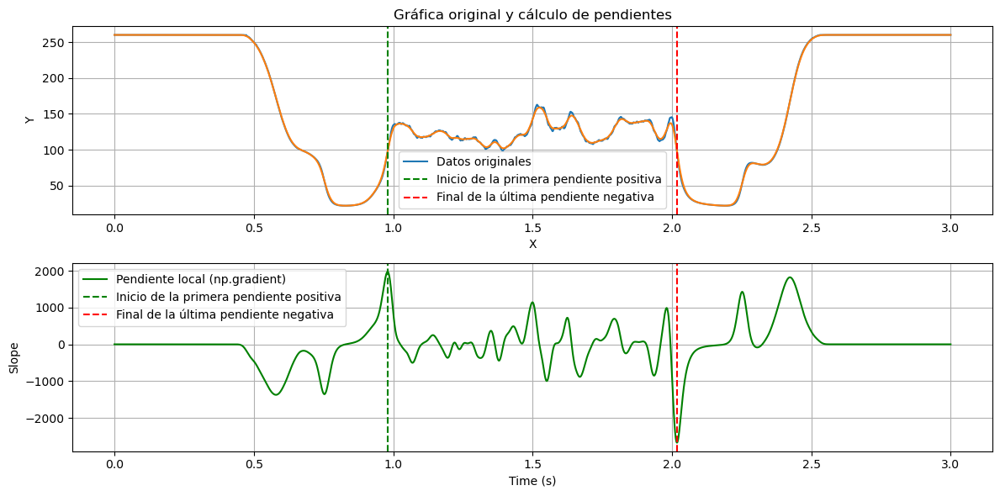

125.27625465568408
Onset = 0.9798111364376425, offset = 2.018235102572452
1.0384239661348096
1


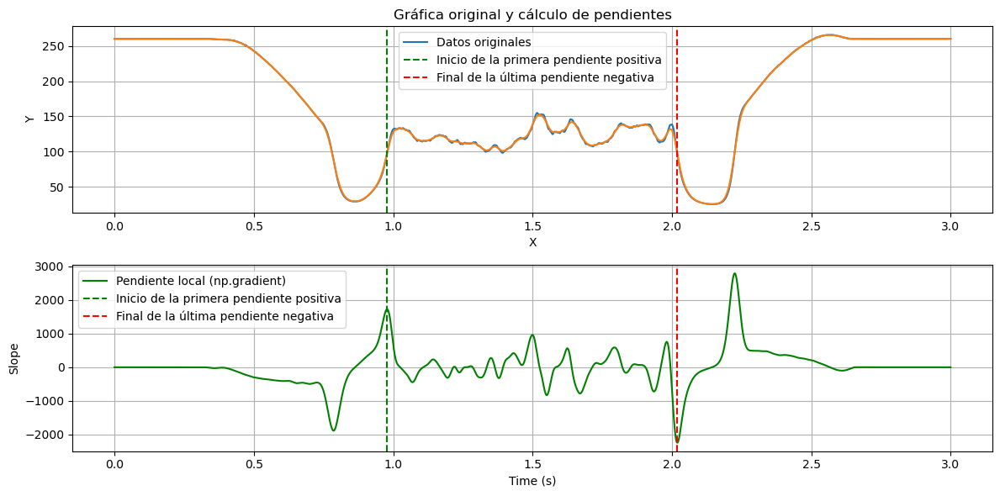

122.56002792465178
Onset = 0.9778573754477369, offset = 2.0192119830674047
1.0413546076196678
1


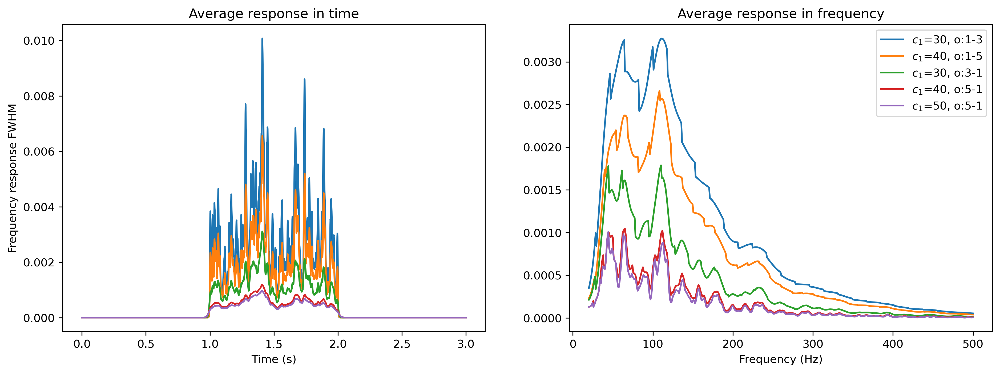

In [41]:
#params_superlet = [[3, 5, 1, 1, 1, 1], [1, 1, 5, 10, 20, 30], [30, 30, 40, 100, 100, 200]]
#params_superlet = [[3, 5, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1], [10, 10, 20, 50, 60, 70]]
#params_superlet = [[1, 3, 5, 1], [3, 1, 1, 5], [30, 30, 40, 40]]
params_superlet = [[1, 1, 3, 5, 5], [3, 5, 1, 1, 1], [30, 40, 30, 40, 50]]

#params_superlet = [[3, 5, 1, 1, 1, 1], [10, 10, 20, 30, 30, 40], [30, 30, 40, 100, 100, 200]]


#params_superlet = [[3,5,1],[1,1,5],[30,30,40]]

if plot_1:
    fig, ax = plt.subplots(ncols=len(params_superlet[0]), figsize=(15, 5), dpi=300)

if plot_2:
    fig_2, ax_2 = plt.subplots(ncols=len(params_superlet[0]), figsize=(15, 5), dpi=300)
    fig_3, ax_3 = plt.subplots(figsize=(10, 6))

mae_superlet_f = []
std_superlet_f = []

mae_superlet_t = []
std_superlet_t = []

total_time = []
total_freq = []

total_scalogram_superlet = []

#enumerate(zip([3,5,1], [1,1,5], [30,30,40])):
#enumerate(zip([1,1,1], [10,20,30], [100,100,200])):
for (i, (base_cycle, min_order, max_order)) in enumerate(zip(*params_superlet)):

    wv, scalogram = superlet.adaptive_superlet_transform(signal, freqs, sampling_freq=fs,
                                                         base_cycle=base_cycle, min_order=min_order,
                                                         max_order=max_order, mode="mul")
    
    if plot_1:
        im = ax[i].imshow(jnp.abs(scalogram) ** 2, aspect='auto', cmap="jet", interpolation="none", origin="lower",extent=[0, len(signal) / fs, freqs[0], freqs[-1]])
        ax[i].set_title(f"$c_1$: {base_cycle}, o: {min_order}-{max_order}")
        ax[i].set_xlabel("Time (s)")
        ax[i].set_ylabel("Frequency (Hz)")

        cbar = fig.colorbar(im, ax=ax[i], orientation='horizontal')
        cbar.set_label('Power [a.u]', rotation=0, labelpad=15)  # Etiqueta de la colorbar
        plt.tight_layout()

    scalogram_2 = np.abs(scalogram) ** 2
    
    if save:
        df = pd.DataFrame(scalogram_2)
    
        # Guardar en un archivo CSV
        filename = os.path.join(new_folder_path,str(SNR) + "dB_superlet_" + str(base_cycle) + "-" + str(min_order) + "-" + str(max_order) + ".csv")
        df.to_csv(filename, index=False, header=False)  # Sin índices ni encabezados

    # if np.any(np.isnan(jnp.abs(scalogram) ** 2)) or np.any(np.isinf(jnp.abs(scalogram) ** 2)):
    #     scalogram_2 = np.nan_to_num(jnp.abs(scalogram) ** 2)

    instant_mean_freq_total = []
    total_scalogram_superlet.append(scalogram_2)
    #scalogram_2 = scalogram_2 * freqs[:, np.newaxis]
    
    instant_freq = np.sum(scalogram_2 * freqs[:, np.newaxis], axis=0) / np.sum(scalogram_2, axis=0)
    
    # 1. Compute the derivative to see the slope

    y_smooth = gaussian_filter1d(instant_freq, sigma)

    # 1. Calcular la pendiente entre puntos consecutivos (np.diff)
    #slope_diff = np.diff(instant_freq) / np.diff(t)
    
    # 2. Calcular la pendiente general ajustando una línea recta (np.polyfit)
    slope_gradient = np.gradient(y_smooth, t)  # Grado 1 para línea recta
    
    time_range = len(slope_gradient)//2
    time_shift = round(burst_duration_1 * 0.7 * fs)
    inicio = time_range-time_shift
    
    first_index = np.argmax(slope_gradient[inicio:time_range]) + inicio
    last_index = np.argmin(slope_gradient[time_range:time_range+time_shift]) + time_range  # Índice del mínimo más significativo
    
    t_onset = t[first_index]
    t_offset = t[last_index]
    
    # Visualización
    plt.figure(figsize=(12, 6))
    
    # Gráfica original
    plt.subplot(2, 1, 1)
    plt.plot(t, instant_freq, label='Datos originales')
    plt.plot(t, y_smooth)
    plt.axvline(t_onset, color='green', linestyle='--', label='Inicio de la primera pendiente positiva')
    plt.axvline(t_offset, color='red', linestyle='--', label='Final de la última pendiente negativa')
    plt.title('Gráfica original y cálculo de pendientes')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.legend()
    plt.grid()
    
    # Gráfica de pendientes
    # Gráfica de pendientes
    plt.subplot(2, 1, 2)
    # plt.plot(t[:-1], slope_diff, 'r--', label='Pendiente entre puntos consecutivos (np.diff)')
    plt.plot(t, slope_gradient, 'g-', label='Pendiente local (np.gradient)')
    plt.axvline(t_onset, color='green', linestyle='--', label='Inicio de la primera pendiente positiva')
    plt.axvline(t_offset, color='red', linestyle='--', label='Final de la última pendiente negativa')
    plt.xlabel('Time (s)')
    plt.ylabel('Slope')
    plt.legend()
    plt.grid()

    plt.tight_layout()
    plt.show()
      

    initial_imnf = instant_freq[:round(burst_start_1 * fs) - offset]
    instant_mean_freq_total.extend(initial_imnf)
    # plt.figure()
    # plt.plot(initial_imnf)

    instant_mean_freq_burst = instant_freq[
                              round(burst_start_1 * fs):round((burst_start_1 + burst_duration_1) * fs)]
    instant_mean_freq_burst = instant_mean_freq_burst[offset_burst:round(len(instant_mean_freq_burst)) - offset_burst]
    instant_mean_freq_total.extend(instant_mean_freq_burst)

    final_imnf = instant_freq[round((burst_start_1 + burst_duration_1) * fs) + offset:]
    instant_mean_freq_total.extend(final_imnf)
    # plt.figure()
    # plt.plot(final_imnf)
    # plt.figure()
    # plt.plot(instant_mean_freq_total)

    if plot_2:
        ax_2[i].plot(t, instant_mean_freq_total,
                     label="Mean frequency (each window of " + str(len(freqs)) + ' samples)')

        ax_2[i].set_xlabel("Time (s)")
        ax_2[i].set_ylabel("Frequency (Hz)")
        #ax_2[i].set_xlim(tiempo[0], tiempo[-1])
        #plt.title("Medias de cada fila en función del tiempo")
        ax_2[i].legend()
        ax_2[i].grid(True)

        ax_3.plot(t, instant_mean_freq_total, label=f"Mean frequency (Cycles: {base_cycle})")

     #MAE in frequency
    print(np.mean(instant_mean_freq_burst))
    mae_f, std_f = calculate_mae(instant_mean_freq_burst, MNF_1)
    mae_superlet_f.append(mae_f)
    std_superlet_f.append(std_f)
    
    #MAE in time
    print(f'Onset = {t_onset}, offset = {t_offset}')
    estimates_combined = t_offset - t_onset
    print(estimates_combined)
    true_values_combined = t_offset_1 - t_onset_1
    print(true_values_combined)

    mae_t, std_t = calculate_mae(estimates_combined, true_values_combined)
    mae_superlet_t.append(mae_t)
    std_superlet_t.append(std_t)

    time = np.arange(scalogram_2.shape[1]) / fs

    total_time.append(time)
    total_freq.append(freqs)

    # Compute MAE in time
    # freq_tolerance = 10
    # time_support = (instant_mean_freq_total >= MNF_1[0] - freq_tolerance) & (instant_mean_freq_total <= MNF_1[0] + freq_tolerance)
    # detected_times = tiempo[time_support]
    # detected_start = detected_times[0] if len(detected_times) > 0 else None
    # detected_end = detected_times[-1] if len(detected_times) > 0 else None
    #
    # if detected_start is not None and detected_end is not None:
    #     errors = [abs(burst_start_1 - detected_start), abs((burst_start_1 + burst_duration_1) - detected_end)]
    #     # Calcular MAE
    #     mae_time = np.mean(errors)
    #     # Calcular STD
    #     std_time = np.std(errors)
    # else:
    #     mae_time = float('nan')  # No se detectó el burst correctamente
    #     std_time = float('nan')
    #
    # mae_superlet_t.append(mae_time)
    # std_superlet_t.append(std_time)

    total_time.append(t)
    total_freq.append(freqs)

if plot_2:
    ax_3.set_xlabel("Time (s)")
    ax_3.set_ylabel("Frequency (Hz)")
    ax_3.legend()
    ax_3.grid(True)
    ax_3.set_title("Comparación de frecuencias medias instantáneas")

res_superlet = superlet.compute_avg_response_resolution(total_scalogram_superlet, total_time, total_freq, [f'$c_1$={c3}, o:{c1}-{c2}' for c1, c2, c3 in zip(*params_superlet)])

In [42]:
mae_superlet_f

[36.17019356405298,
 35.077817523641066,
 21.469213631336924,
 15.666614972193917,
 13.456367223831096]

In [43]:
mae_superlet_t

[0.00814067079127323,
 0.010094431781178859,
 0.021816997720612186,
 0.038423966134809584,
 0.041354607619667805]

## STFT PARAMETERS (window = duration/cycles) = 38, 200, 413, 550, 600, 824 ms

In [44]:
importlib.reload(superlet)

<module 'superlets_package.superlets' from '/Users/neuralrehabilitationgroup/PycharmProjects/Superlets-Marina/superlets_package/superlets.py'>

In [45]:
offset_burst = 0
offset = 0

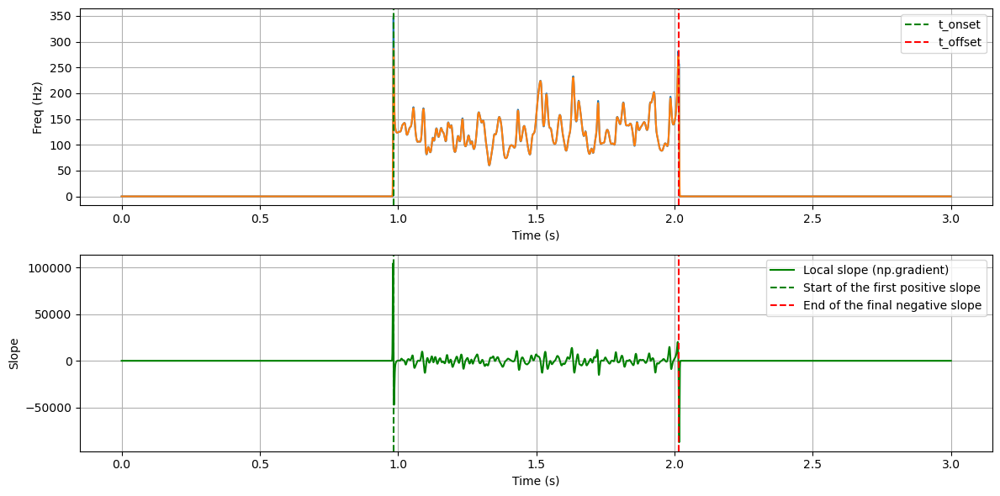

126.17228397876453
Onset = 0.982421875, offset = 2.0166015625
1.0341796875
1


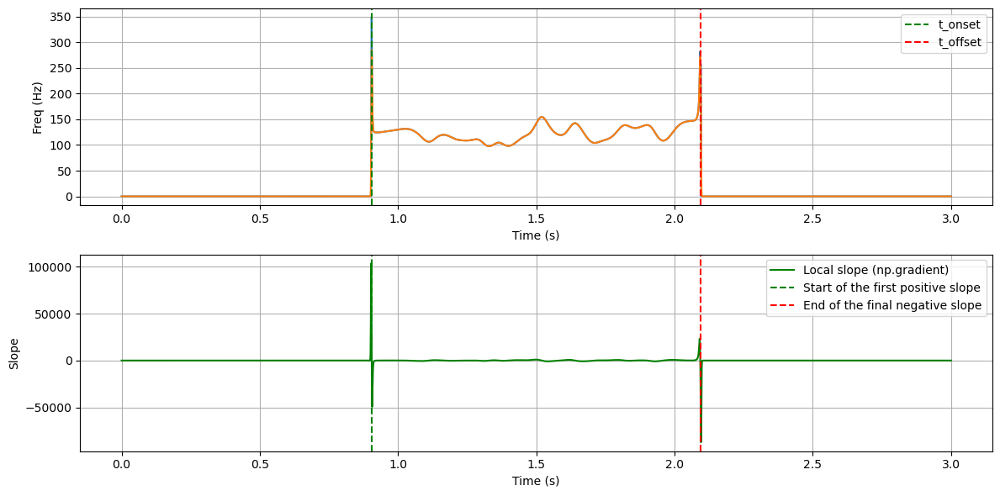

119.78608219142242
Onset = 0.9033203125, offset = 2.095703125
1.1923828125
1


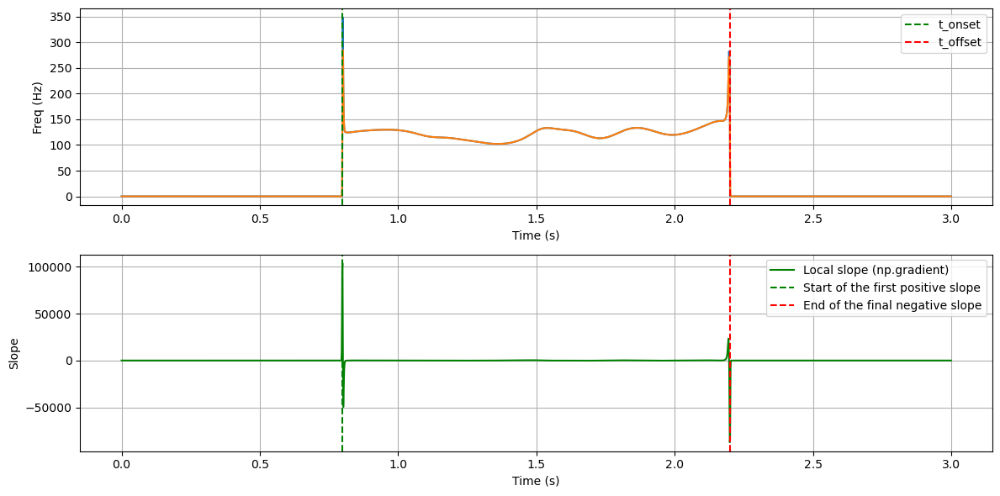

119.05042360474748
Onset = 0.798828125, offset = 2.19921875
1.400390625
1


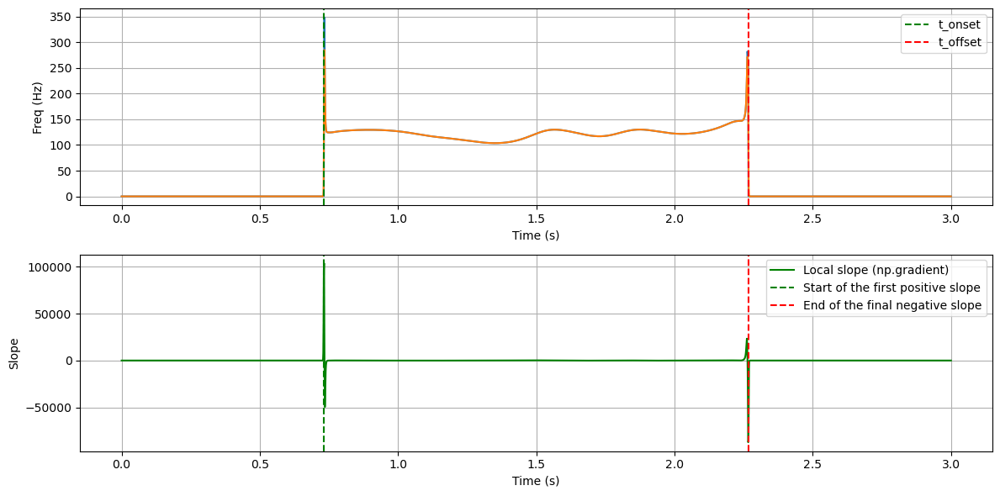

118.67089426780552
Onset = 0.732421875, offset = 2.2666015625
1.5341796875
1


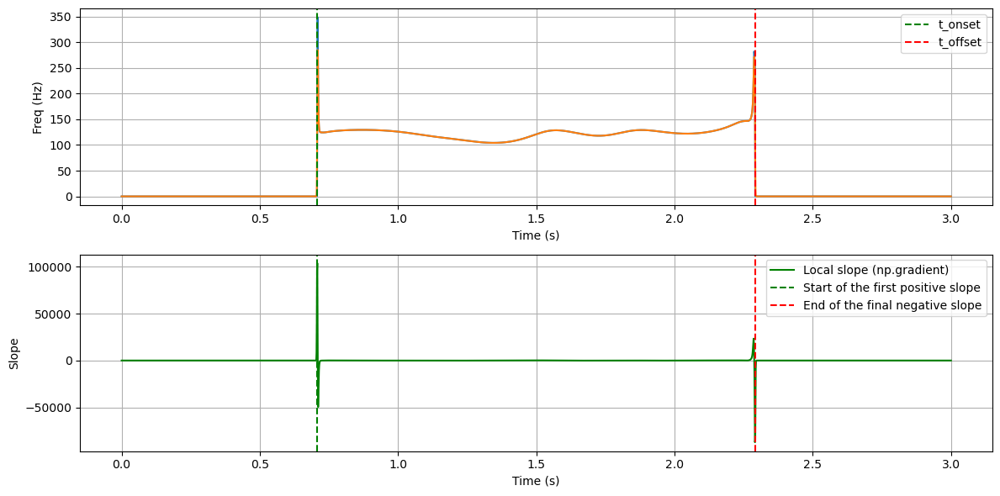

118.54454235482237
Onset = 0.7080078125, offset = 2.291015625
1.5830078125
1


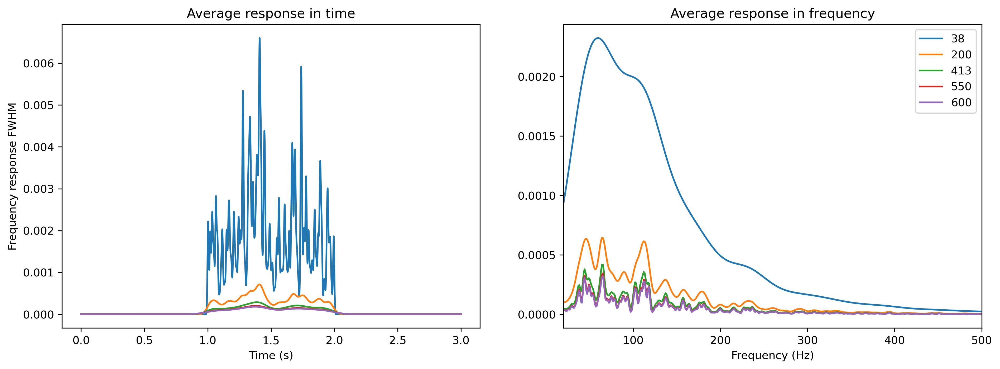

In [52]:
from scipy.signal import stft
from scipy.signal import windows

# Parámetros de la STFT con ventanas de 38 ms, 200 ms, y 413 ms (convertido a muestras)
# [38, 200, 413, 550, 600, 824]
#windows_ms = [38, 200, 413, 550, 600, 824]
windows_ms = [38, 200, 413, 550, 600]
#windows_samples = [int((w / 1000) * fs) for w in windows_ms]  # Convertir a muestras

if plot_1:
    fig, ax = plt.subplots(ncols=len(windows_ms), figsize=(15, 5), dpi=300)

if plot_2:
    fig_2, ax_2 = plt.subplots(ncols=len(windows_ms), figsize=(15, 5), dpi=300)
    fig_3, ax_3 = plt.subplots(figsize=(10, 6))

mae_stft_f = []
std_stft_f = []

mae_stft_t = []
std_stft_t = []

total_time = []
total_freq = []

res_stft = []
total_scalogram_stft = []

for i, w in enumerate(windows_ms):
    # Calcular la ventana Blackman
    window = windows.blackman(w)
    
    # Hacer que la f de la stft tenga el mismo tamaño que las demás
    nfft = 2 * (len(freqs))
    # Dimensión de la frecuencia = nfft/2 + 1
    # Dimesión del tiempo = [(N - noverlap)/(nperseg-noverlap)] + 1 = 
    
    # Realizar la STFT con la ventana Blackman y superposición del 50%
    #f, t, Zxx = stft(signal, fs, window=window, nfft=nfft, nperseg=w, noverlap=w//2, padded=True, scaling='psd')
    f, t_stft, Zxx = stft(signal, fs=fs, window='blackman', nperseg=w, noverlap=w-1, nfft=nfft, detrend=False, return_onesided=True, boundary='zeros', padded=True, axis=-1, scaling='spectrum')
    
    # ax[i].pcolormesh(t, f, np.abs(Zxx), shading='gouraud', cmap='jet')
    
    # Calcular la representación de potencia (magnitud al cuadrado)
    Zxx_power = np.abs(Zxx) ** 2
    
    # Graficar la representación de potencia
    #plt.figure(figsize=(10, 6))
    
    if plot_1:
        pcm = ax[i].pcolormesh(t_stft, f, Zxx_power, shading='gouraud', cmap='jet')
        
        ax[i].set_title(f'W={w * 1000 // fs} ms')
        ax[i].set_ylabel('Frecuencia [Hz]')
        ax[i].set_xlabel('Tiempo [s]')
        
        cbar = fig.colorbar(pcm, ax=ax[i], orientation='horizontal')
        cbar.set_label('Power', rotation=0, labelpad=15)  # Etiqueta de la colorbar
    
        #fig.colorbar(pcm, ax=ax[i], label='Potencia')
        ax[i].set_ylim(freqs[0], freqs[-1])  # Ajustar el rango de frecuencias si es necesario
        plt.tight_layout()
    
    scalogram_2 = Zxx_power
    
    #if np.any(np.isnan(jnp.abs(Zxx)**2)) or np.any(np.isinf(jnp.abs(Zxx)**2)):
    #scalogram_2 = jnp.nan_to_num(jnp.abs(Zxx)**2, nan=0.0, posinf=0.0, neginf=0.0)
    
    if save:
        df = pd.DataFrame(scalogram_2)
    
        # Guardar en un archivo CSV
        filename = os.path.join(new_folder_path, str(SNR) + "dB_stft_" + str(w) + ".csv")
        df.to_csv(filename, index=False, header=False)  # Sin índices ni encabezados
        
    total_scalogram_stft.append(scalogram_2)
 
    instant_mean_freq_total = []   
    
    # Para evitar la división por cero
    denominador = np.sum(scalogram_2, axis=0)
    denominador = np.where(denominador == 0, 1e-10, denominador)
    instant_freq = np.sum(scalogram_2 * f[:, np.newaxis], axis=0) / denominador
    
    # OBTAIN THE POINTS IN TIME WHERE BURST IS DETECTED
    slope_threshold = 450
    
    from scipy.ndimage import gaussian_filter1d
    # 1. Compute the derivative to see the slope
    sigma = 1  # Desviación estándar del filtro
    y_smooth = gaussian_filter1d(instant_freq, sigma)

    # Calcular pendientes locales usando np.gradient sobre la señal suavizada
    slope_gradient = np.gradient(y_smooth, t_stft)
    #slope_gradient = np.gradient(instant_freq, t)
    
    time_range = len(slope_gradient)//2
    time_shift = round(burst_duration_1 * fs)
    inicio = time_range-time_shift
    
    first_index = np.argmax(slope_gradient[inicio:time_range]) + inicio
    last_index = np.argmin(slope_gradient[time_range:time_range+time_shift]) + time_range  # Índice del mínimo más significativo
    
    t_onset = t_stft[first_index]
    t_offset = t_stft[last_index]
    
    # Visualization
    plt.figure(figsize=(12, 6))

    plt.subplot(2, 1, 1)
    plt.plot(t_stft, instant_freq)
    plt.plot(t_stft, y_smooth)
    plt.axvline(t_onset, color='green', linestyle='--', label='t_onset')
    plt.axvline(t_offset, color='red', linestyle='--', label='t_offset')
    plt.xlabel('Time (s)')
    plt.ylabel('Freq (Hz)')
    plt.legend()
    plt.grid()
    
    # Slopes and t_onset and t_offset
    plt.subplot(2, 1, 2)
    plt.plot(t_stft, slope_gradient, 'g-', label='Local slope (np.gradient)')
    plt.axvline(t_onset, color='green', linestyle='--', label='Start of the first positive slope')
    plt.axvline(t_offset, color='red', linestyle='--', label='End of the final negative slope')
    plt.xlabel('Time (s)')
    plt.ylabel('Slope')
    plt.legend()
    plt.grid()

    plt.tight_layout()
    plt.show()
    
    start_index = np.argmin(np.abs(t_stft - burst_start_1))
    end_index_burst = np.argmin(np.abs(t_stft - (burst_start_1 + burst_duration_1)))
    
    # Segmento inicial antes del burst
    initial_imnf = instant_freq[:max(0, start_index - offset)]  # Asegurar que no haya índices negativos
    instant_mean_freq_total.extend(initial_imnf)
    # plt.figure()
    # plt.plot(initial_imnf)
    
    # Segmento durante el burst
    instant_mean_freq_burst = instant_freq[start_index:end_index_burst]
    instant_mean_freq_burst = instant_mean_freq_burst[offset_burst:len(instant_mean_freq_burst)-offset_burst]  # Aplicar offset dentro del burst
    instant_mean_freq_total.extend(instant_mean_freq_burst)
    # plt.figure()
    # plt.plot(instant_mean_freq_burst)
    
    # Segmento final después del burst
    final_start_index = end_index_burst + offset
    final_imnf = instant_freq[final_start_index:]
    instant_mean_freq_total.extend(final_imnf)
  
    # initial_imnf = instant_mean_freq[:np.where(t >= burst_start_1)[0][0]-offset]
    # instant_mean_freq_total.extend(initial_imnf)
    # # plt.figure()
    # # plt.plot(initial_imnf)
    # 
    # print(t >= (burst_start_1 + burst_duration_1))
    # instant_mean_freq_burst = instant_mean_freq[np.where(t >= burst_start_1)[0][0]:np.where(t >= (burst_start_1 + burst_duration_1))[0][0]]
    # instant_mean_freq_burst = instant_mean_freq_burst[offset_burst:len(instant_mean_freq_burst)-offset_burst]
    # instant_mean_freq_total.extend(instant_mean_freq_burst)
    # # plt.figure()
    # # plt.plot(instant_mean_freq_burst)
    #  
    # final_imnf = instant_mean_freq[np.where(t >= burst_start_1 + burst_duration_1)[0][0] + offset:]
    # instant_mean_freq_total.extend(final_imnf)
    # plt.figure()
    # plt.plot(final_imnf)

    if plot_2:
        ax_2[i].plot(t_stft, instant_mean_freq_total, label="Mean frequency (each window of " + str(len(freqs)) + ' samples)')
        
        ax_2[i].set_xlabel("Time (s)")
        ax_2[i].set_ylabel("Frequency (Hz)")
        #ax_2[i].set_xlim(tiempo[0], tiempo[-1])
        #plt.title("Medias de cada fila en función del tiempo")
        ax_2[i].legend()
        ax_2[i].grid(True)
        
        ax_3.plot(t_stft, instant_mean_freq_total, label=f"Mean frequency (Cycles: {w})")
    
    #MAE in frequency
    print(np.mean(instant_mean_freq_burst))
    mae_f, std_f = calculate_mae(instant_mean_freq_burst, MNF_1)
    mae_stft_f.append(mae_f)
    std_stft_f.append(std_f)
    
    #MAE in time
    print(f'Onset = {t_onset}, offset = {t_offset}')
    estimates_combined = t_offset - t_onset
    print(estimates_combined)
    true_values_combined = t_offset_1 - t_onset_1
    print(true_values_combined)

    mae_t, std_t = calculate_mae(estimates_combined, true_values_combined)
    mae_stft_t.append(mae_t)
    std_stft_t.append(std_t)
    
    total_time.append(np.linspace(t_stft[0], t_stft[-1], scalogram_2.shape[1]))
    total_freq.append(np.linspace(f[0], f[-1], scalogram_2.shape[0]))

# Configuración del gráfico
if plot_2:
    ax_3.set_xlabel("Time (s)")
    ax_3.set_ylabel("Frequency (Hz)")
    ax_3.legend()
    ax_3.grid(True)
    ax_3.set_title("Comparación de frecuencias medias instantáneas")
        
res_stft = superlet.compute_avg_response_resolution(total_scalogram_stft, total_time, total_freq, windows_ms, stft=[freqs[0],freqs[-1]])

In [53]:
mae_stft_f

[25.686807509114125,
 12.469091937665304,
 10.504844351134729,
 9.830441919679494,
 9.591200972212985]

In [54]:
mae_stft_t

[0.0341796875, 0.1923828125, 0.400390625, 0.5341796875, 0.5830078125]

### Plot comparison of the same SNR

# MAE IN FREQUENCY

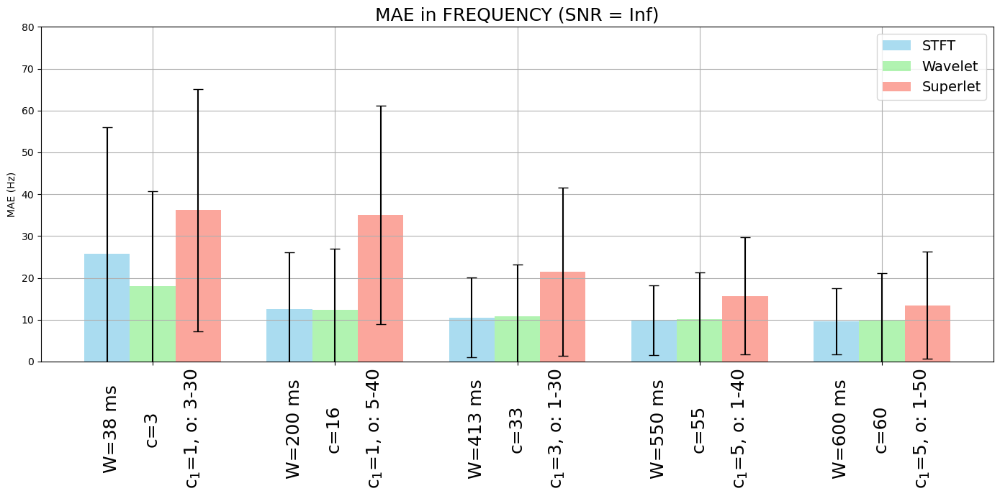

In [55]:
# params_wavelet = [3, 16, 33, 55, 60, 115]
# params_superlet = [
#     (3, 1, 30), (5, 1, 30), (1, 5, 40), (1, 10, 100), (1, 20, 100), (1, 30, 200)
# ]
# params_stft = [38, 200, 413, 550, 600, 824]  # Tamaños de ventana en ms
params_stft = windows_ms

# Número de condiciones
num_conditions = len(mae_wavelet_f)
x = np.arange(num_conditions)  # Posiciones para cada grupo de barras
bar_width = 0.25  # Ancho de las barras

# Crear el gráfico de barras
plt.figure(figsize=(14, 7))

# Graficar cada técnica con sus valores y barras de error
plt.bar(x - bar_width, mae_stft_f, width=bar_width, yerr=std_stft_f, capsize=5, label='STFT', color='skyblue', alpha=0.7)
plt.bar(x, mae_wavelet_f, width=bar_width, yerr=std_wavelet_f, capsize=5, label='Wavelet', color='lightgreen', alpha=0.7)
plt.bar(x + bar_width, mae_superlet_f, width=bar_width, yerr=std_superlet_f, capsize=5, label='Superlet', color='salmon', alpha=0.7)

# Configuración de etiquetas en el eje x con los parámetros específicos
labels = [
    f"W={p_stft} ms\n\nc={p_w}\n\nc$_1$={p_s[0]}, o: {p_s[1]}-{p_s[2]}"
    for p_w, p_s, p_stft in zip(params_wavelet, zip(*params_superlet), params_stft)
]

plt.xticks(x, labels, rotation=90, ha='center', fontsize=18)
#plt.xlabel('Condiciones y Parámetros')
plt.yticks(np.arange(0, 81, 10))

plt.ylabel('MAE (Hz)')
plt.title('MAE in FREQUENCY (SNR = ' + str(SNR) +')', fontsize=18)
plt.ylim(0,80)
plt.legend(fontsize=14)
plt.grid(True)

# Ajustar el layout para mejorar visualización de etiquetas
plt.tight_layout()

# Mostrar el gráfico
plt.show()

# MAE IN TIME

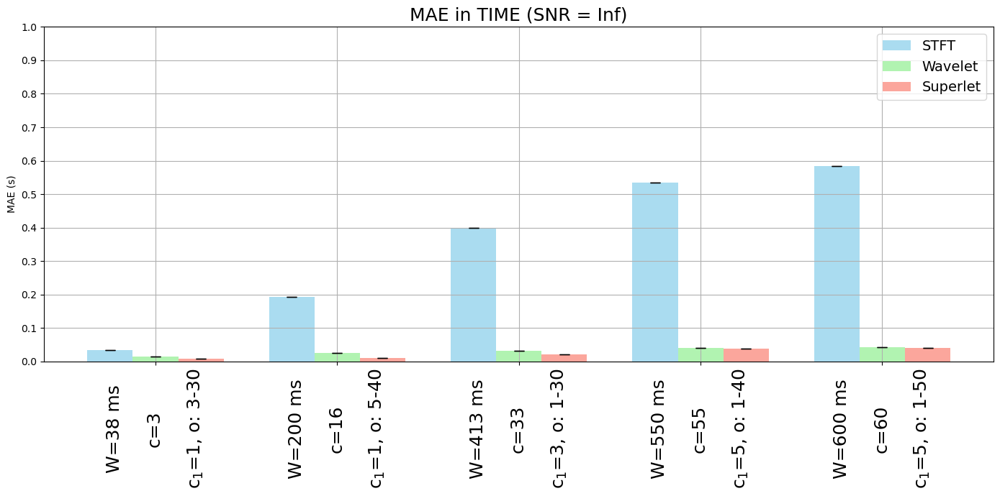

In [56]:
# params_wavelet = [3, 16, 33, 55, 60, 115]
# params_superlet = [
#     (3, 1, 30), (5, 1, 30), (1, 5, 40), (1, 10, 100), (1, 20, 100), (1, 30, 200)
# ]
# params_stft = [38, 200, 413, 550, 600, 824]  # Tamaños de ventana en ms
params_stft = windows_ms

# Número de condiciones
num_conditions = len(mae_wavelet_t)
x = np.arange(num_conditions)  # Posiciones para cada grupo de barras
bar_width = 0.25  # Ancho de las barras

# Crear el gráfico de barras
plt.figure(figsize=(14, 7))

# Graficar cada técnica con sus valores y barras de error
plt.bar(x - bar_width, mae_stft_t, width=bar_width, yerr=std_stft_t, capsize=5, label='STFT', color='skyblue', alpha=0.7)
plt.bar(x, mae_wavelet_t, width=bar_width, yerr=std_wavelet_t, capsize=5, label='Wavelet', color='lightgreen', alpha=0.7)
plt.bar(x + bar_width, mae_superlet_t, width=bar_width, yerr=std_superlet_t, capsize=5, label='Superlet', color='salmon', alpha=0.7)

# Configuración de etiquetas en el eje x con los parámetros específicos
labels = [
    f"W={p_stft} ms\n\nc={p_w}\n\nc$_1$={p_s[0]}, o: {p_s[1]}-{p_s[2]}"
    for p_w, p_s, p_stft in zip(params_wavelet, zip(*params_superlet), params_stft)
]

plt.xticks(x, labels, rotation=90, ha='center', fontsize=18)
#plt.xlabel('Condiciones y Parámetros')
plt.yticks(np.arange(0, 1.1, 0.1))

plt.ylabel('MAE (s)')
plt.title('MAE in TIME (SNR = ' + str(SNR) +')', fontsize=18)
plt.ylim(0,1)
plt.legend(fontsize=14)
plt.grid(True)

# Ajustar el layout para mejorar visualización de etiquetas
plt.tight_layout()

# Mostrar el gráfico
plt.show()

# COMPUTE RESOLUTION

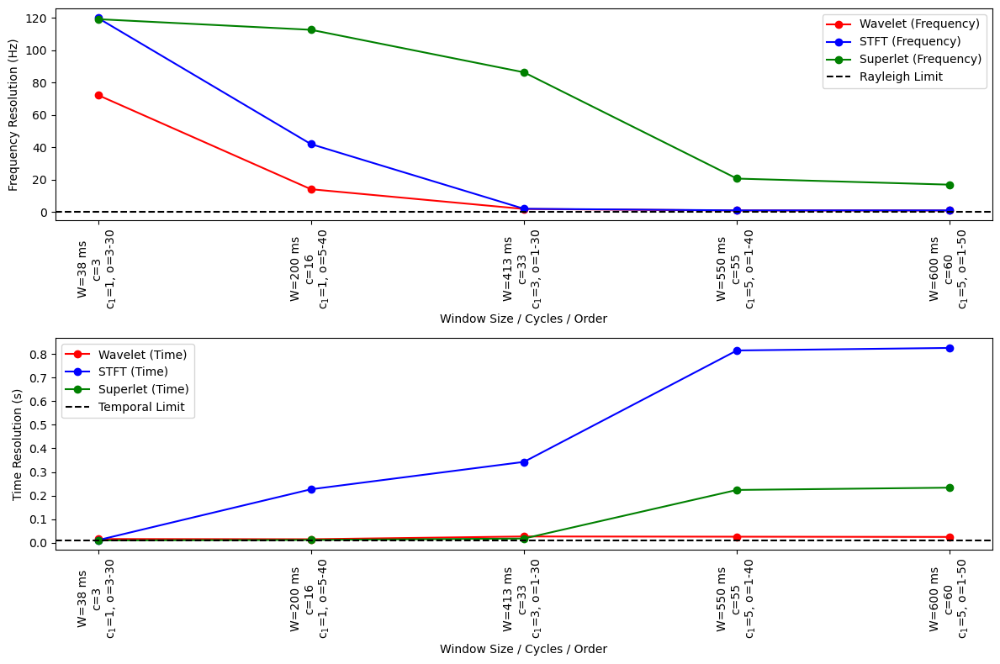

In [57]:
rayleigh_limit = 1 / (4 * np.pi)

# Etiquetas para los grupos de parámetros con salto de línea adicional
labels = [
    f"W={p_stft} ms\nc={p_wavelet}\nc$_1$={p_superlet[0]}, o={p_superlet[1]}-{p_superlet[2]}"
    for p_wavelet, p_superlet, p_stft in zip(params_wavelet, zip(*params_superlet), params_stft)
]

x = np.arange(1,len(params_wavelet)+1)

plt.figure(figsize=(12, 8))

# Primer gráfico (Frecuencia)
plt.subplot(2, 1, 1)
plt.plot(x, [r[1] for r in res_wavelet], 'ro-', label="Wavelet (Frequency)")
plt.plot(x, [r[1] for r in res_stft], 'bo-', label="STFT (Frequency)")
plt.plot(x, [r[1] for r in res_superlet], 'go-', label="Superlet (Frequency)")
plt.axhline(rayleigh_limit, color='k', linestyle='--', label="Rayleigh Limit")
plt.xlabel("Window Size / Cycles / Order")
plt.ylabel("Frequency Resolution (Hz)")
plt.legend()

# Segundo gráfico (Tiempo)
plt.subplot(2, 1, 2)
plt.plot(x, [r[0] for r in res_wavelet], 'ro-', label="Wavelet (Time)")
plt.plot(x, [r[0] for r in res_stft], 'bo-', label="STFT (Time)")
plt.plot(x, [r[0] for r in res_superlet], 'go-', label="Superlet (Time)")
plt.axhline(1 / MNF_1[0], color='k', linestyle='--', label="Temporal Limit")
plt.xlabel("Window Size / Cycles / Order")
plt.ylabel("Time Resolution (s)")
plt.legend()

# Ajuste de los xticks para ambos subgráficos
for ax in plt.gcf().get_axes():
    ax.set_xticks(x)  # Establecer los valores de los ticks
    ax.set_xticklabels(labels, rotation=90, ha='center', fontsize=10)  # Establecer las etiquetas con el formato deseado

# Ajustar el diseño
plt.tight_layout()
plt.show()

# Only first time!!!!

In [58]:
MAES_f = {
    'stft': [],
    'wavelet': [],
    'superlet': [],
    'std_stft': [],
    'std_wavelet': [],
    'std_superlet': []
}

In [59]:
MAES_f['wavelet'].append(mae_wavelet_f)
MAES_f['stft'].append(mae_stft_f)
MAES_f['superlet'].append(mae_superlet_f)
MAES_f['std_wavelet'].append(std_wavelet_f)
MAES_f['std_stft'].append(std_stft_f)
MAES_f['std_superlet'].append(std_superlet_f)

In [60]:
MAES_f

{'stft': [[25.686807509114125,
   12.469091937665304,
   10.504844351134729,
   9.830441919679494,
   9.591200972212985]],
 'wavelet': [[17.98834143654191,
   12.294081253115408,
   10.789174868636747,
   10.107083429131656,
   10.040272115074695]],
 'superlet': [[36.17019356405298,
   35.077817523641066,
   21.469213631336924,
   15.666614972193917,
   13.456367223831096]],
 'std_stft': [[30.36950615911098,
   13.607029949115667,
   9.51214603631189,
   8.300511957948252,
   7.949538243587159]],
 'std_wavelet': [[22.648514, 14.70026, 12.330635, 11.212206, 11.081735]],
 'std_superlet': [[28.993743521934565,
   26.115360968882545,
   20.0813518955891,
   13.979430316021311,
   12.860041509849026]]}

In [61]:
MAES_t = {
    'stft': [],
    'wavelet': [],
    'superlet': [],
    'std_stft': [],
    'std_wavelet': [],
    'std_superlet': []
}

In [62]:
MAES_t['wavelet'].append(mae_wavelet_t)
MAES_t['stft'].append(mae_stft_t)
MAES_t['superlet'].append(mae_superlet_t)
MAES_t['std_wavelet'].append(std_wavelet_t)
MAES_t['std_stft'].append(std_stft_t)
MAES_t['std_superlet'].append(std_superlet_t)

In [63]:
MAES_t

{'stft': [[0.0341796875,
   0.1923828125,
   0.400390625,
   0.5341796875,
   0.5830078125]],
 'wavelet': [[0.014978834255942708,
   0.02572451970042322,
   0.03158580267014033,
   0.041354607619667805,
   0.04330836860957343]],
 'superlet': [[0.00814067079127323,
   0.010094431781178859,
   0.021816997720612186,
   0.038423966134809584,
   0.041354607619667805]],
 'std_stft': [[0.0, 0.0, 0.0, 0.0, 0.0]],
 'std_wavelet': [[0.0, 0.0, 0.0, 0.0, 0.0]],
 'std_superlet': [[0.0, 0.0, 0.0, 0.0, 0.0]]}

### WE REPEAT EVERYTHING WITH DIFFERENT SNR

## We reset the signal

# Baseline parameters

In [64]:
noise = np.random.normal(0, 0.01, len(t))  # Gaussian noise
#noise = np.zeros(len(t))
baseline_1 = noise.copy()

In [65]:
baseline_1[int(burst_start_1*fs):int(burst_start_1*fs + len(burst_1))] += burst_1

Reference mean frequency: 110.97685447552273 Hz


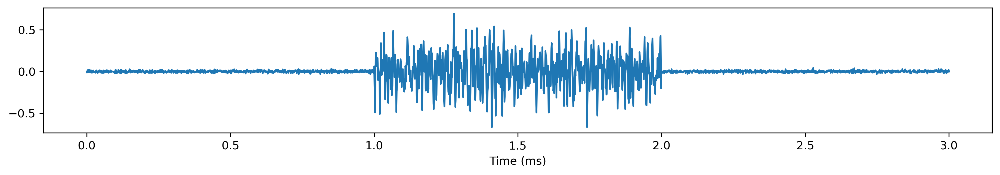

In [66]:
signal = baseline_1
fig, ax = plt.subplots(figsize=(15, 2), dpi=300)
ax.set_xlabel("Time (ms)")
ax.plot(jnp.linspace(0, len(signal)/fs, len(signal)), signal)
print(f"Reference mean frequency: {MNF_1[0]} Hz")

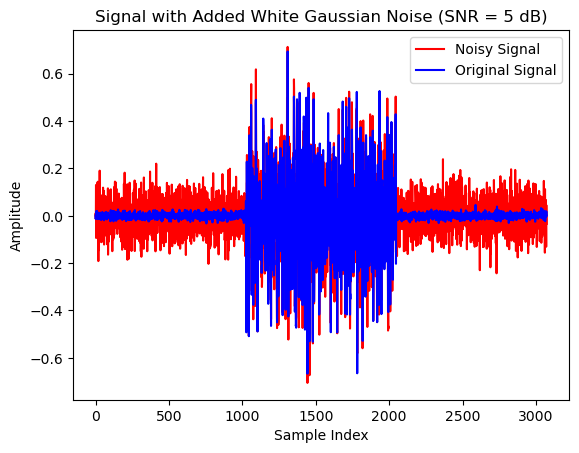

In [67]:
SNR = 5
#signal_noise = add_noise(baseline_1, SNR, plot = True)
signal_noise = add_noise(signal, SNR, plot = True)
#signal_noise = add_wgn_to_sig(baseline_1, noise, SNR)
signal = signal_noise

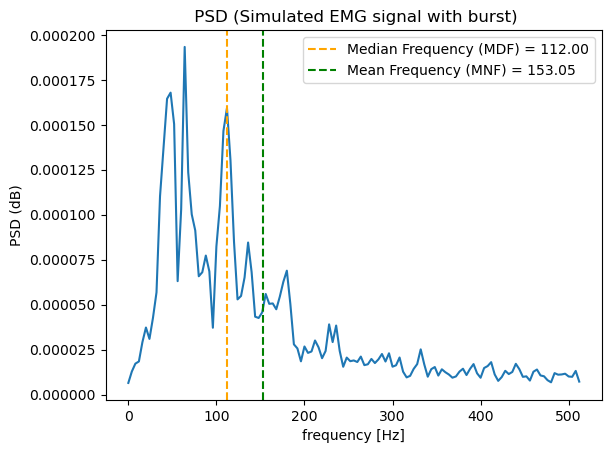

In [68]:
psd_welch, f_welch, MNF = superlet.compute_psd_welch(signal, fs, plot=True, muscle='Simulated EMG signal with burst')

Reference mean frequency: [110.97685447552273] Hz


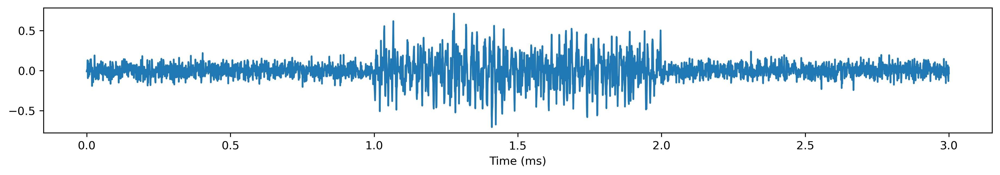

In [69]:
fig, ax = plt.subplots(figsize=(15, 2), dpi=300)
ax.set_xlabel("Time (ms)")
ax.plot(jnp.linspace(0, len(signal)/fs, len(signal)), signal)
print(f"Reference mean frequency: {MNF_1} Hz")

## WAVELET PARAMETERS = 3, 16, 33, 55, 60, 115 cycles

In [70]:
importlib.reload(superlet)

<module 'superlets_package.superlets' from '/Users/neuralrehabilitationgroup/PycharmProjects/Superlets-Marina/superlets_package/superlets.py'>

In [71]:
plot_1 = False
plot_2 = False

133.63475
Onset = 0.9632041680234451, offset = 2.0524259198957995
1.0892217518723544
1
131.806
Onset = 0.9465971996092478, offset = 2.068056007815044
1.1214588082057961
1
131.58115
Onset = 0.9417127971344839, offset = 2.072940410289808
1.131227613155324
1
131.79141
Onset = 0.9397590361445783, offset = 2.0748941712797135
1.135135135135135
1
131.858
Onset = 0.9397590361445783, offset = 2.0748941712797135
1.135135135135135
1


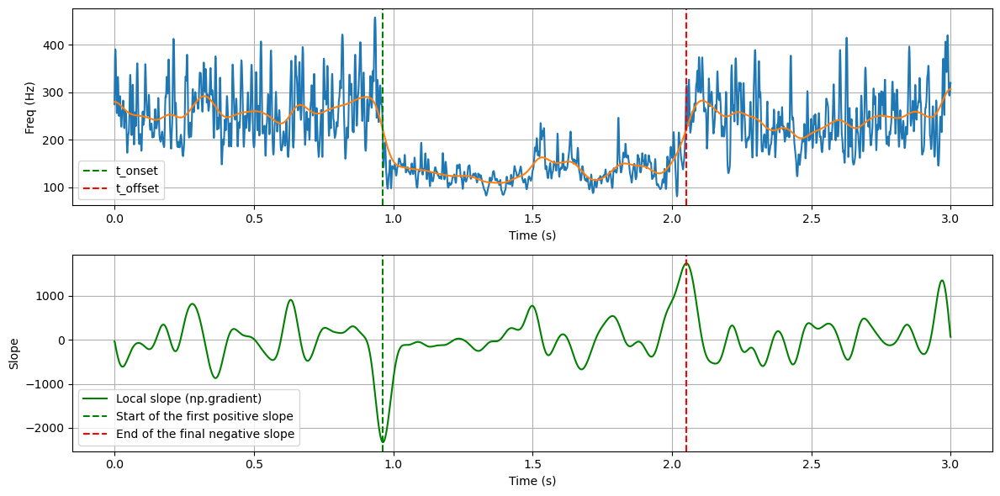

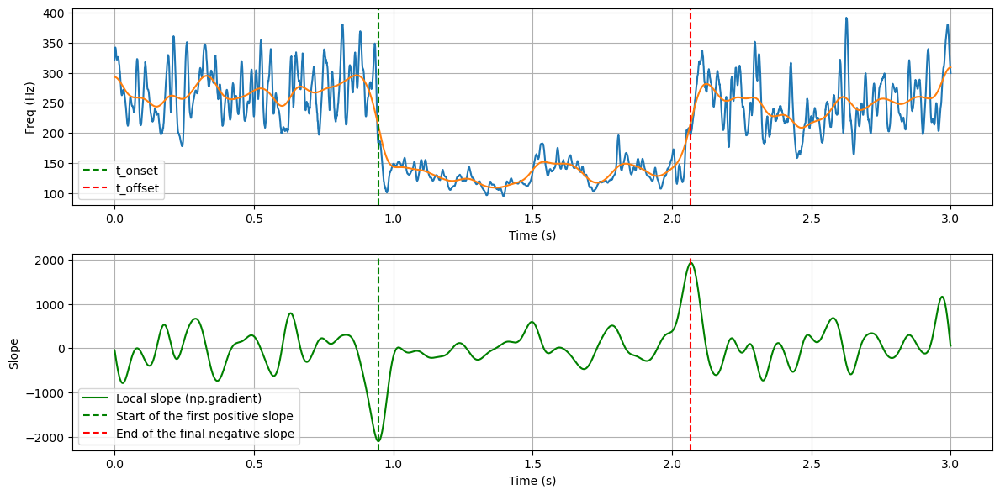

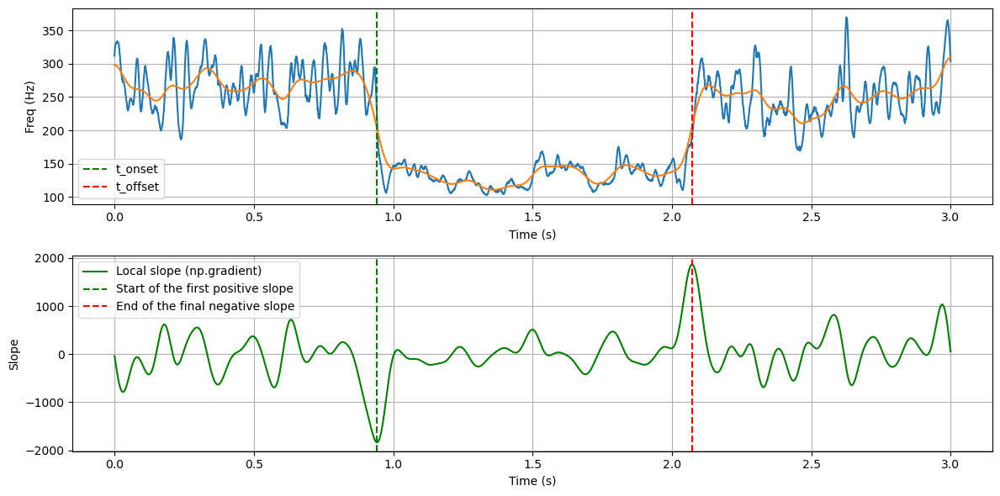

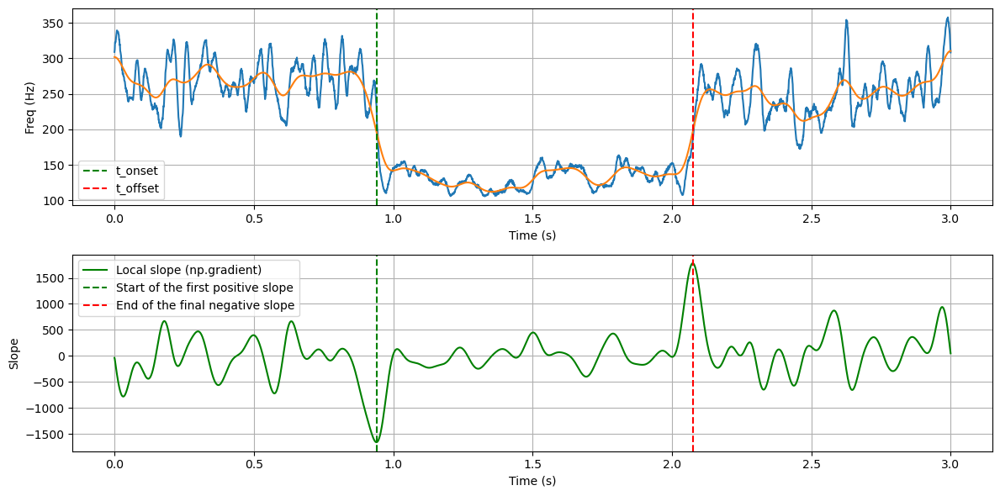

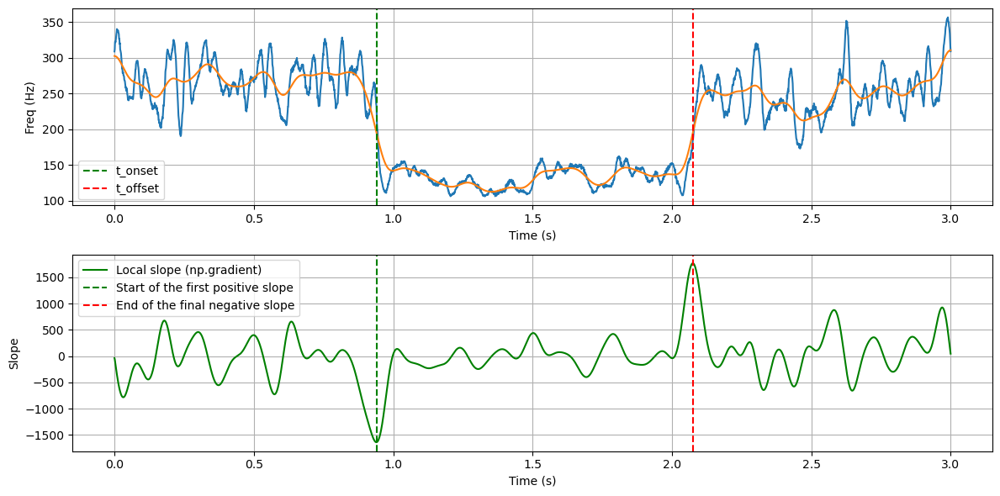

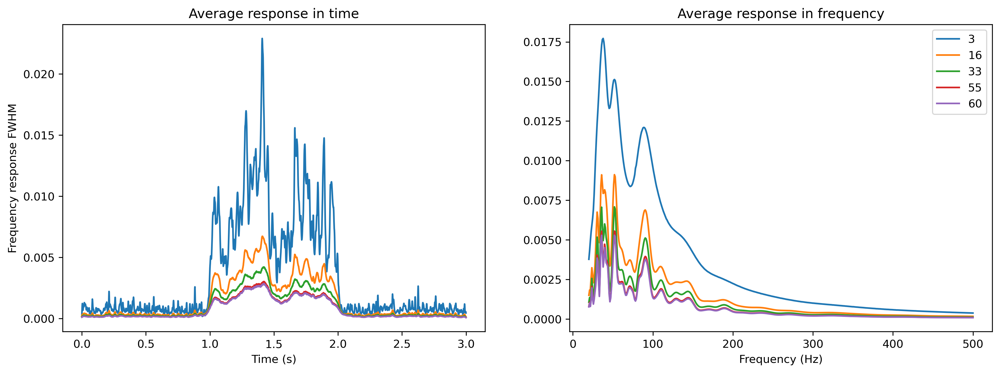

In [74]:
if plot_1:
    fig, ax = plt.subplots(ncols=len(params_wavelet), figsize=(18, 5), dpi=300)
if plot_2:
    fig_2, ax_2 = plt.subplots(ncols=len(params_wavelet), figsize=(18, 5), dpi=300)
    fig_3, ax_3 = plt.subplots(figsize=(10, 6))

mae_wavelet_f = []
std_wavelet_f = []

mae_wavelet_t = []
std_wavelet_t = []

total_time = []
total_freq = []

total_scalogram_wavelet = []
res_wavelet = []

# Iterar sobre los parámetros de wavelet
for i, c in enumerate(params_wavelet):
    wavelet = f"cmor{c}-1.0"

    cwtmatr, f, physical_freqs = morlet.wavelet_transform_2(signal,wavelet,freqs,fs)
    cwtmatr = np.abs(cwtmatr[:, :])
    
    if save:
        df = pd.DataFrame(cwtmatr)
    
        # Guardar en un archivo CSV
        filename = os.path.join(new_folder_path, str(SNR) + "dB_wv_" + str(c) + ".csv")
        df.to_csv(filename, index=False, header=False)  # Sin índices ni encabezados
    
    scalogram_2 = jnp.abs(cwtmatr)**2

    if plot_1:
        pcm = ax[i].pcolormesh(t,f, scalogram_2, shading='gouraud', cmap='jet')
        
        ax[i].set_title(f'c={c}')
        ax[i].set_ylabel('Frecuencia [Hz]')
        ax[i].set_xlabel('Tiempo [s]')
        
        cbar = fig.colorbar(pcm, ax=ax[i], orientation='horizontal')
        cbar.set_label('Power', rotation=0, labelpad=15)  # Etiqueta de la colorbar
    
        ax[i].set_ylim(freqs[0], freqs[-1])  # Ajustar el rango de frecuencias si es necesario
        plt.tight_layout()

    total_scalogram_wavelet.append(scalogram_2)
    instant_mean_freq_total = []

    instant_freq = np.sum(scalogram_2 * f[:, np.newaxis], axis=0) / np.sum(scalogram_2, axis=0)

    # OBTAIN THE POINTS IN TIME WHERE BURST IS DETECTED
    slope_threshold = 1500
    
    from scipy.ndimage import gaussian_filter1d
    # 1. Compute the derivative to see the slope
    sigma = 30  # Desviación estándar del filtro
    y_smooth = gaussian_filter1d(instant_freq, sigma)

    # Calcular pendientes locales usando np.gradient sobre la señal suavizada
    slope_gradient = np.gradient(y_smooth, t)
    
    time_range = len(slope_gradient)//2
    time_shift = round(burst_duration_1 * 0.7 * fs)
    inicio = time_range-time_shift
    
    first_index = np.argmin(slope_gradient[inicio:time_range]) + inicio
    last_index = np.argmax(slope_gradient[time_range:time_range+time_shift]) + time_range  # Índice del mínimo más significativo
    
    # # Start of the first positive slope
    # first_positive_index = np.where(slope_gradient < -slope_threshold)[0][0]
    # 
    # # End of the final negative slope
    # last_negative_index = np.where(slope_gradient > slope_threshold)[0][-1]
    
    t_onset = t[first_index]
    t_offset = t[last_index]
    
    # Visualization
    plt.figure(figsize=(12, 6))

    plt.subplot(2, 1, 1)
    plt.plot(t, instant_freq)
    plt.plot(t,y_smooth)
    plt.axvline(t_onset, color='green', linestyle='--', label='t_onset')
    plt.axvline(t_offset, color='red', linestyle='--', label='t_offset')
    plt.xlabel('Time (s)')
    plt.ylabel('Freq (Hz)')
    plt.legend()
    plt.grid()
    
    # Slopes and t_onset and t_offset
    plt.subplot(2, 1, 2)
    plt.plot(t, slope_gradient, 'g-', label='Local slope (np.gradient)')
    plt.axvline(t_onset, color='green', linestyle='--', label='Start of the first positive slope')
    plt.axvline(t_offset, color='red', linestyle='--', label='End of the final negative slope')
    plt.xlabel('Time (s)')
    plt.ylabel('Slope')
    plt.legend()
    plt.grid()

    plt.tight_layout()

    start_idx = np.searchsorted(t, burst_start_1)  # Encuentra el índice de inicio
    end_idx = np.searchsorted(t, burst_start_1 + burst_duration_1)  # Encuentra el índice final
#
    instant_mean_freq_burst = instant_freq[start_idx:end_idx]

    if plot_2:
        ax_2[i].plot(t, y_smooth)

        ax_2[i].set_xlabel("Time (s)")
        ax_2[i].set_ylabel("Frequency (Hz)")
        #ax_2[i].set_xlim(t[0], t[-1])
        #plt.title("Medias de cada fila en función del tiempo")
        ax_2[i].grid(True)

        ax_3.plot(t, instant_freq, label=f"Mean frequency (Cycles: {c})")
        plt.tight_layout()

    #MAE in frequency
    print(np.mean(instant_mean_freq_burst))
    mae_f, std_f = calculate_mae(instant_mean_freq_burst, MNF_1)
    mae_wavelet_f.append(mae_f)
    std_wavelet_f.append(std_f)
    
    #MAE in time
    print(f'Onset = {t_onset}, offset = {t_offset}')
    estimates_combined = t_offset - t_onset
    print(estimates_combined)
    true_values_combined = t_offset_1 - t_onset_1
    print(true_values_combined)

    mae_t, std_t = calculate_mae(estimates_combined, true_values_combined)
    mae_wavelet_t.append(mae_t)
    std_wavelet_t.append(std_t)

    time = np.arange(scalogram_2.shape[1]) / fs

    total_time.append(time)
    total_freq.append(freqs)

# Configuración del gráfico
if plot_2:
    ax_3.set_xlabel("Time (s)")
    ax_3.set_ylabel("Frequency (Hz)")
    ax_3.legend()
    ax_3.grid(True)
    ax_3.set_title("Comparación de frecuencias medias instantáneas")

res_wavelet = superlet.compute_avg_response_resolution(total_scalogram_wavelet, total_time, total_freq, params_wavelet)

In [76]:
mae_wavelet_f

[25.910322538220566,
 22.09149085674322,
 21.295996700285354,
 21.145826036187472,
 21.181367678349442]

In [77]:
mae_wavelet_t

[0.08922175187235437,
 0.12145880820579613,
 0.13122761315532405,
 0.1351351351351351,
 0.1351351351351351]

## PARÁMETROS SUPERLET: base_cycle, min_order, max_order = [3, 5, 1, 1, 1, 1], [1, 1, 5, 10, 20, 30], [30, 30, 40, 100, 100, 200]

In [78]:
importlib.reload(superlet)

<module 'superlets_package.superlets' from '/Users/neuralrehabilitationgroup/PycharmProjects/Superlets-Marina/superlets_package/superlets.py'>

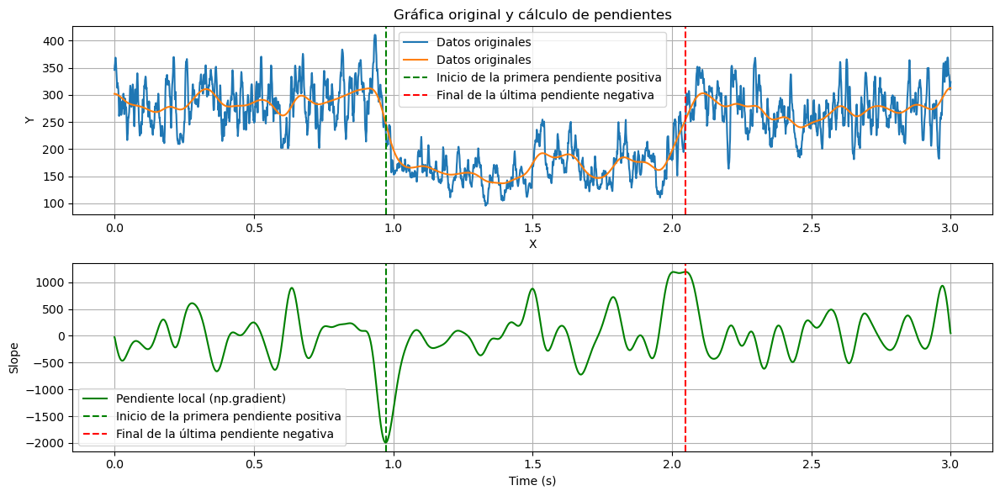

163.7528816572526
Onset = 0.972972972972973, offset = 2.048518397915988
1.0755454249430152
1


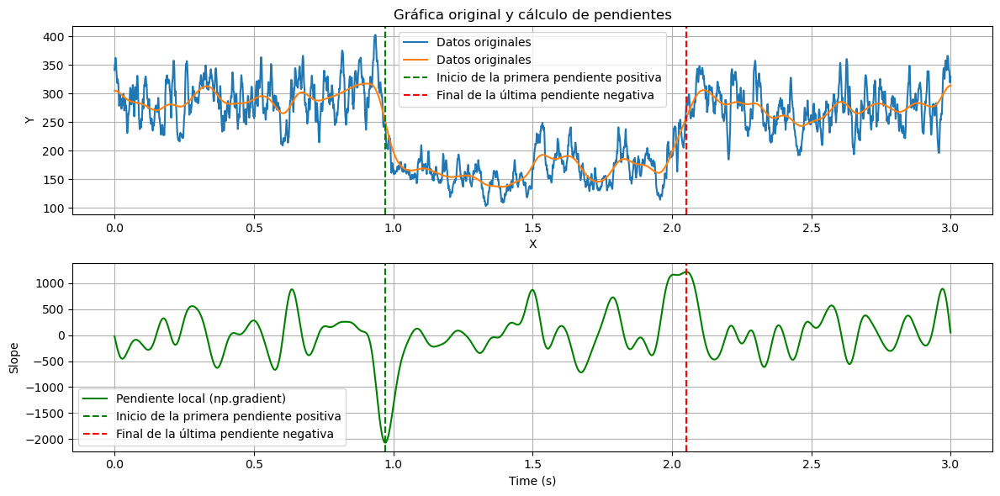

163.9512172714616
Onset = 0.9710192119830674, offset = 2.0524259198957995
1.081406707912732
1


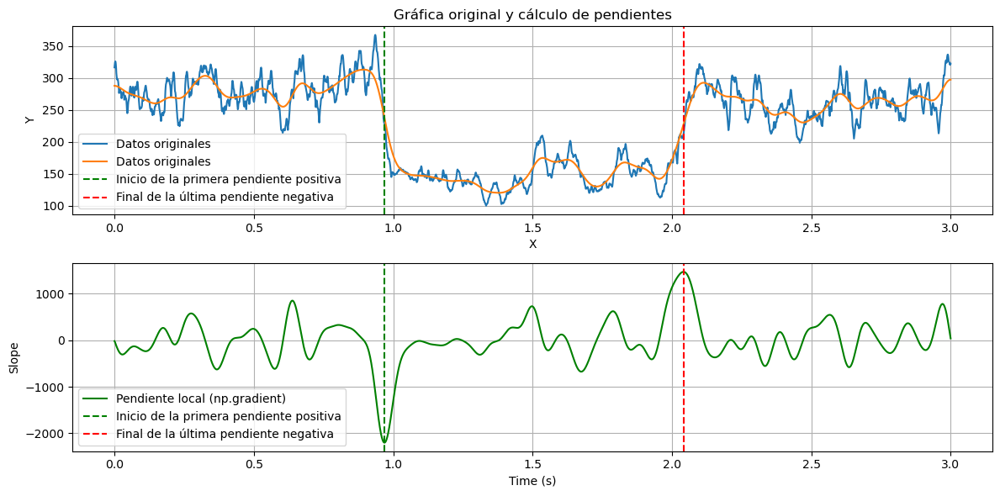

146.89460644050666
Onset = 0.9690654509931619, offset = 2.0416802344513187
1.0726147834581568
1


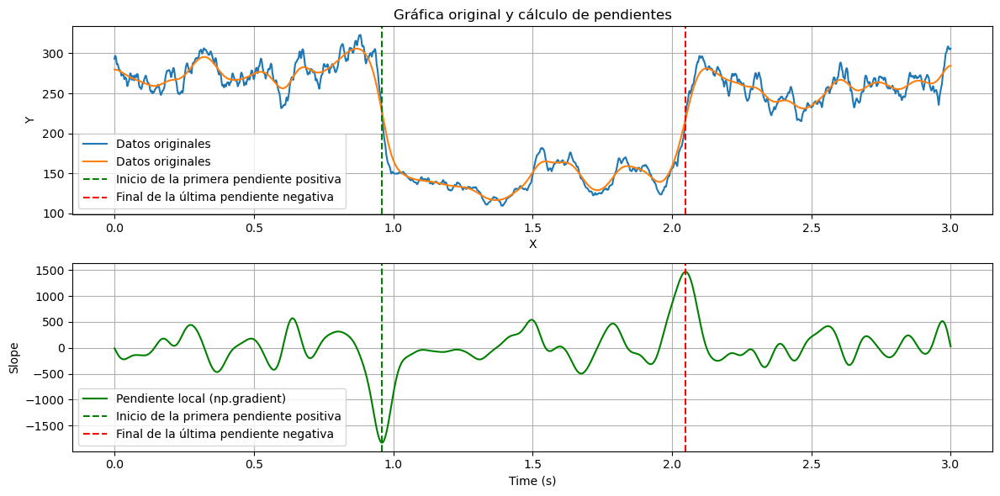

141.73047005778724
Onset = 0.9602735265385868, offset = 2.048518397915988
1.0882448713774013
1


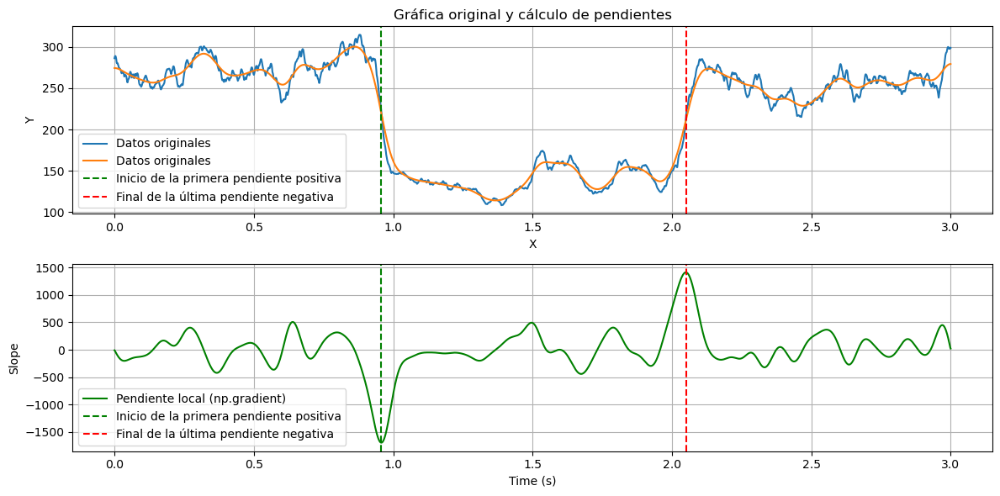

138.58599585331828
Onset = 0.9573428850537284, offset = 2.050472158905894
1.0931292738521654
1


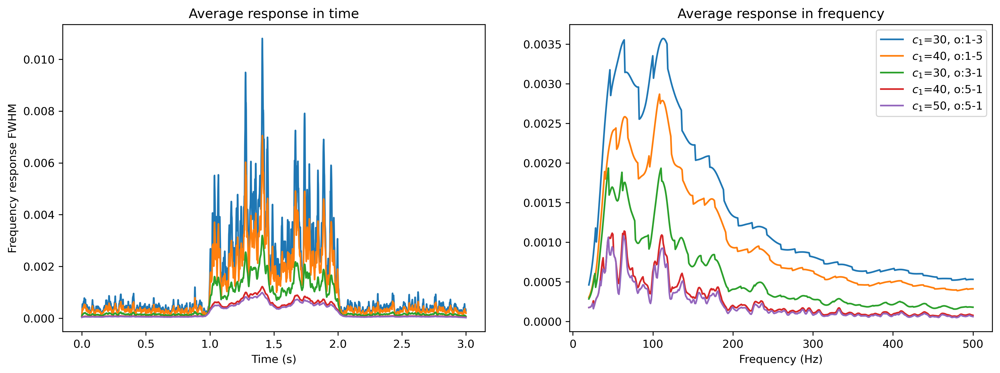

In [80]:
if plot_1:
    fig, ax = plt.subplots(ncols=len(params_superlet[0]), figsize=(15, 5), dpi=300)

if plot_2:
    fig_2, ax_2 = plt.subplots(ncols=len(params_superlet[0]), figsize=(15, 5), dpi=300)
    fig_3, ax_3 = plt.subplots(figsize=(10, 6))

mae_superlet_f = []
std_superlet_f = []

mae_superlet_t = []
std_superlet_t = []

total_time = []
total_freq = []

total_scalogram_superlet = []

for (i, (base_cycle, min_order, max_order)) in enumerate(zip(*params_superlet)):

    wv, scalogram = superlet.adaptive_superlet_transform(signal, freqs, sampling_freq=fs,
                                                         base_cycle=base_cycle, min_order=min_order,
                                                         max_order=max_order, mode="mul")
    
    if plot_1:
        im = ax[i].imshow(jnp.abs(scalogram) ** 2, aspect='auto', cmap="jet", interpolation="none", origin="lower",extent=[0, len(signal) / fs, freqs[0], freqs[-1]])
        ax[i].set_title(f"$c_1$: {base_cycle}, o: {min_order}-{max_order}")
        ax[i].set_xlabel("Time (s)")
        ax[i].set_ylabel("Frequency (Hz)")

        cbar = fig.colorbar(im, ax=ax[i], orientation='horizontal')
        cbar.set_label('Power [a.u]', rotation=0, labelpad=15)  # Etiqueta de la colorbar
        plt.tight_layout()

    scalogram_2 = np.abs(scalogram) ** 2
    
    if save:
        df = pd.DataFrame(scalogram_2)
    
        # Guardar en un archivo CSV
        filename = os.path.join(new_folder_path,str(SNR) + "dB_superlet_" + str(base_cycle) + "-" + str(min_order) + "-" + str(max_order) + ".csv")
        df.to_csv(filename, index=False, header=False)  # Sin índices ni encabezados

    instant_mean_freq_total = []
    total_scalogram_superlet.append(scalogram_2)
    
    instant_freq = np.sum(scalogram_2 * freqs[:, np.newaxis], axis=0) / np.sum(scalogram_2, axis=0)
    
    slope_threshold = 800
    # 1. Compute the derivative to see the slope

    sigma = 30
    y_smooth = gaussian_filter1d(instant_freq, sigma)
    
    # 2. Calcular la pendiente general ajustando una línea recta (np.polyfit)
    slope_gradient = np.gradient(y_smooth, t)  # Grado 1 para línea recta

    time_range = len(slope_gradient)//2
    time_shift = round(burst_duration_1 * 0.7 * fs)
    inicio = time_range-time_shift
    
    first_index = np.argmin(slope_gradient[inicio:time_range]) + inicio
    last_index = np.argmax(slope_gradient[time_range:time_range+time_shift]) + time_range  # Índice del mínimo más significativo
    
    # # Encontrar el inicio de la primera pendiente positiva
    # first_positive_index = np.where(slope_gradient > slope_threshold)[0][0]
    # 
    # # Encontrar el final de la última pendiente negativa
    # last_negative_index = np.where(slope_gradient < -slope_threshold)[0][-1]
    # 
    t_onset = t[first_index]
    t_offset = t[last_index]
    
    # Visualización
    plt.figure(figsize=(12, 6))
    
    # Gráfica original
    plt.subplot(2, 1, 1)
    plt.plot(t, instant_freq, label='Datos originales')
    plt.plot(t, y_smooth, label='Datos originales')
    plt.axvline(t_onset, color='green', linestyle='--', label='Inicio de la primera pendiente positiva')
    plt.axvline(t_offset, color='red', linestyle='--', label='Final de la última pendiente negativa')
    plt.title('Gráfica original y cálculo de pendientes')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.legend()
    plt.grid()
    
    # Gráfica de pendientes
    # Gráfica de pendientes
    plt.subplot(2, 1, 2)
    plt.plot(t, slope_gradient, 'g-', label='Pendiente local (np.gradient)')
    plt.axvline(t_onset, color='green', linestyle='--', label='Inicio de la primera pendiente positiva')
    plt.axvline(t_offset, color='red', linestyle='--', label='Final de la última pendiente negativa')
    plt.xlabel('Time (s)')
    plt.ylabel('Slope')
    plt.legend()
    plt.grid()

    plt.tight_layout()
    plt.show()
      

    initial_imnf = instant_freq[:round(burst_start_1 * fs) - offset]
    instant_mean_freq_total.extend(initial_imnf)
    # plt.figure()
    # plt.plot(initial_imnf)

    instant_mean_freq_burst = instant_freq[
                              round(burst_start_1 * fs):round((burst_start_1 + burst_duration_1) * fs)]
    instant_mean_freq_burst = instant_mean_freq_burst[offset_burst:round(len(instant_mean_freq_burst)) - offset_burst]
    instant_mean_freq_total.extend(instant_mean_freq_burst)

    final_imnf = instant_freq[round((burst_start_1 + burst_duration_1) * fs) + offset:]
    instant_mean_freq_total.extend(final_imnf)
    # plt.figure()
    # plt.plot(final_imnf)
    # plt.figure()
    # plt.plot(instant_mean_freq_total)

    if plot_2:
        ax_2[i].plot(t, instant_mean_freq_total,
                     label="Mean frequency (each window of " + str(len(freqs)) + ' samples)')

        ax_2[i].set_xlabel("Time (s)")
        ax_2[i].set_ylabel("Frequency (Hz)")
        #ax_2[i].set_xlim(tiempo[0], tiempo[-1])
        #plt.title("Medias de cada fila en función del tiempo")
        ax_2[i].legend()
        ax_2[i].grid(True)

        ax_3.plot(t, instant_mean_freq_total, label=f"Mean frequency (Cycles: {base_cycle})")

     #MAE in frequency
    print(np.mean(instant_mean_freq_burst))
    mae_f, std_f = calculate_mae(instant_mean_freq_burst, MNF_1)
    mae_superlet_f.append(mae_f)
    std_superlet_f.append(std_f)
    
    #MAE in time
    print(f'Onset = {t_onset}, offset = {t_offset}')
    estimates_combined = t_offset - t_onset
    print(estimates_combined)
    true_values_combined = t_offset_1 - t_onset_1
    print(true_values_combined)

    mae_t, std_t = calculate_mae(estimates_combined, true_values_combined)
    mae_superlet_t.append(mae_t)
    std_superlet_t.append(std_t)

    time = np.arange(scalogram_2.shape[1]) / fs

    total_time.append(time)
    total_freq.append(freqs)

    total_time.append(t)
    total_freq.append(freqs)

if plot_2:
    ax_3.set_xlabel("Time (s)")
    ax_3.set_ylabel("Frequency (Hz)")
    ax_3.legend()
    ax_3.grid(True)
    ax_3.set_title("Comparación de frecuencias medias instantáneas")

res_superlet = superlet.compute_avg_response_resolution(total_scalogram_superlet, total_time, total_freq, [f'$c_1$={c3}, o:{c1}-{c2}' for c1, c2, c3 in zip(*params_superlet)])

In [81]:
mae_superlet_f

[53.11983904829374,
 53.08792295134845,
 36.3062018836885,
 30.77154449414752,
 27.666021025246362]

In [82]:
mae_superlet_t

[0.0755454249430152,
 0.08140670791273208,
 0.07261478345815675,
 0.08824487137740133,
 0.0931292738521654]

## STFT PARAMETERS (window = duration/cycles) = 38, 200, 413, 550, 600, 824 ms

In [83]:
importlib.reload(superlet)

<module 'superlets_package.superlets' from '/Users/neuralrehabilitationgroup/PycharmProjects/Superlets-Marina/superlets_package/superlets.py'>

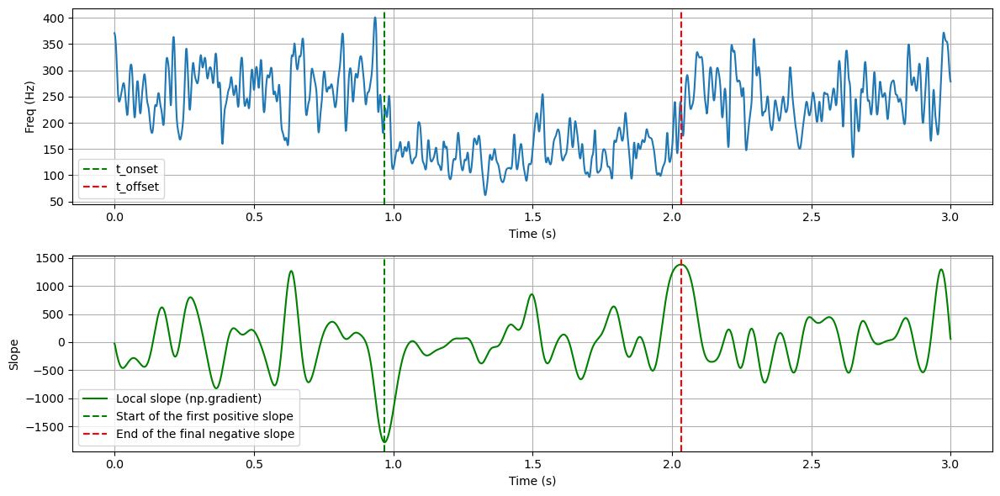

141.53232253700227
Onset = 0.96875, offset = 2.033203125
1.064453125
1


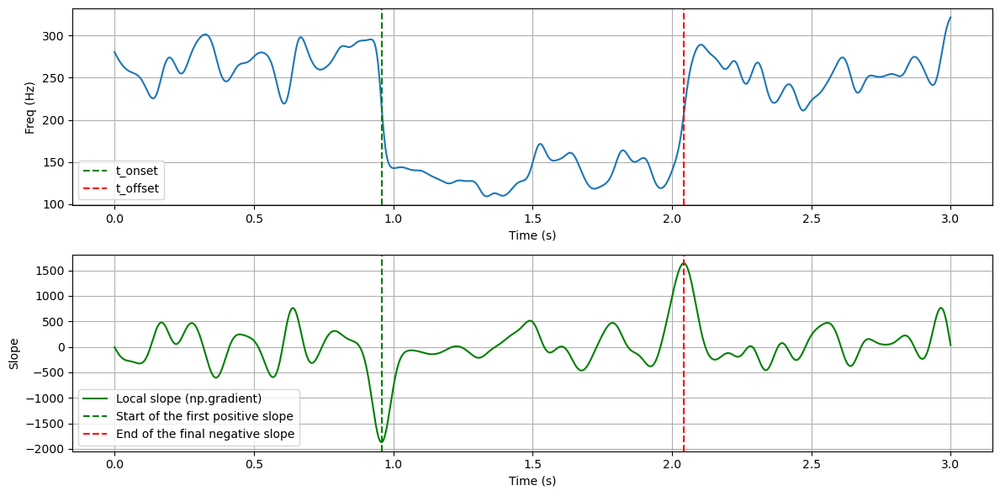

135.93240460686314
Onset = 0.9580078125, offset = 2.0419921875
1.083984375
1


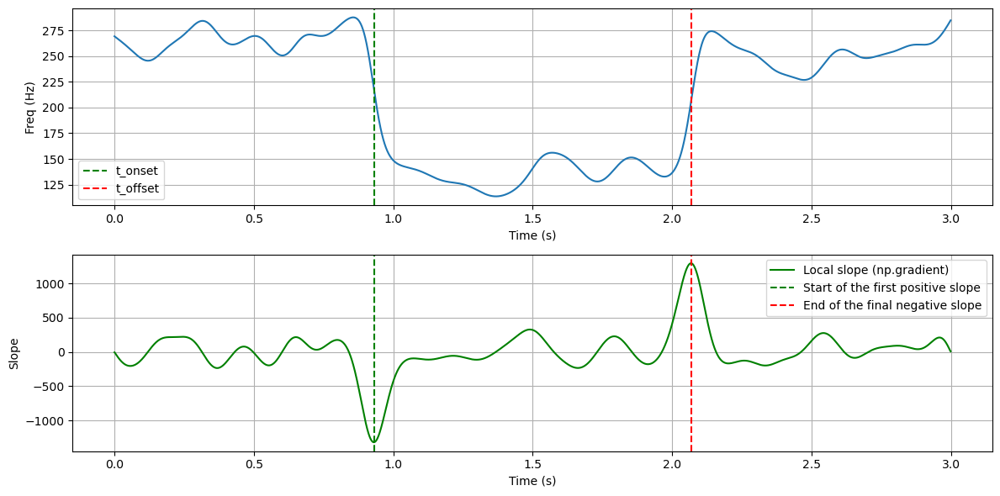

135.31707015397149
Onset = 0.9306640625, offset = 2.068359375
1.1376953125
1


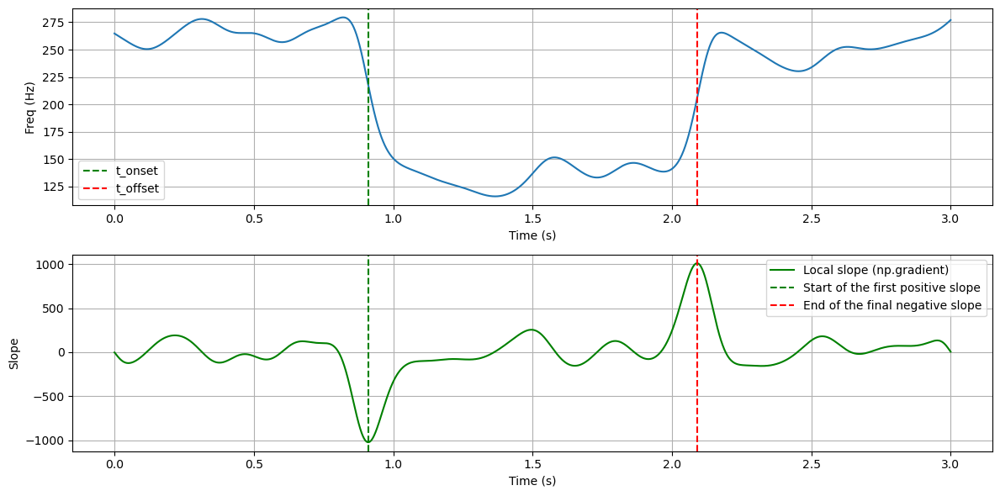

135.11687488160646
Onset = 0.91015625, offset = 2.08984375
1.1796875
1


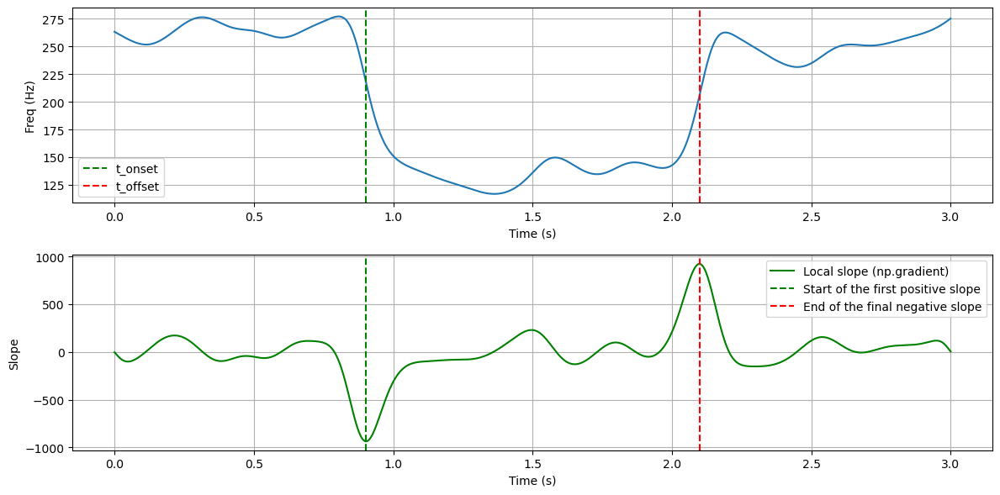

135.06401619920587
Onset = 0.90234375, offset = 2.0986328125
1.1962890625
1


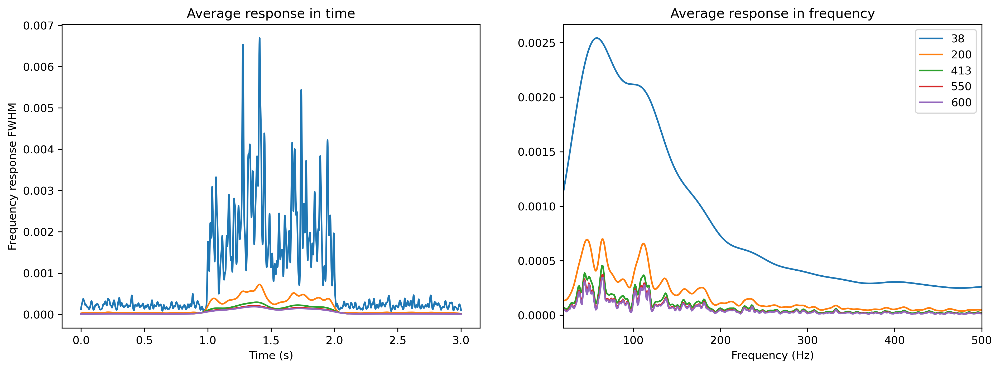

In [84]:
if plot_1:
    fig, ax = plt.subplots(ncols=len(windows_ms), figsize=(15, 5), dpi=300)

if plot_2:
    fig_2, ax_2 = plt.subplots(ncols=len(windows_ms), figsize=(15, 5), dpi=300)
    fig_3, ax_3 = plt.subplots(figsize=(10, 6))

mae_stft_f = []
std_stft_f = []

mae_stft_t = []
std_stft_t = []

total_time = []
total_freq = []

res_stft = []
total_scalogram_stft = []

for i, w in enumerate(windows_ms):
    # Calcular la ventana Blackman
    window = windows.blackman(w)
    
    # Hacer que la f de la stft tenga el mismo tamaño que las demás
    nfft = 2 * (len(freqs))
    # Dimensión de la frecuencia = nfft/2 + 1
    # Dimesión del tiempo = [(N - noverlap)/(nperseg-noverlap)] + 1 = 
    
    # Realizar la STFT con la ventana Blackman y superposición del 50%
    #f, t, Zxx = stft(signal, fs, window=window, nfft=nfft, nperseg=w, noverlap=w//2, padded=True, scaling='psd')
    f, t_stft, Zxx = stft(signal, fs=fs, window='blackman', nperseg=w, noverlap=w-1, nfft=nfft, detrend=False, return_onesided=True, boundary='zeros', padded=True, axis=-1, scaling='spectrum')
    
    # ax[i].pcolormesh(t, f, np.abs(Zxx), shading='gouraud', cmap='jet')
    
    # Calcular la representación de potencia (magnitud al cuadrado)
    Zxx_power = np.abs(Zxx) ** 2
    
    if plot_1:
        pcm = ax[i].pcolormesh(t_stft, f, Zxx_power, shading='gouraud', cmap='jet')
        
        ax[i].set_title(f'W={w * 1000 // fs} ms')
        ax[i].set_ylabel('Frecuencia [Hz]')
        ax[i].set_xlabel('Tiempo [s]')
        
        cbar = fig.colorbar(pcm, ax=ax[i], orientation='horizontal')
        cbar.set_label('Power', rotation=0, labelpad=15)  # Etiqueta de la colorbar
    
        #fig.colorbar(pcm, ax=ax[i], label='Potencia')
        ax[i].set_ylim(freqs[0], freqs[-1])  # Ajustar el rango de frecuencias si es necesario
        plt.tight_layout()
    
    scalogram_2 = Zxx_power
    
    if save:
        df = pd.DataFrame(scalogram_2)
    
        # Guardar en un archivo CSV
        filename = os.path.join(new_folder_path, str(SNR) + "dB_stft_" + str(w) + ".csv")
        df.to_csv(filename, index=False, header=False)  # Sin índices ni encabezados
        
    total_scalogram_stft.append(scalogram_2)
 
    instant_mean_freq_total = []  
    
    instant_freq = np.sum(scalogram_2 * f[:, np.newaxis], axis=0) / np.sum(scalogram_2, axis=0)
    
    # OBTAIN THE POINTS IN TIME WHERE BURST IS DETECTED
    slope_threshold = 450
    
    from scipy.ndimage import gaussian_filter1d
    # 1. Compute the derivative to see the slope
    y_smooth = gaussian_filter1d(instant_freq, sigma)

    # Calcular pendientes locales usando np.gradient sobre la señal suavizada
    slope_gradient = np.gradient(y_smooth, t_stft)
    #slope_gradient = np.gradient(instant_freq, t)
    
    first_index = np.argmin(slope_gradient[inicio:time_range]) + inicio
    last_index = np.argmax(slope_gradient[time_range:time_range+time_shift]) + time_range  # Índice del mínimo más significativo
    
    t_onset = t_stft[first_index]
    t_offset = t_stft[last_index]
    
    # Visualization
    plt.figure(figsize=(12, 6))

    plt.subplot(2, 1, 1)
    plt.plot(t_stft, instant_freq)
    plt.axvline(t_onset, color='green', linestyle='--', label='t_onset')
    plt.axvline(t_offset, color='red', linestyle='--', label='t_offset')
    plt.xlabel('Time (s)')
    plt.ylabel('Freq (Hz)')
    plt.legend()
    plt.grid()
    
    # Slopes and t_onset and t_offset
    plt.subplot(2, 1, 2)
    plt.plot(t_stft, slope_gradient, 'g-', label='Local slope (np.gradient)')
    plt.axvline(t_onset, color='green', linestyle='--', label='Start of the first positive slope')
    plt.axvline(t_offset, color='red', linestyle='--', label='End of the final negative slope')
    plt.xlabel('Time (s)')
    plt.ylabel('Slope')
    plt.legend()
    plt.grid()

    plt.tight_layout()
    plt.show()
    
    start_index = np.argmin(np.abs(t_stft - burst_start_1))
    end_index_burst = np.argmin(np.abs(t_stft - (burst_start_1 + burst_duration_1)))
    
    # Segmento inicial antes del burst
    initial_imnf = instant_freq[:max(0, start_index - offset)]  # Asegurar que no haya índices negativos
    instant_mean_freq_total.extend(initial_imnf)
    # plt.figure()
    # plt.plot(initial_imnf)
    
    # Segmento durante el burst
    instant_mean_freq_burst = instant_freq[start_index:end_index_burst]
    instant_mean_freq_burst = instant_mean_freq_burst[offset_burst:len(instant_mean_freq_burst)-offset_burst]  # Aplicar offset dentro del burst
    instant_mean_freq_total.extend(instant_mean_freq_burst)
    # plt.figure()
    # plt.plot(instant_mean_freq_burst)
    
    # Segmento final después del burst
    final_start_index = end_index_burst + offset
    final_imnf = instant_freq[final_start_index:]
    instant_mean_freq_total.extend(final_imnf)
  
    if plot_2:
        ax_2[i].plot(t_stft, instant_mean_freq_total, label="Mean frequency (each window of " + str(len(freqs)) + ' samples)')
        
        ax_2[i].set_xlabel("Time (s)")
        ax_2[i].set_ylabel("Frequency (Hz)")
        #ax_2[i].set_xlim(tiempo[0], tiempo[-1])
        #plt.title("Medias de cada fila en función del tiempo")
        ax_2[i].legend()
        ax_2[i].grid(True)
        
        ax_3.plot(t_stft, instant_mean_freq_total, label=f"Mean frequency (Cycles: {w})")
    
    #MAE in frequency
    print(np.mean(instant_mean_freq_burst))
    mae_f, std_f = calculate_mae(instant_mean_freq_burst, MNF_1)
    mae_stft_f.append(mae_f)
    std_stft_f.append(std_f)
    
    #MAE in time
    print(f'Onset = {t_onset}, offset = {t_offset}')
    estimates_combined = t_offset - t_onset
    print(estimates_combined)
    true_values_combined = t_offset_1 - t_onset_1
    print(true_values_combined)

    mae_t, std_t = calculate_mae(estimates_combined, true_values_combined)
    mae_stft_t.append(mae_t)
    std_stft_t.append(std_t)
    
    total_time.append(np.linspace(t_stft[0], t_stft[-1], scalogram_2.shape[1]))
    total_freq.append(np.linspace(f[0], f[-1], scalogram_2.shape[0]))

# Configuración del gráfico
if plot_2:
    ax_3.set_xlabel("Time (s)")
    ax_3.set_ylabel("Frequency (Hz)")
    ax_3.legend()
    ax_3.grid(True)
    ax_3.set_title("Comparación de frecuencias medias instantáneas")
        
res_stft = superlet.compute_avg_response_resolution(total_scalogram_stft, total_time, total_freq, windows_ms, stft=[freqs[0],freqs[-1]])

In [85]:
mae_stft_f

[34.6011259691719,
 25.038373345898098,
 24.340215678448736,
 24.140020406083725,
 24.087161723683153]

In [86]:
mae_stft_t

[0.064453125, 0.083984375, 0.1376953125, 0.1796875, 0.1962890625]

### Plot comparison of the same SNR

# MAE IN FREQUENCY

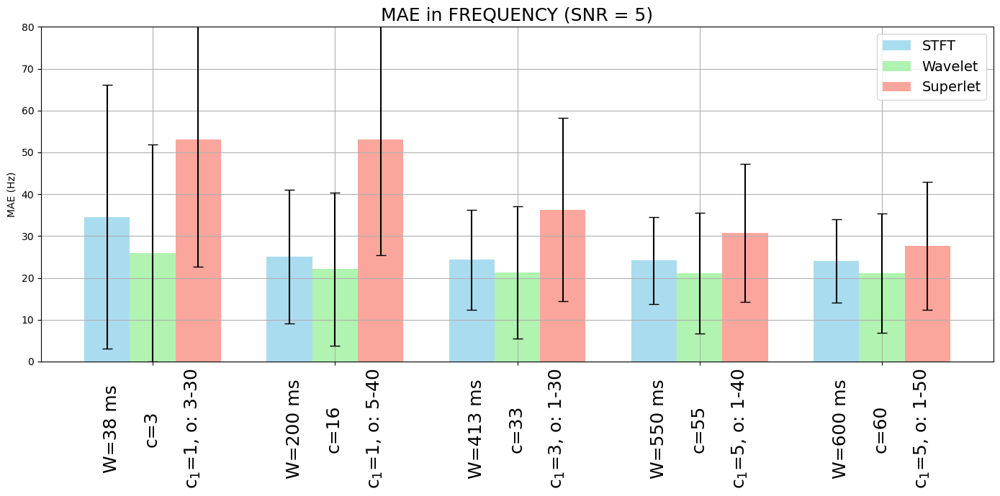

In [87]:
params_stft = windows_ms

# Número de condiciones
num_conditions = len(mae_wavelet_f)
x = np.arange(num_conditions)  # Posiciones para cada grupo de barras
bar_width = 0.25  # Ancho de las barras

# Crear el gráfico de barras
plt.figure(figsize=(14, 7))

# Graficar cada técnica con sus valores y barras de error
plt.bar(x - bar_width, mae_stft_f, width=bar_width, yerr=std_stft_f, capsize=5, label='STFT', color='skyblue', alpha=0.7)
plt.bar(x, mae_wavelet_f, width=bar_width, yerr=std_wavelet_f, capsize=5, label='Wavelet', color='lightgreen', alpha=0.7)
plt.bar(x + bar_width, mae_superlet_f, width=bar_width, yerr=std_superlet_f, capsize=5, label='Superlet', color='salmon', alpha=0.7)

# Configuración de etiquetas en el eje x con los parámetros específicos
labels = [
    f"W={p_stft} ms\n\nc={p_w}\n\nc$_1$={p_s[0]}, o: {p_s[1]}-{p_s[2]}"
    for p_w, p_s, p_stft in zip(params_wavelet, zip(*params_superlet), params_stft)
]

plt.xticks(x, labels, rotation=90, ha='center', fontsize=18)
#plt.xlabel('Condiciones y Parámetros')
plt.yticks(np.arange(0, 81, 10))

plt.ylabel('MAE (Hz)')
plt.title('MAE in FREQUENCY (SNR = ' + str(SNR) +')', fontsize=18)
plt.ylim(0,80)
plt.legend(fontsize=14)
plt.grid(True)

# Ajustar el layout para mejorar visualización de etiquetas
plt.tight_layout()

# Mostrar el gráfico
plt.show()

# MAE IN TIME

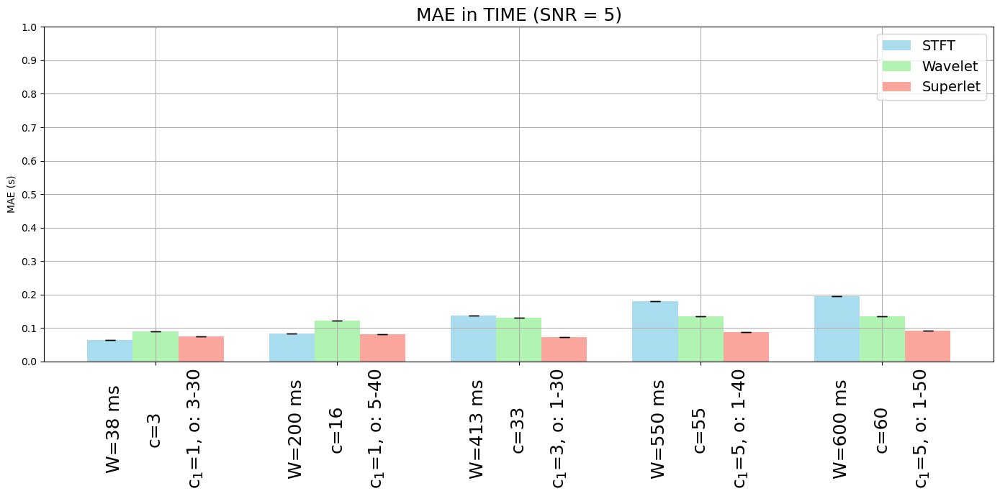

In [88]:
params_stft = windows_ms

# Número de condiciones
num_conditions = len(mae_wavelet_t)
x = np.arange(num_conditions)  # Posiciones para cada grupo de barras
bar_width = 0.25  # Ancho de las barras

# Crear el gráfico de barras
plt.figure(figsize=(14, 7))

# Graficar cada técnica con sus valores y barras de error
plt.bar(x - bar_width, mae_stft_t, width=bar_width, yerr=std_stft_t, capsize=5, label='STFT', color='skyblue', alpha=0.7)
plt.bar(x, mae_wavelet_t, width=bar_width, yerr=std_wavelet_t, capsize=5, label='Wavelet', color='lightgreen', alpha=0.7)
plt.bar(x + bar_width, mae_superlet_t, width=bar_width, yerr=std_superlet_t, capsize=5, label='Superlet', color='salmon', alpha=0.7)

# Configuración de etiquetas en el eje x con los parámetros específicos
labels = [
    f"W={p_stft} ms\n\nc={p_w}\n\nc$_1$={p_s[0]}, o: {p_s[1]}-{p_s[2]}"
    for p_w, p_s, p_stft in zip(params_wavelet, zip(*params_superlet), params_stft)
]

plt.xticks(x, labels, rotation=90, ha='center', fontsize=18)
#plt.xlabel('Condiciones y Parámetros')
plt.yticks(np.arange(0, 1.1, 0.1))

plt.ylabel('MAE (s)')
plt.title('MAE in TIME (SNR = ' + str(SNR) +')', fontsize=18)
plt.ylim(0,1)
plt.legend(fontsize=14)
plt.grid(True)

# Ajustar el layout para mejorar visualización de etiquetas
plt.tight_layout()

# Mostrar el gráfico
plt.show()

# COMPUTE RESOLUTION

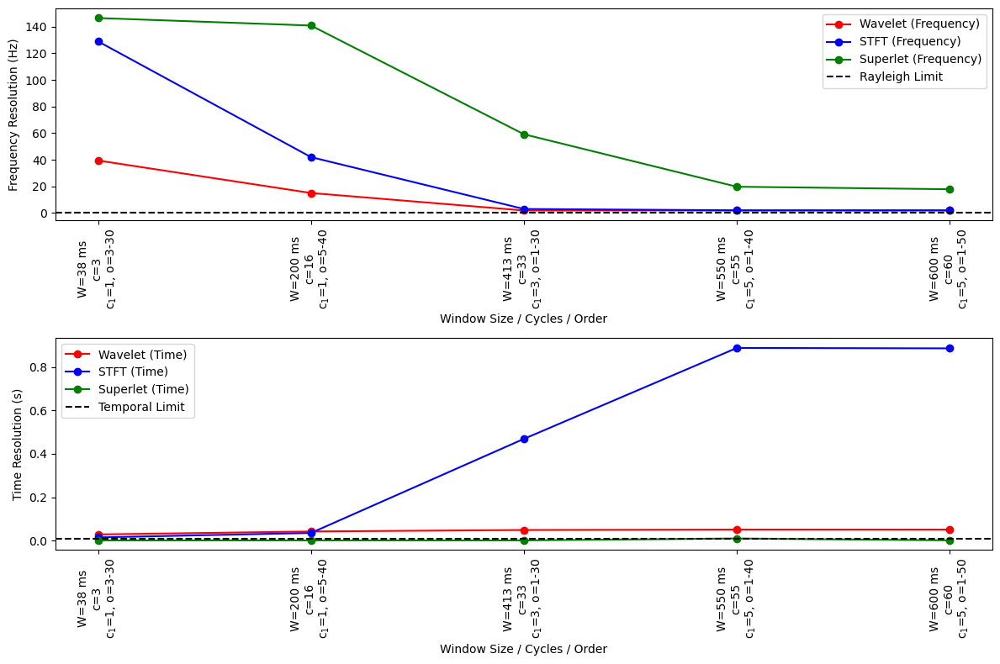

In [89]:
rayleigh_limit = 1 / (4 * np.pi)

# Etiquetas para los grupos de parámetros con salto de línea adicional
labels = [
    f"W={p_stft} ms\nc={p_wavelet}\nc$_1$={p_superlet[0]}, o={p_superlet[1]}-{p_superlet[2]}"
    for p_wavelet, p_superlet, p_stft in zip(params_wavelet, zip(*params_superlet), params_stft)
]

x = np.arange(1,len(params_wavelet)+1)

plt.figure(figsize=(12, 8))

# Primer gráfico (Frecuencia)
plt.subplot(2, 1, 1)
plt.plot(x, [r[1] for r in res_wavelet], 'ro-', label="Wavelet (Frequency)")
plt.plot(x, [r[1] for r in res_stft], 'bo-', label="STFT (Frequency)")
plt.plot(x, [r[1] for r in res_superlet], 'go-', label="Superlet (Frequency)")
plt.axhline(rayleigh_limit, color='k', linestyle='--', label="Rayleigh Limit")
plt.xlabel("Window Size / Cycles / Order")
plt.ylabel("Frequency Resolution (Hz)")
plt.legend()

# Segundo gráfico (Tiempo)
plt.subplot(2, 1, 2)
plt.plot(x, [r[0] for r in res_wavelet], 'ro-', label="Wavelet (Time)")
plt.plot(x, [r[0] for r in res_stft], 'bo-', label="STFT (Time)")
plt.plot(x, [r[0] for r in res_superlet], 'go-', label="Superlet (Time)")
plt.axhline(1 / MNF_1[0], color='k', linestyle='--', label="Temporal Limit")
plt.xlabel("Window Size / Cycles / Order")
plt.ylabel("Time Resolution (s)")
plt.legend()

# Ajuste de los xticks para ambos subgráficos
for ax in plt.gcf().get_axes():
    ax.set_xticks(x)  # Establecer los valores de los ticks
    ax.set_xticklabels(labels, rotation=90, ha='center', fontsize=10)  # Establecer las etiquetas con el formato deseado

# Ajustar el diseño
plt.tight_layout()
plt.show()

In [90]:
MAES_f

{'stft': [[25.686807509114125,
   12.469091937665304,
   10.504844351134729,
   9.830441919679494,
   9.591200972212985]],
 'wavelet': [[17.98834143654191,
   12.294081253115408,
   10.789174868636747,
   10.107083429131656,
   10.040272115074695]],
 'superlet': [[36.17019356405298,
   35.077817523641066,
   21.469213631336924,
   15.666614972193917,
   13.456367223831096]],
 'std_stft': [[30.36950615911098,
   13.607029949115667,
   9.51214603631189,
   8.300511957948252,
   7.949538243587159]],
 'std_wavelet': [[22.648514, 14.70026, 12.330635, 11.212206, 11.081735]],
 'std_superlet': [[28.993743521934565,
   26.115360968882545,
   20.0813518955891,
   13.979430316021311,
   12.860041509849026]]}

In [91]:
MAES_f['wavelet'].append(mae_wavelet_f)
MAES_f['stft'].append(mae_stft_f)
MAES_f['superlet'].append(mae_superlet_f)
MAES_f['std_wavelet'].append(std_wavelet_f)
MAES_f['std_stft'].append(std_stft_f)
MAES_f['std_superlet'].append(std_superlet_f)

In [92]:
MAES_t

{'stft': [[0.0341796875,
   0.1923828125,
   0.400390625,
   0.5341796875,
   0.5830078125]],
 'wavelet': [[0.014978834255942708,
   0.02572451970042322,
   0.03158580267014033,
   0.041354607619667805,
   0.04330836860957343]],
 'superlet': [[0.00814067079127323,
   0.010094431781178859,
   0.021816997720612186,
   0.038423966134809584,
   0.041354607619667805]],
 'std_stft': [[0.0, 0.0, 0.0, 0.0, 0.0]],
 'std_wavelet': [[0.0, 0.0, 0.0, 0.0, 0.0]],
 'std_superlet': [[0.0, 0.0, 0.0, 0.0, 0.0]]}

In [93]:
MAES_t['wavelet'].append(mae_wavelet_t)
MAES_t['stft'].append(mae_stft_t)
MAES_t['superlet'].append(mae_superlet_t)
MAES_t['std_wavelet'].append(std_wavelet_t)
MAES_t['std_stft'].append(std_stft_t)
MAES_t['std_superlet'].append(std_superlet_t)

### WE REPEAT EVERYTHING WITH DIFFERENT SNR

## We reset the signal

In [94]:
plot_1 = False
plot_2 = False

Reference mean frequency: [110.97685447552273] Hz


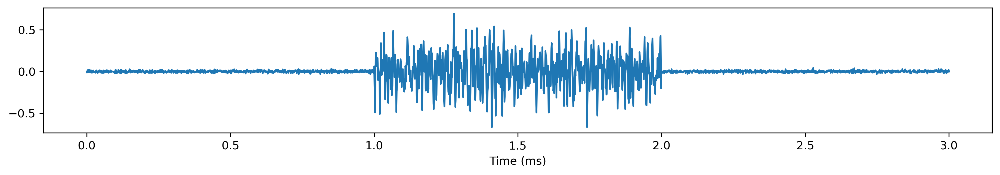

In [95]:
signal = baseline_1
fig, ax = plt.subplots(figsize=(15, 2), dpi=300)
ax.set_xlabel("Time (ms)")
ax.plot(jnp.linspace(0, len(signal) / fs, len(signal)), signal)
print(f"Reference mean frequency: {MNF_1} Hz")

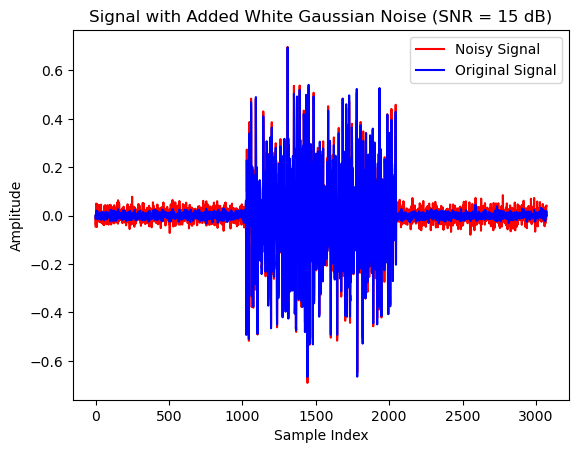

In [96]:
SNR = 15
#signal_noise = add_noise(baseline_1, SNR, plot = True)
signal_noise = add_noise(signal, SNR, plot=True)
#signal_noise = add_wgn_to_sig(baseline_1, noise, SNR)
signal = signal_noise

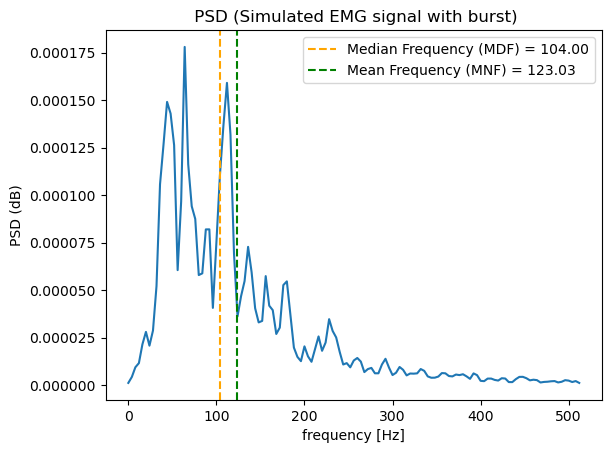

In [97]:
psd_welch, f_welch, MNF = superlet.compute_psd_welch(signal, fs, plot=True, muscle='Simulated EMG signal with burst')

In [98]:
MNF_1

[110.97685447552273]

Reference mean frequency: [110.97685447552273] Hz


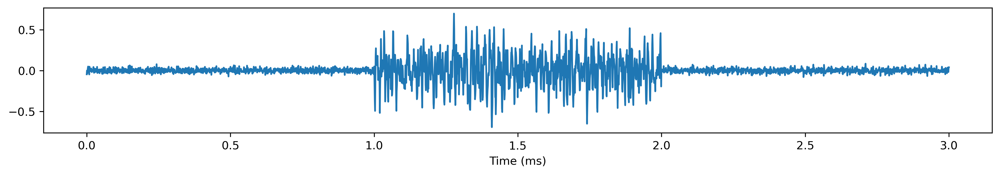

In [99]:
fig, ax = plt.subplots(figsize=(15, 2), dpi=300)
ax.set_xlabel("Time (ms)")
ax.plot(jnp.linspace(0, len(signal) / fs, len(signal)), signal)
print(f"Reference mean frequency: {MNF_1} Hz")

## WAVELET PARAMETERS = 3, 16, 33, 55, 60, 115 cycles

In [100]:
importlib.reload(superlet)

<module 'superlets_package.superlets' from '/Users/neuralrehabilitationgroup/PycharmProjects/Superlets-Marina/superlets_package/superlets.py'>

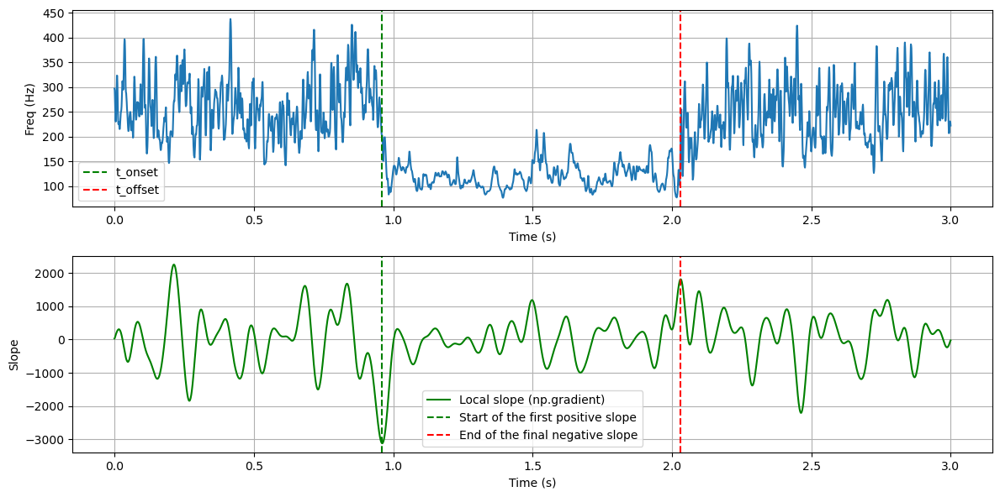

121.206406
Onset = 0.9602735265385868, offset = 2.030934549006838
1.0706610224682511
1


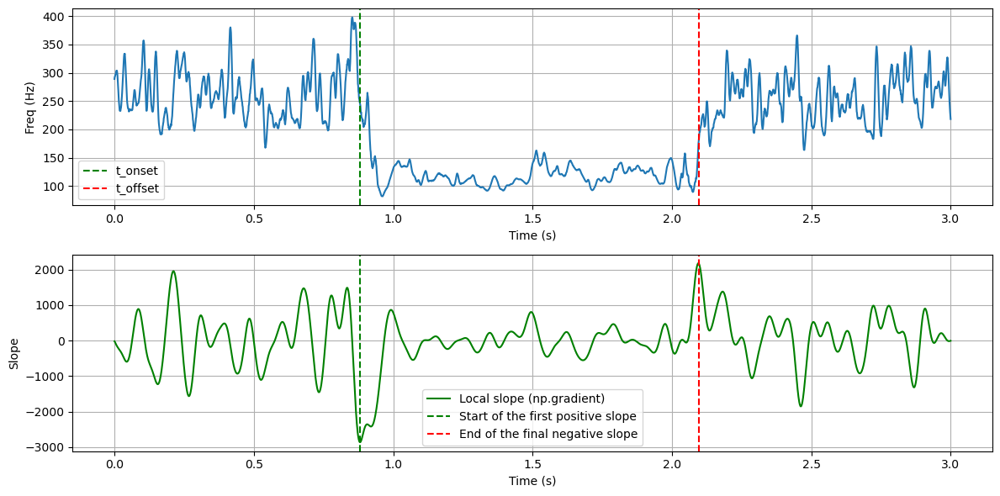

118.79504
Onset = 0.8811462064474113, offset = 2.095408661673722
1.2142624552263106
1


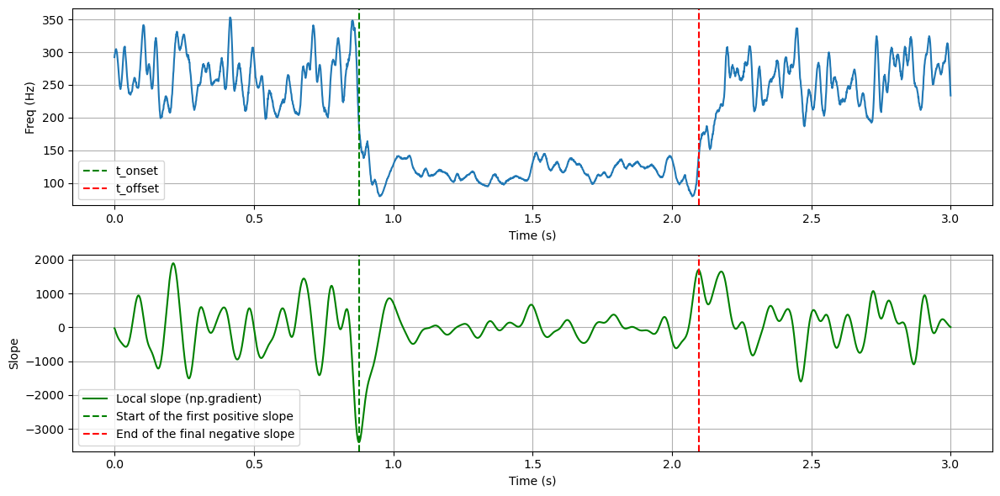

118.60826
Onset = 0.8772386844676001, offset = 2.095408661673722
1.2181699772061219
1


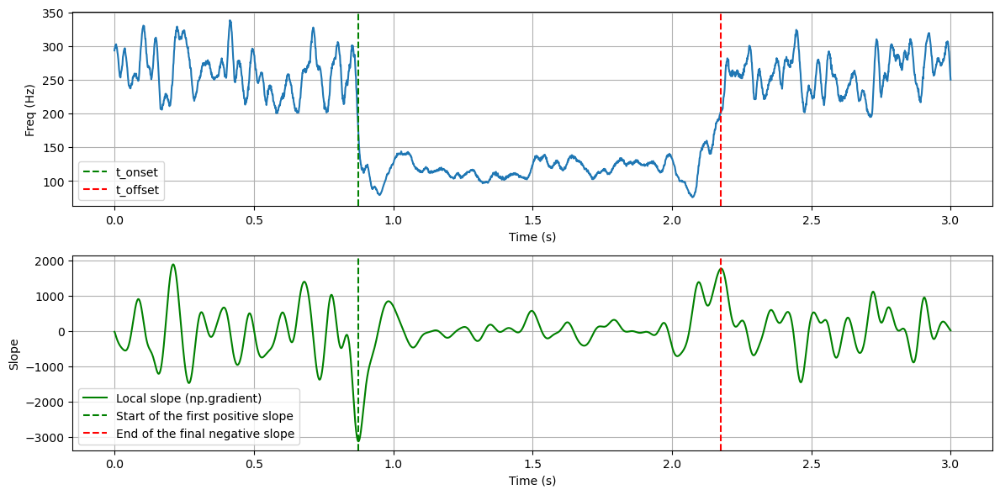

118.880066
Onset = 0.8752849234776946, offset = 2.176489742754803
1.3012048192771086
1


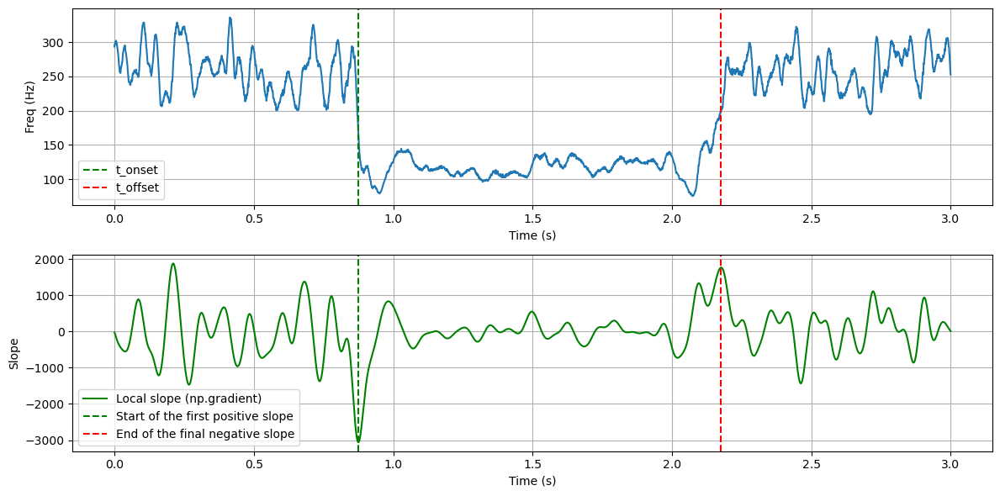

118.95841
Onset = 0.8752849234776946, offset = 2.176489742754803
1.3012048192771086
1


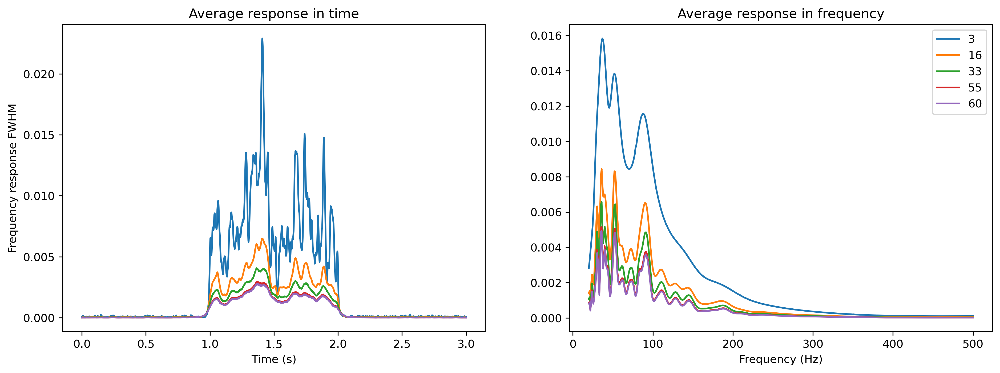

In [101]:
if plot_1:
    fig, ax = plt.subplots(ncols=len(params_wavelet), figsize=(18, 5), dpi=300)
if plot_2:
    fig_2, ax_2 = plt.subplots(ncols=len(params_wavelet), figsize=(18, 5), dpi=300)
    fig_3, ax_3 = plt.subplots(figsize=(10, 6))

mae_wavelet_f = []
std_wavelet_f = []

mae_wavelet_t = []
std_wavelet_t = []

total_time = []
total_freq = []

total_scalogram_wavelet = []
res_wavelet = []

# Iterar sobre los parámetros de wavelet
for i, c in enumerate(params_wavelet):
    wavelet = f"cmor{c}-1.0"

    cwtmatr, f, physical_freqs = morlet.wavelet_transform_2(signal,wavelet,freqs,fs)
    cwtmatr = np.abs(cwtmatr[:, :])
    
    if save:
        df = pd.DataFrame(cwtmatr)
    
        # Guardar en un archivo CSV
        filename = os.path.join(new_folder_path, str(SNR) + "dB_wv_" + str(c) + ".csv")
        df.to_csv(filename, index=False, header=False)  # Sin índices ni encabezados
    
    scalogram_2 = jnp.abs(cwtmatr)**2

    if plot_1:
        pcm = ax[i].pcolormesh(t,f, scalogram_2, shading='gouraud', cmap='jet')
        
        ax[i].set_title(f'c={c}')
        ax[i].set_ylabel('Frecuencia [Hz]')
        ax[i].set_xlabel('Tiempo [s]')
        
        cbar = fig.colorbar(pcm, ax=ax[i], orientation='horizontal')
        cbar.set_label('Power', rotation=0, labelpad=15)  # Etiqueta de la colorbar
    
        ax[i].set_ylim(freqs[0], freqs[-1])  # Ajustar el rango de frecuencias si es necesario
        plt.tight_layout()

    total_scalogram_wavelet.append(scalogram_2)
    instant_mean_freq_total = []

    instant_freq = np.sum(scalogram_2 * f[:, np.newaxis], axis=0) / np.sum(scalogram_2, axis=0)

    # OBTAIN THE POINTS IN TIME WHERE BURST IS DETECTED
    slope_threshold = 450
    
    from scipy.ndimage import gaussian_filter1d
    # 1. Compute the derivative to see the slope
    sigma = 20  # Desviación estándar del filtro
    y_smooth = gaussian_filter1d(instant_freq, sigma)

    # Calcular pendientes locales usando np.gradient sobre la señal suavizada
    slope_gradient = np.gradient(y_smooth, t)
    #slope_gradient = np.gradient(instant_freq, t)
    
    first_index = np.argmin(slope_gradient[inicio:time_range]) + inicio
    last_index = np.argmax(slope_gradient[time_range:time_range+time_shift]) + time_range  # Índice del mínimo más significativo
    
    t_onset = t[first_index]
    t_offset = t[last_index]
    
    # Visualization
    plt.figure(figsize=(12, 6))

    plt.subplot(2, 1, 1)
    plt.plot(t, instant_freq)
    plt.axvline(t_onset, color='green', linestyle='--', label='t_onset')
    plt.axvline(t_offset, color='red', linestyle='--', label='t_offset')
    plt.xlabel('Time (s)')
    plt.ylabel('Freq (Hz)')
    plt.legend()
    plt.grid()
    
    # Slopes and t_onset and t_offset
    plt.subplot(2, 1, 2)
    plt.plot(t, slope_gradient, 'g-', label='Local slope (np.gradient)')
    plt.axvline(t[first_index], color='green', linestyle='--', label='Start of the first positive slope')
    plt.axvline(t[last_index], color='red', linestyle='--', label='End of the final negative slope')
    plt.xlabel('Time (s)')
    plt.ylabel('Slope')
    plt.legend()
    plt.grid()

    plt.tight_layout()
    plt.show()

    start_idx = np.searchsorted(t, burst_start_1)  # Encuentra el índice de inicio
    end_idx = np.searchsorted(t, burst_start_1 + burst_duration_1)  # Encuentra el índice final
#
    instant_mean_freq_burst = instant_freq[start_idx:end_idx]

    if plot_2:
        ax_2[i].plot(t, instant_freq)

        ax_2[i].set_xlabel("Time (s)")
        ax_2[i].set_ylabel("Frequency (Hz)")
        #ax_2[i].set_xlim(t[0], t[-1])
        #plt.title("Medias de cada fila en función del tiempo")
        ax_2[i].grid(True)

        ax_3.plot(t, instant_freq, label=f"Mean frequency (Cycles: {c})")
        plt.tight_layout()

    #MAE in frequency
    print(np.mean(instant_mean_freq_burst))
    mae_f, std_f = calculate_mae(instant_mean_freq_burst, MNF_1)
    mae_wavelet_f.append(mae_f)
    std_wavelet_f.append(std_f)
    
    #MAE in time
    print(f'Onset = {t_onset}, offset = {t_offset}')
    estimates_combined = t_offset - t_onset
    print(estimates_combined)
    true_values_combined = t_offset_1 - t_onset_1
    print(true_values_combined)

    mae_t, std_t = calculate_mae(estimates_combined, true_values_combined)
    mae_wavelet_t.append(mae_t)
    std_wavelet_t.append(std_t)

    time = np.arange(scalogram_2.shape[1]) / fs

    total_time.append(time)
    total_freq.append(freqs)

# Configuración del gráfico
if plot_2:
    ax_3.set_xlabel("Time (s)")
    ax_3.set_ylabel("Frequency (Hz)")
    ax_3.legend()
    ax_3.grid(True)
    ax_3.set_title("Comparación de frecuencias medias instantáneas")

res_wavelet = superlet.compute_avg_response_resolution(total_scalogram_wavelet, total_time, total_freq, params_wavelet)

In [102]:
mae_wavelet_f

[19.03767294264325,
 13.070445827961139,
 11.428208026811694,
 10.889235061279898,
 10.84240032362689]

In [103]:
mae_wavelet_t

[0.07066102246825112,
 0.2142624552263106,
 0.21816997720612186,
 0.3012048192771086,
 0.3012048192771086]

## PARÁMETROS SUPERLET: base_cycle, min_order, max_order = [3, 5, 1, 1, 1, 1], [1, 1, 5, 10, 20, 30], [30, 30, 40, 100, 100, 200]

In [104]:
importlib.reload(superlet)

<module 'superlets_package.superlets' from '/Users/neuralrehabilitationgroup/PycharmProjects/Superlets-Marina/superlets_package/superlets.py'>

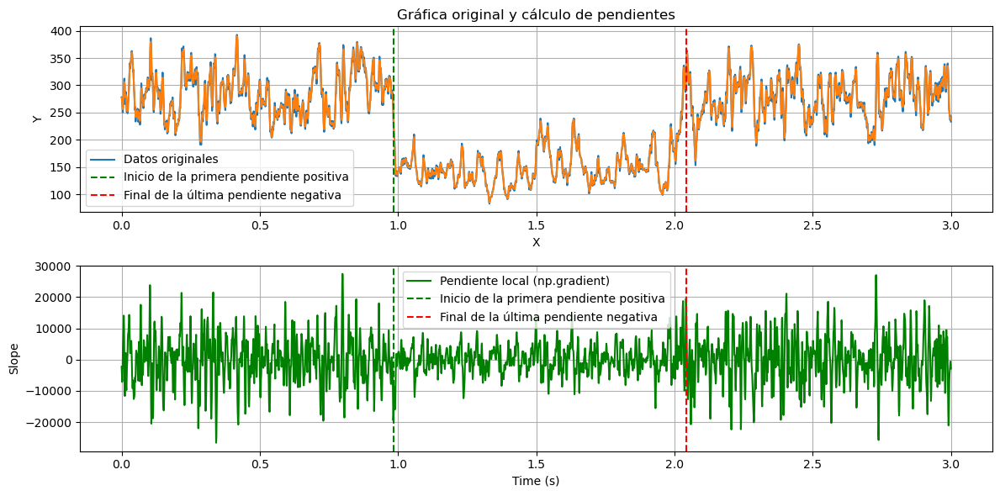

147.73689845739347
Onset = 0.9827417779225008, offset = 2.0416802344513187
1.0589384565288178
1


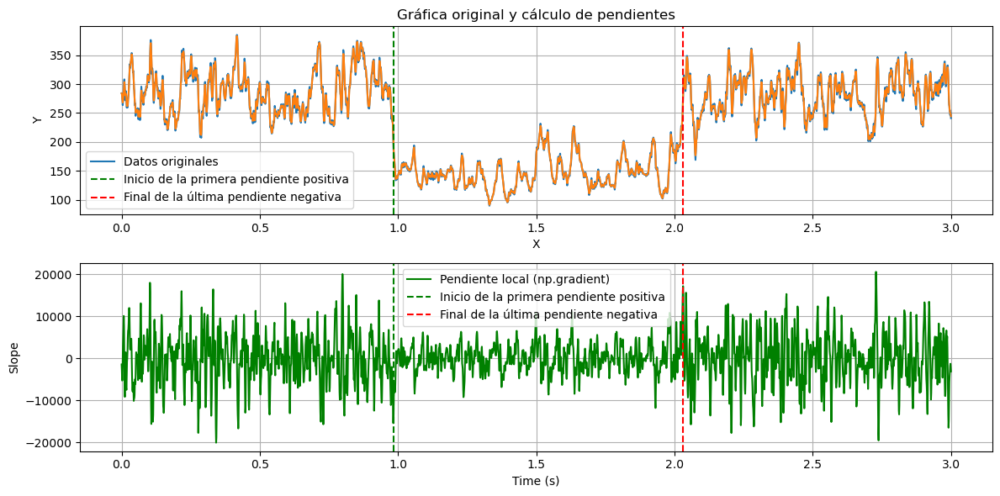

147.16989469708443
Onset = 0.9827417779225008, offset = 2.030934549006838
1.048192771084337
1


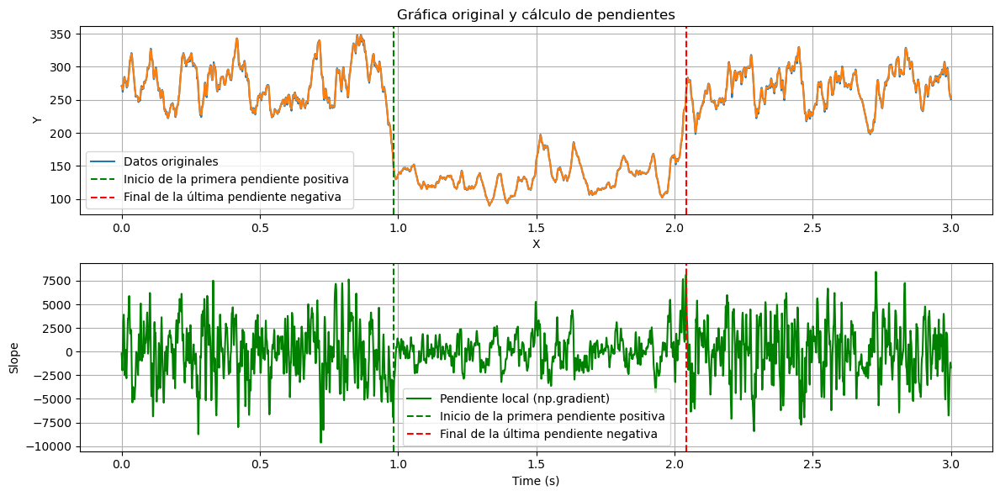

132.0572230905533
Onset = 0.9827417779225008, offset = 2.0416802344513187
1.0589384565288178
1


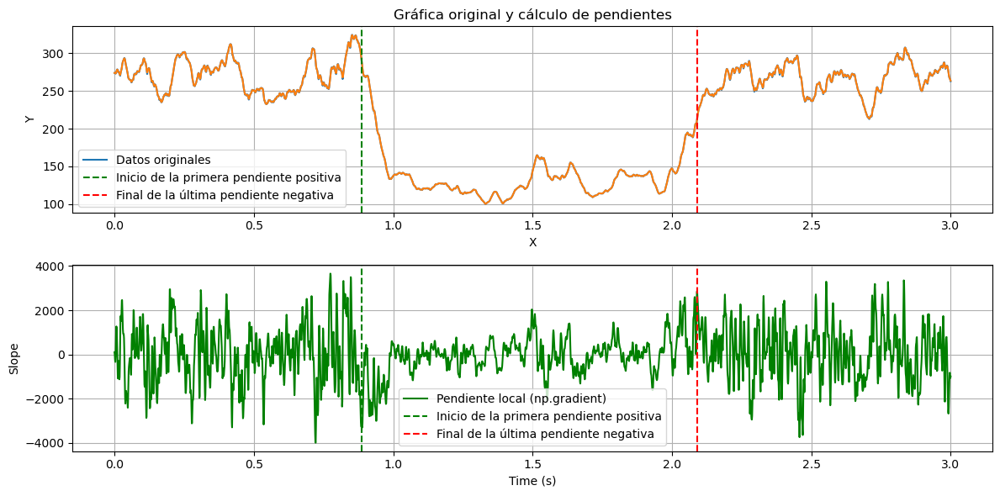

127.17927784653803
Onset = 0.8879843699120807, offset = 2.090524259198958
1.2025398892868773
1


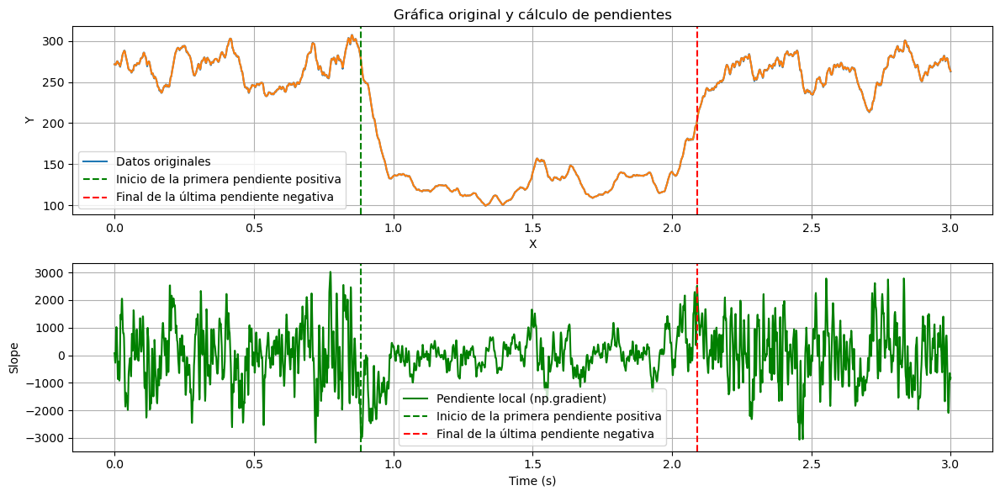

124.42342482823182
Onset = 0.8850537284272224, offset = 2.090524259198958
1.2054705307717357
1


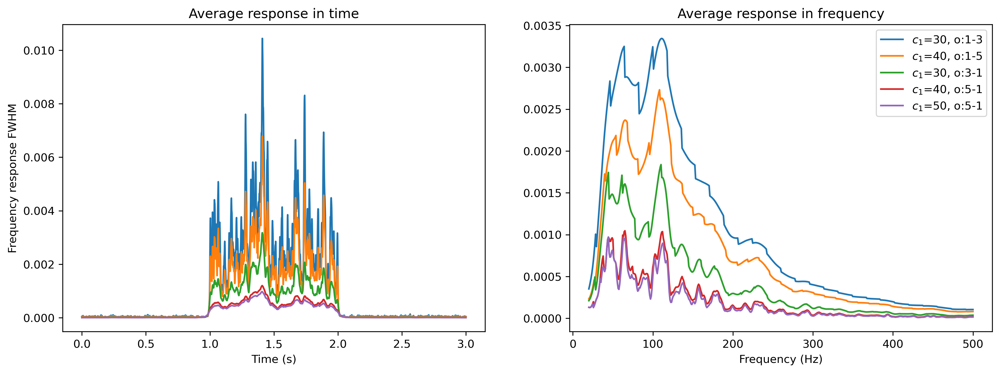

In [107]:
if plot_1:
    fig, ax = plt.subplots(ncols=len(params_superlet[0]), figsize=(15, 5), dpi=300)

if plot_2:
    fig_2, ax_2 = plt.subplots(ncols=len(params_superlet[0]), figsize=(15, 5), dpi=300)
    fig_3, ax_3 = plt.subplots(figsize=(10, 6))

mae_superlet_f = []
std_superlet_f = []

mae_superlet_t = []
std_superlet_t = []

total_time = []
total_freq = []

total_scalogram_superlet = []

for (i, (base_cycle, min_order, max_order)) in enumerate(zip(*params_superlet)):

    wv, scalogram = superlet.adaptive_superlet_transform(signal, freqs, sampling_freq=fs,
                                                         base_cycle=base_cycle, min_order=min_order,
                                                         max_order=max_order, mode="mul")
    
    if plot_1:
        im = ax[i].imshow(jnp.abs(scalogram) ** 2, aspect='auto', cmap="jet", interpolation="none", origin="lower",extent=[0, len(signal) / fs, freqs[0], freqs[-1]])
        ax[i].set_title(f"$c_1$: {base_cycle}, o: {min_order}-{max_order}")
        ax[i].set_xlabel("Time (s)")
        ax[i].set_ylabel("Frequency (Hz)")

        cbar = fig.colorbar(im, ax=ax[i], orientation='horizontal')
        cbar.set_label('Power [a.u]', rotation=0, labelpad=15)  # Etiqueta de la colorbar
        plt.tight_layout()

    scalogram_2 = np.abs(scalogram) ** 2
    
    if save:
        df = pd.DataFrame(scalogram_2)
    
        # Guardar en un archivo CSV
        filename = os.path.join(new_folder_path,str(SNR) + "dB_superlet_" + str(base_cycle) + "-" + str(min_order) + "-" + str(max_order) + ".csv")
        df.to_csv(filename, index=False, header=False)  # Sin índices ni encabezados

    instant_mean_freq_total = []
    total_scalogram_superlet.append(scalogram_2)
    
    instant_freq = np.sum(scalogram_2 * freqs[:, np.newaxis], axis=0) / np.sum(scalogram_2, axis=0)
    
    slope_threshold = 450
    from scipy.ndimage import gaussian_filter1d
    # 1. Compute the derivative to see the slope

    y_smooth = gaussian_filter1d(instant_freq, sigma)
    
    # 2. Calcular la pendiente general ajustando una línea recta (np.polyfit)
    slope_gradient = np.gradient(y_smooth, t)  # Grado 1 para línea recta
    
    # Encontrar el inicio de la primera pendiente positiva
    first_index = np.argmin(slope_gradient[inicio:time_range]) + inicio
    last_index = np.argmax(slope_gradient[time_range:time_range+time_shift]) + time_range  # Índice del mínimo más significativo
    
    t_onset = t[first_index]
    t_offset = t[last_index]
    
    # Visualización
    plt.figure(figsize=(12, 6))
    
    # Gráfica original
    plt.subplot(2, 1, 1)
    plt.plot(t, instant_freq, label='Datos originales')
    plt.plot(t, y_smooth)
    plt.axvline(t_onset, color='green', linestyle='--', label='Inicio de la primera pendiente positiva')
    plt.axvline(t_offset, color='red', linestyle='--', label='Final de la última pendiente negativa')
    plt.title('Gráfica original y cálculo de pendientes')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.legend()
    plt.grid()
    
    # Gráfica de pendientes
    # Gráfica de pendientes
    plt.subplot(2, 1, 2)
    plt.plot(t, slope_gradient, 'g-', label='Pendiente local (np.gradient)')
    plt.axvline(t_onset, color='green', linestyle='--', label='Inicio de la primera pendiente positiva')
    plt.axvline(t_offset, color='red', linestyle='--', label='Final de la última pendiente negativa')
    plt.xlabel('Time (s)')
    plt.ylabel('Slope')
    plt.legend()
    plt.grid()

    plt.tight_layout()
    plt.show()
      

    initial_imnf = instant_freq[:round(burst_start_1 * fs) - offset]
    instant_mean_freq_total.extend(initial_imnf)
    # plt.figure()
    # plt.plot(initial_imnf)

    instant_mean_freq_burst = instant_freq[
                              round(burst_start_1 * fs):round((burst_start_1 + burst_duration_1) * fs)]
    instant_mean_freq_burst = instant_mean_freq_burst[offset_burst:round(len(instant_mean_freq_burst)) - offset_burst]
    instant_mean_freq_total.extend(instant_mean_freq_burst)

    final_imnf = instant_freq[round((burst_start_1 + burst_duration_1) * fs) + offset:]
    instant_mean_freq_total.extend(final_imnf)
    # plt.figure()
    # plt.plot(final_imnf)
    # plt.figure()
    # plt.plot(instant_mean_freq_total)

    if plot_2:
        ax_2[i].plot(t, instant_mean_freq_total,
                     label="Mean frequency (each window of " + str(len(freqs)) + ' samples)')

        ax_2[i].set_xlabel("Time (s)")
        ax_2[i].set_ylabel("Frequency (Hz)")
        #ax_2[i].set_xlim(tiempo[0], tiempo[-1])
        #plt.title("Medias de cada fila en función del tiempo")
        ax_2[i].legend()
        ax_2[i].grid(True)

        ax_3.plot(t, instant_mean_freq_total, label=f"Mean frequency (Cycles: {base_cycle})")

     #MAE in frequency
    print(np.mean(instant_mean_freq_burst))
    mae_f, std_f = calculate_mae(instant_mean_freq_burst, MNF_1)
    mae_superlet_f.append(mae_f)
    std_superlet_f.append(std_f)
    
    #MAE in time
    print(f'Onset = {t_onset}, offset = {t_offset}')
    estimates_combined = t_offset - t_onset
    print(estimates_combined)
    true_values_combined = t_offset_1 - t_onset_1
    print(true_values_combined)

    mae_t, std_t = calculate_mae(estimates_combined, true_values_combined)
    mae_superlet_t.append(mae_t)
    std_superlet_t.append(std_t)

    time = np.arange(scalogram_2.shape[1]) / fs

    total_time.append(time)
    total_freq.append(freqs)

    total_time.append(t)
    total_freq.append(freqs)

if plot_2:
    ax_3.set_xlabel("Time (s)")
    ax_3.set_ylabel("Frequency (Hz)")
    ax_3.legend()
    ax_3.grid(True)
    ax_3.set_title("Comparación de frecuencias medias instantáneas")

res_superlet = superlet.compute_avg_response_resolution(total_scalogram_superlet, total_time, total_freq, [f'$c_1$={c3}, o:{c1}-{c2}' for c1, c2, c3 in zip(*params_superlet)])

In [108]:
mae_superlet_f

[38.02232594415604,
 37.01714163526915,
 23.013188356760907,
 17.325621790641453,
 14.92214665188154]

In [109]:
mae_superlet_t

[0.058938456528817795,
 0.04819277108433706,
 0.058938456528817795,
 0.20253988928687727,
 0.20547053077173572]

## STFT PARAMETERS (window = duration/cycles) = 38, 200, 413, 550, 600, 824 ms

In [ ]:
importlib.reload(superlet)

# Parámetros de la STFT con ventanas de 38 ms, 200 ms, y 413 ms (convertido a muestras)

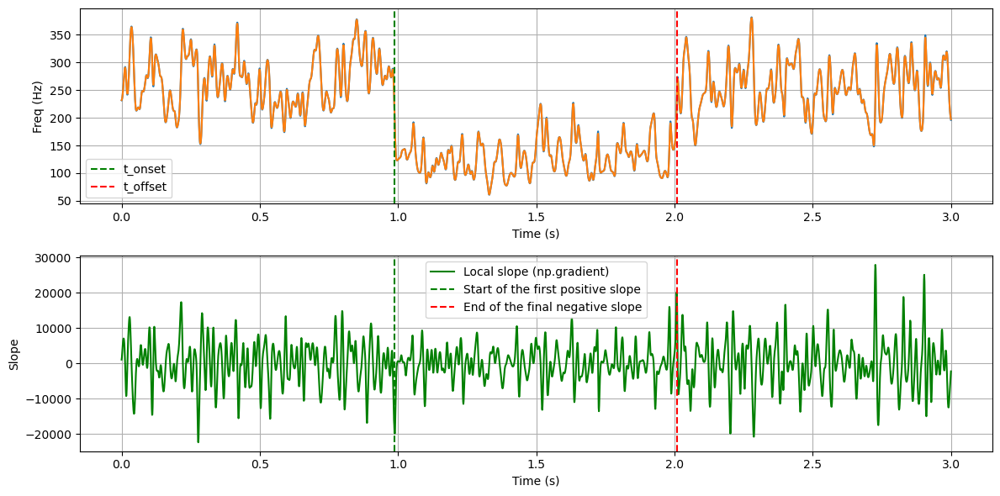

128.26549092130767
Onset = 0.98828125, offset = 2.0078125
1.01953125
1


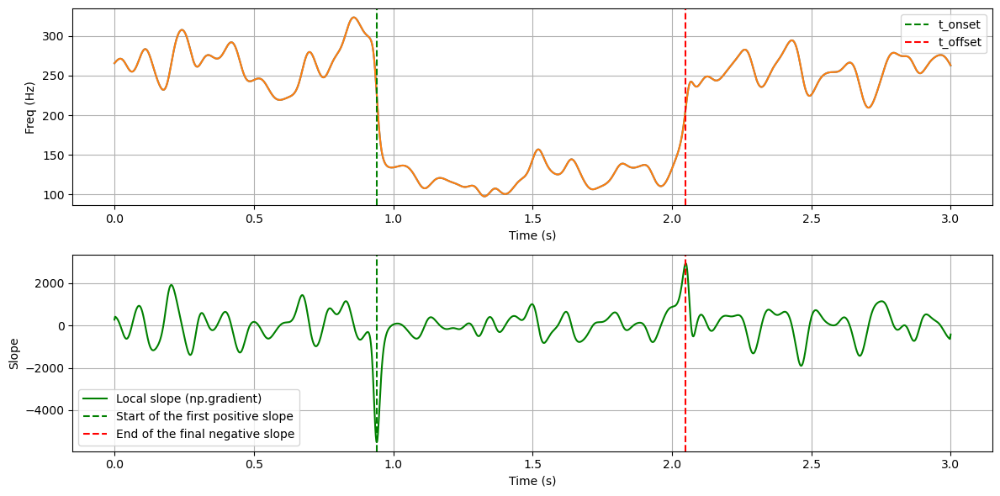

121.76794023631065
Onset = 0.94140625, offset = 2.0498046875
1.1083984375
1


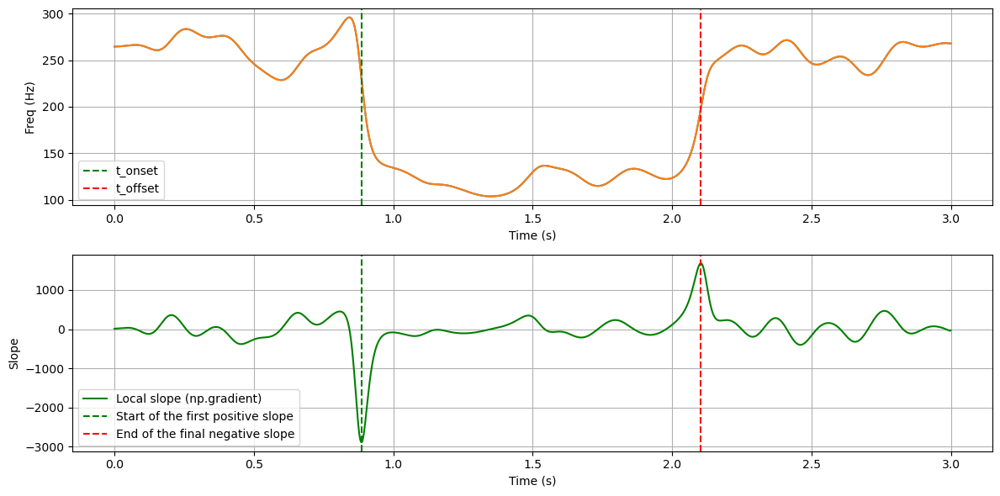

121.06175860216146
Onset = 0.8857421875, offset = 2.103515625
1.2177734375
1


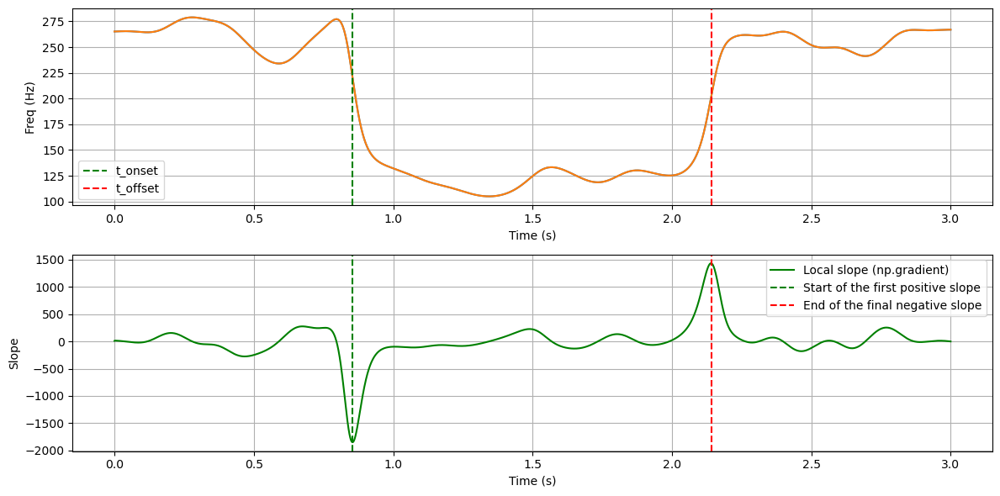

120.69052773861594
Onset = 0.8544921875, offset = 2.140625
1.2861328125
1


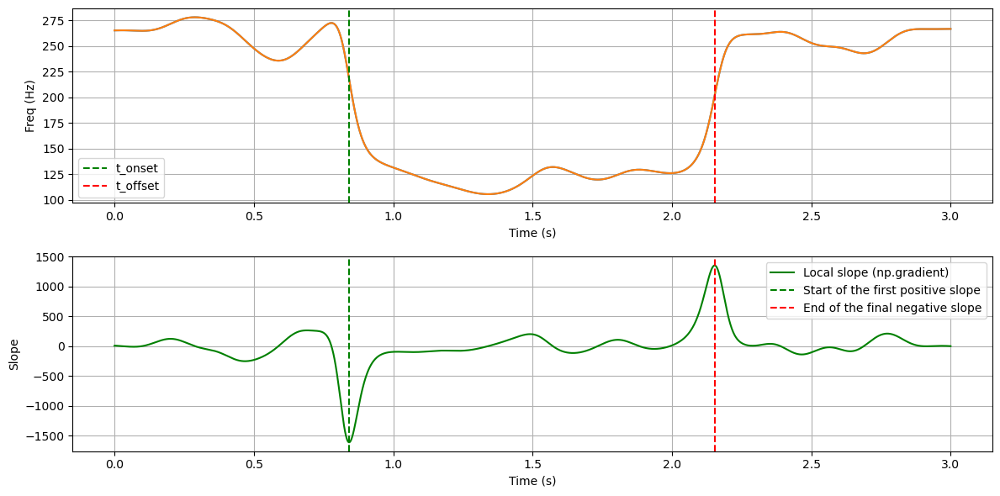

120.56881571352176
Onset = 0.841796875, offset = 2.1533203125
1.3115234375
1


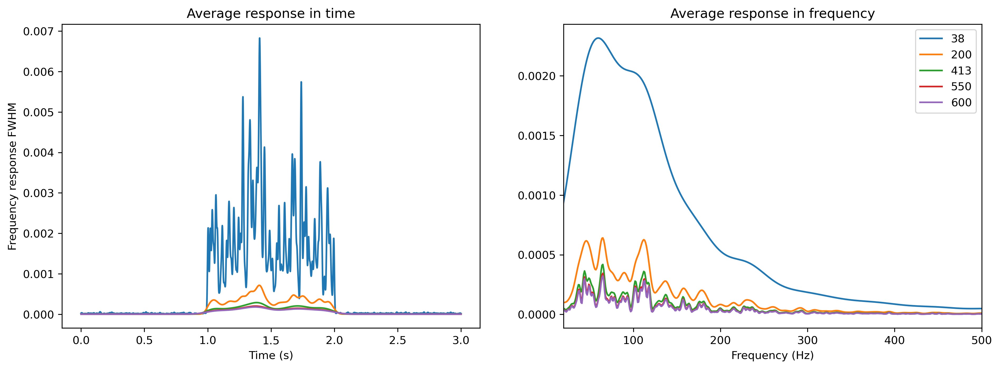

In [110]:
if plot_1:
    fig, ax = plt.subplots(ncols=len(windows_ms), figsize=(15, 5), dpi=300)

if plot_2:
    fig_2, ax_2 = plt.subplots(ncols=len(windows_ms), figsize=(15, 5), dpi=300)
    fig_3, ax_3 = plt.subplots(figsize=(10, 6))

mae_stft_f = []
std_stft_f = []

mae_stft_t = []
std_stft_t = []

total_time = []
total_freq = []

res_stft = []
total_scalogram_stft = []

for i, w in enumerate(windows_ms):
    # Calcular la ventana Blackman
    window = windows.blackman(w)
    
    # Hacer que la f de la stft tenga el mismo tamaño que las demás
    nfft = 2 * (len(freqs))
    # Dimensión de la frecuencia = nfft/2 + 1
    # Dimesión del tiempo = [(N - noverlap)/(nperseg-noverlap)] + 1 = 
    
    # Realizar la STFT con la ventana Blackman y superposición del 50%
    #f, t, Zxx = stft(signal, fs, window=window, nfft=nfft, nperseg=w, noverlap=w//2, padded=True, scaling='psd')
    f, t_stft, Zxx = stft(signal, fs=fs, window='blackman', nperseg=w, noverlap=w-1, nfft=nfft, detrend=False, return_onesided=True, boundary='zeros', padded=True, axis=-1, scaling='spectrum')
    
    # ax[i].pcolormesh(t, f, np.abs(Zxx), shading='gouraud', cmap='jet')
    
    # Calcular la representación de potencia (magnitud al cuadrado)
    Zxx_power = np.abs(Zxx) ** 2
    
    if plot_1:
        pcm = ax[i].pcolormesh(t_stft, f, Zxx_power, shading='gouraud', cmap='jet')
        
        ax[i].set_title(f'W={w * 1000 // fs} ms')
        ax[i].set_ylabel('Frecuencia [Hz]')
        ax[i].set_xlabel('Tiempo [s]')
        
        cbar = fig.colorbar(pcm, ax=ax[i], orientation='horizontal')
        cbar.set_label('Power', rotation=0, labelpad=15)  # Etiqueta de la colorbar
    
        #fig.colorbar(pcm, ax=ax[i], label='Potencia')
        ax[i].set_ylim(freqs[0], freqs[-1])  # Ajustar el rango de frecuencias si es necesario
        plt.tight_layout()
    
    scalogram_2 = Zxx_power
    
    if save:
        df = pd.DataFrame(scalogram_2)
    
        # Guardar en un archivo CSV
        filename = os.path.join(new_folder_path, str(SNR) + "dB_stft_" + str(w) + ".csv")
        df.to_csv(filename, index=False, header=False)  # Sin índices ni encabezados
        
    total_scalogram_stft.append(scalogram_2)
 
    instant_mean_freq_total = []   
    
    # Para evitar la división por cero
    denominador = np.sum(scalogram_2, axis=0)
    denominador = np.where(denominador == 0, 1e-10, denominador)
    instant_freq = np.sum(scalogram_2 * f[:, np.newaxis], axis=0) / denominador
    
    # OBTAIN THE POINTS IN TIME WHERE BURST IS DETECTED
    slope_threshold = 450
    
    from scipy.ndimage import gaussian_filter1d
    # 1. Compute the derivative to see the slope
    y_smooth = gaussian_filter1d(instant_freq, sigma)

    # Calcular pendientes locales usando np.gradient sobre la señal suavizada
    slope_gradient = np.gradient(y_smooth, t_stft)
    #slope_gradient = np.gradient(instant_freq, t)
    
    first_index = np.argmin(slope_gradient[inicio:time_range]) + inicio
    last_index = np.argmax(slope_gradient[time_range:time_range+time_shift]) + time_range  # Índice del mínimo más significativo
    
    t_onset = t_stft[first_index]
    t_offset = t_stft[last_index]
    
    # Visualization
    plt.figure(figsize=(12, 6))

    plt.subplot(2, 1, 1)
    plt.plot(t_stft, instant_freq)
    plt.plot(t_stft, y_smooth)
    plt.axvline(t_onset, color='green', linestyle='--', label='t_onset')
    plt.axvline(t_offset, color='red', linestyle='--', label='t_offset')
    plt.xlabel('Time (s)')
    plt.ylabel('Freq (Hz)')
    plt.legend()
    plt.grid()
    
    # Slopes and t_onset and t_offset
    plt.subplot(2, 1, 2)
    plt.plot(t_stft, slope_gradient, 'g-', label='Local slope (np.gradient)')
    plt.axvline(t_onset, color='green', linestyle='--', label='Start of the first positive slope')
    plt.axvline(t_offset, color='red', linestyle='--', label='End of the final negative slope')
    plt.xlabel('Time (s)')
    plt.ylabel('Slope')
    plt.legend()
    plt.grid()

    plt.tight_layout()
    plt.show()
    
    start_index = np.argmin(np.abs(t_stft - burst_start_1))
    end_index_burst = np.argmin(np.abs(t_stft - (burst_start_1 + burst_duration_1)))
    
    # Segmento inicial antes del burst
    initial_imnf = instant_freq[:max(0, start_index - offset)]  # Asegurar que no haya índices negativos
    instant_mean_freq_total.extend(initial_imnf)
    # plt.figure()
    # plt.plot(initial_imnf)
    
    # Segmento durante el burst
    instant_mean_freq_burst = instant_freq[start_index:end_index_burst]
    instant_mean_freq_burst = instant_mean_freq_burst[offset_burst:len(instant_mean_freq_burst)-offset_burst]  # Aplicar offset dentro del burst
    instant_mean_freq_total.extend(instant_mean_freq_burst)
    # plt.figure()
    # plt.plot(instant_mean_freq_burst)
    
    # Segmento final después del burst
    final_start_index = end_index_burst + offset
    final_imnf = instant_freq[final_start_index:]
    instant_mean_freq_total.extend(final_imnf)
  
    if plot_2:
        ax_2[i].plot(t_stft, instant_mean_freq_total, label="Mean frequency (each window of " + str(len(freqs)) + ' samples)')
        
        ax_2[i].set_xlabel("Time (s)")
        ax_2[i].set_ylabel("Frequency (Hz)")
        #ax_2[i].set_xlim(tiempo[0], tiempo[-1])
        #plt.title("Medias de cada fila en función del tiempo")
        ax_2[i].legend()
        ax_2[i].grid(True)
        
        ax_3.plot(t_stft, instant_mean_freq_total, label=f"Mean frequency (Cycles: {w})")
    
    #MAE in frequency
    print(np.mean(instant_mean_freq_burst))
    mae_f, std_f = calculate_mae(instant_mean_freq_burst, MNF_1)
    mae_stft_f.append(mae_f)
    std_stft_f.append(std_f)
    
    #MAE in time
    print(f'Onset = {t_onset}, offset = {t_offset}')
    estimates_combined = t_offset - t_onset
    print(estimates_combined)
    true_values_combined = t_offset_1 - t_onset_1
    print(true_values_combined)

    mae_t, std_t = calculate_mae(estimates_combined, true_values_combined)
    mae_stft_t.append(mae_t)
    std_stft_t.append(std_t)
    
    total_time.append(np.linspace(t_stft[0], t_stft[-1], scalogram_2.shape[1]))
    total_freq.append(np.linspace(f[0], f[-1], scalogram_2.shape[0]))

# Configuración del gráfico
if plot_2:
    ax_3.set_xlabel("Time (s)")
    ax_3.set_ylabel("Frequency (Hz)")
    ax_3.legend()
    ax_3.grid(True)
    ax_3.set_title("Comparación de frecuencias medias instantáneas")
        
res_stft = superlet.compute_avg_response_resolution(total_scalogram_stft, total_time, total_freq, windows_ms, stft=[freqs[0],freqs[-1]])

In [111]:
mae_stft_f

[26.975621595083872,
 13.52694771349313,
 11.967103086564514,
 11.255596529177142,
 11.005863024248477]

In [112]:
mae_stft_t

[0.01953125, 0.1083984375, 0.2177734375, 0.2861328125, 0.3115234375]

### Plot comparison of the same SNR

# MAE IN FREQUENCY

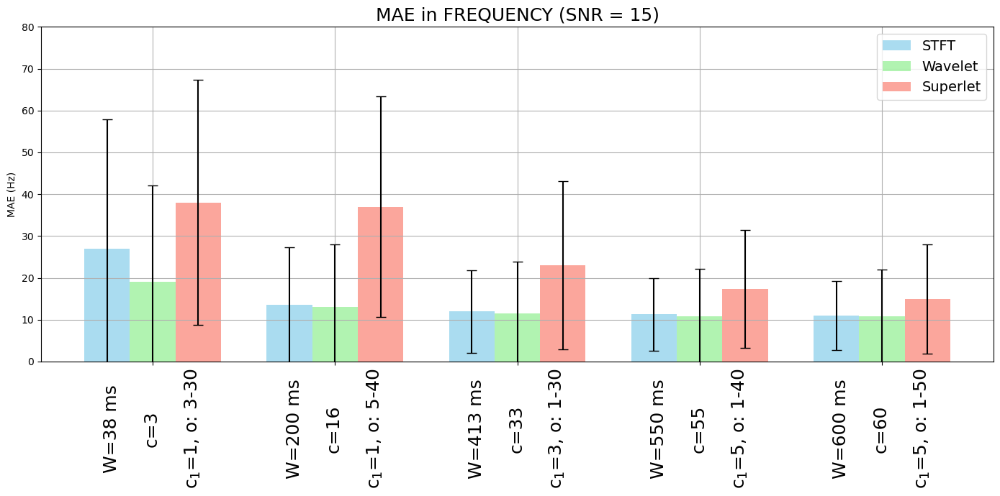

In [113]:
params_stft = windows_ms

# Número de condiciones
num_conditions = len(mae_wavelet_f)
x = np.arange(num_conditions)  # Posiciones para cada grupo de barras
bar_width = 0.25  # Ancho de las barras

# Crear el gráfico de barras
plt.figure(figsize=(14, 7))

# Graficar cada técnica con sus valores y barras de error
plt.bar(x - bar_width, mae_stft_f, width=bar_width, yerr=std_stft_f, capsize=5, label='STFT', color='skyblue', alpha=0.7)
plt.bar(x, mae_wavelet_f, width=bar_width, yerr=std_wavelet_f, capsize=5, label='Wavelet', color='lightgreen', alpha=0.7)
plt.bar(x + bar_width, mae_superlet_f, width=bar_width, yerr=std_superlet_f, capsize=5, label='Superlet', color='salmon', alpha=0.7)

# Configuración de etiquetas en el eje x con los parámetros específicos
labels = [
    f"W={p_stft} ms\n\nc={p_w}\n\nc$_1$={p_s[0]}, o: {p_s[1]}-{p_s[2]}"
    for p_w, p_s, p_stft in zip(params_wavelet, zip(*params_superlet), params_stft)
]

plt.xticks(x, labels, rotation=90, ha='center', fontsize=18)
#plt.xlabel('Condiciones y Parámetros')
plt.yticks(np.arange(0, 81, 10))

plt.ylabel('MAE (Hz)')
plt.title('MAE in FREQUENCY (SNR = ' + str(SNR) +')', fontsize=18)
plt.ylim(0,80)
plt.legend(fontsize=14)
plt.grid(True)

# Ajustar el layout para mejorar visualización de etiquetas
plt.tight_layout()

# Mostrar el gráfico
plt.show()

# MAE IN TIME

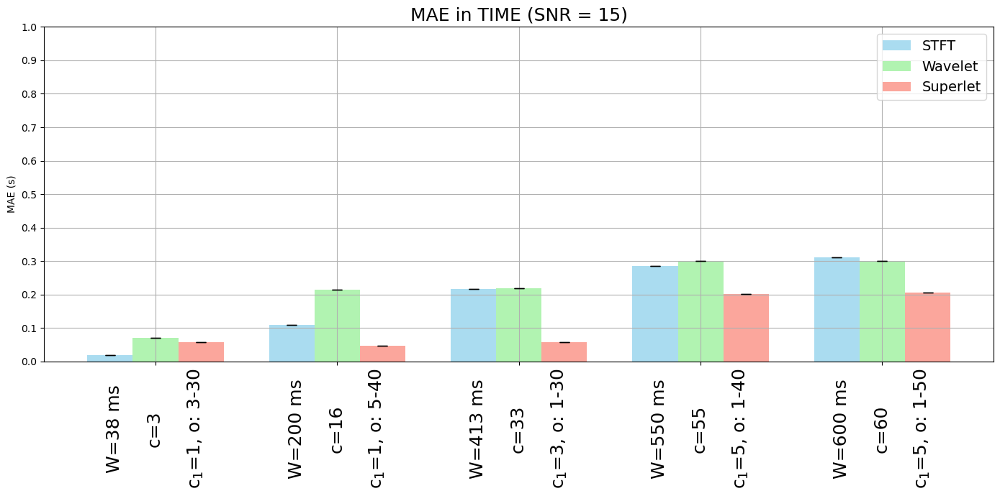

In [114]:
params_stft = windows_ms

# Número de condiciones
num_conditions = len(mae_wavelet_t)
x = np.arange(num_conditions)  # Posiciones para cada grupo de barras
bar_width = 0.25  # Ancho de las barras

# Crear el gráfico de barras
plt.figure(figsize=(14, 7))

# Graficar cada técnica con sus valores y barras de error
plt.bar(x - bar_width, mae_stft_t, width=bar_width, yerr=std_stft_t, capsize=5, label='STFT', color='skyblue', alpha=0.7)
plt.bar(x, mae_wavelet_t, width=bar_width, yerr=std_wavelet_t, capsize=5, label='Wavelet', color='lightgreen', alpha=0.7)
plt.bar(x + bar_width, mae_superlet_t, width=bar_width, yerr=std_superlet_t, capsize=5, label='Superlet', color='salmon', alpha=0.7)

# Configuración de etiquetas en el eje x con los parámetros específicos
labels = [
    f"W={p_stft} ms\n\nc={p_w}\n\nc$_1$={p_s[0]}, o: {p_s[1]}-{p_s[2]}"
    for p_w, p_s, p_stft in zip(params_wavelet, zip(*params_superlet), params_stft)
]

plt.xticks(x, labels, rotation=90, ha='center', fontsize=18)
#plt.xlabel('Condiciones y Parámetros')
plt.yticks(np.arange(0, 1.1, 0.1))

plt.ylabel('MAE (s)')
plt.title('MAE in TIME (SNR = ' + str(SNR) +')', fontsize=18)
plt.ylim(0,1)
plt.legend(fontsize=14)
plt.grid(True)

# Ajustar el layout para mejorar visualización de etiquetas
plt.tight_layout()

# Mostrar el gráfico
plt.show()

# COMPUTE RESOLUTION

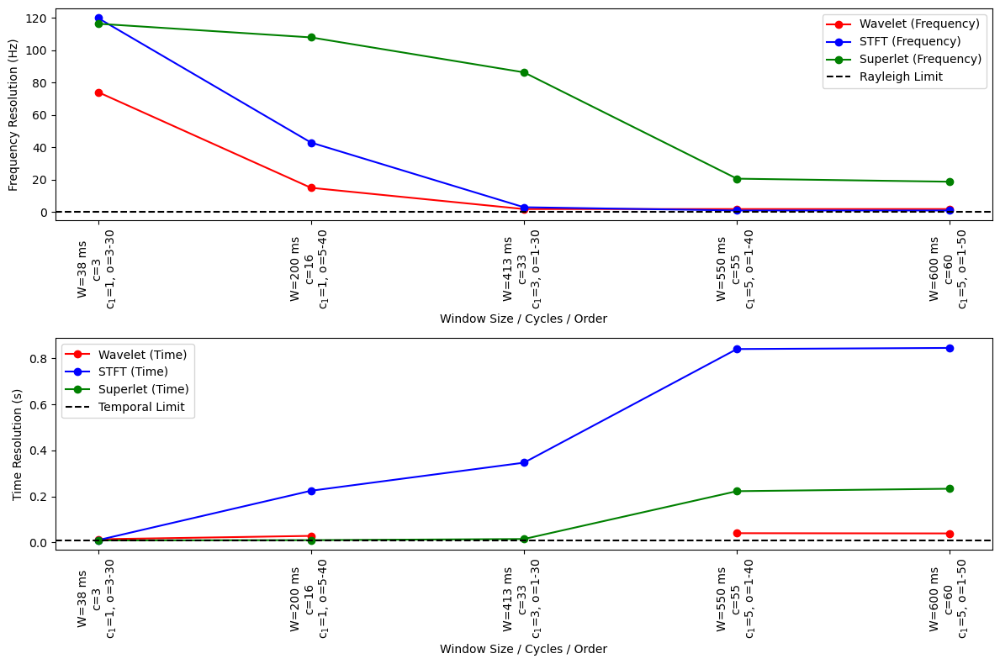

In [115]:
rayleigh_limit = 1 / (4 * np.pi)

# Etiquetas para los grupos de parámetros con salto de línea adicional
labels = [
    f"W={p_stft} ms\nc={p_wavelet}\nc$_1$={p_superlet[0]}, o={p_superlet[1]}-{p_superlet[2]}"
    for p_wavelet, p_superlet, p_stft in zip(params_wavelet, zip(*params_superlet), params_stft)
]

x = np.arange(1,len(params_wavelet)+1)

plt.figure(figsize=(12, 8))

# Primer gráfico (Frecuencia)
plt.subplot(2, 1, 1)
plt.plot(x, [r[1] for r in res_wavelet], 'ro-', label="Wavelet (Frequency)")
plt.plot(x, [r[1] for r in res_stft], 'bo-', label="STFT (Frequency)")
plt.plot(x, [r[1] for r in res_superlet], 'go-', label="Superlet (Frequency)")
plt.axhline(rayleigh_limit, color='k', linestyle='--', label="Rayleigh Limit")
plt.xlabel("Window Size / Cycles / Order")
plt.ylabel("Frequency Resolution (Hz)")
plt.legend()

# Segundo gráfico (Tiempo)
plt.subplot(2, 1, 2)
plt.plot(x, [r[0] for r in res_wavelet], 'ro-', label="Wavelet (Time)")
plt.plot(x, [r[0] for r in res_stft], 'bo-', label="STFT (Time)")
plt.plot(x, [r[0] for r in res_superlet], 'go-', label="Superlet (Time)")
plt.axhline(1 / MNF_1[0], color='k', linestyle='--', label="Temporal Limit")
plt.xlabel("Window Size / Cycles / Order")
plt.ylabel("Time Resolution (s)")
plt.legend()

# Ajuste de los xticks para ambos subgráficos
for ax in plt.gcf().get_axes():
    ax.set_xticks(x)  # Establecer los valores de los ticks
    ax.set_xticklabels(labels, rotation=90, ha='center', fontsize=10)  # Establecer las etiquetas con el formato deseado

# Ajustar el diseño
plt.tight_layout()
plt.show()

In [116]:
MAES_f

{'stft': [[25.686807509114125,
   12.469091937665304,
   10.504844351134729,
   9.830441919679494,
   9.591200972212985],
  [34.6011259691719,
   25.038373345898098,
   24.340215678448736,
   24.140020406083725,
   24.087161723683153]],
 'wavelet': [[17.98834143654191,
   12.294081253115408,
   10.789174868636747,
   10.107083429131656,
   10.040272115074695],
  [25.910322538220566,
   22.09149085674322,
   21.295996700285354,
   21.145826036187472,
   21.181367678349442]],
 'superlet': [[36.17019356405298,
   35.077817523641066,
   21.469213631336924,
   15.666614972193917,
   13.456367223831096],
  [53.11983904829374,
   53.08792295134845,
   36.3062018836885,
   30.77154449414752,
   27.666021025246362]],
 'std_stft': [[30.36950615911098,
   13.607029949115667,
   9.51214603631189,
   8.300511957948252,
   7.949538243587159],
  [31.49789819341193,
   16.01814443464309,
   11.933495147976068,
   10.349474035138837,
   9.93045745701815]],
 'std_wavelet': [[22.648514, 14.70026, 12.3306

In [117]:
MAES_f['wavelet'].append(mae_wavelet_f)
MAES_f['stft'].append(mae_stft_f)
MAES_f['superlet'].append(mae_superlet_f)
MAES_f['std_wavelet'].append(std_wavelet_f)
MAES_f['std_stft'].append(std_stft_f)
MAES_f['std_superlet'].append(std_superlet_f)

In [ ]:
MAES_t

In [ ]:
MAES_t['wavelet'].append(mae_wavelet_t)
MAES_t['stft'].append(mae_stft_t)
MAES_t['superlet'].append(mae_superlet_t)
MAES_t['std_wavelet'].append(std_wavelet_t)
MAES_t['std_stft'].append(std_stft_t)
MAES_t['std_superlet'].append(std_superlet_t)

### COMPARISON BETWEEN ALL SNR

# COMPARISON OF MAE IN FREQUENCY

In [ ]:
params_wavelet = params_wavelet
params_superlet = params_superlet
params_stft = windows_ms  # Tamaños de ventana en ms

# Datos MAE para cada técnica y SNR
mae_stft = MAES_f['stft']
std_stft = MAES_f['std_stft']

mae_wavelet = MAES_f['wavelet']
std_wavelet = MAES_f['std_wavelet']

mae_superlet = MAES_f['superlet']
std_superlet = MAES_f['std_superlet']

# Reordenar los niveles de SNR al orden deseado: 5 dB, 20 dB, Sin SNR
snr_labels = ["5 dB", "20 dB", "Inf"]
mae_stft_2 = [mae_stft[1], mae_stft[2], mae_stft[0]]
std_stft_2 = [std_stft[1], std_stft[2], std_stft[0]]

mae_wavelet_2 = [mae_wavelet[1], mae_wavelet[2], mae_wavelet[0]]
std_wavelet_2 = [std_wavelet[1], std_wavelet[2], std_wavelet[0]]

mae_superlet_2 = [mae_superlet[1], mae_superlet[2], mae_superlet[0]]
std_superlet_2 = [std_superlet[1], std_superlet[2], std_superlet[0]]

# Configuración del gráfico
num_params = len(params_stft)  # Número de parámetros
num_snr = len(snr_labels)  # Número de niveles de ruido
x = np.arange(num_params)  # Posiciones base para cada grupo de parámetros
bar_width = 0.1  # Ancho de cada barra
group_width = bar_width * num_snr  # Espacio reservado para cada grupo de barras

# Tonalidades por nivel de ruido (ordenadas)
tonalidades = {
    "5 dB": 0.4,
    "20 dB": 0.6,
    "Inf": 0.8,
}

# Colores base por metodología (asegurando correspondencia)
colores_base = {
    "STFT": plt.colormaps["Blues"],
    "Wavelet": plt.colormaps["Greens"],
    "Superlet": plt.colormaps["Oranges"],
}

# Crear el gráfico
plt.figure(figsize=(18, 8))

# Crear listas para la leyenda
handles = []
labels_legend = []

# Dibujar barras para cada técnica y SNR
for i, snr in enumerate(snr_labels):  # Iterar sobre niveles de SNR
    # Dibujar barras para STFT
    bar = plt.bar(
        x - 0.01 - group_width + i * bar_width,
        [np.array(mae_stft_2[i])[k] for k in range(num_params)],
        width=bar_width,
        color=colores_base["STFT"](tonalidades[snr]),
        label=f'STFT ({snr})'
    )
    handles.append(bar[0])

    plt.errorbar(
        x - 0.01 - group_width + i * bar_width,
        [np.array(mae_stft_2[i])[k] for k in range(num_params)],
        yerr=[np.array(std_stft_2[i])[k] for k in range(num_params)],
        fmt='none',
        ecolor='black',
        capsize=3
    )
    
    # Dibujar barras para Wavelet
    bar = plt.bar(
        x + i * bar_width,
        [np.array(mae_wavelet_2[i])[k] for k in range(num_params)],
        width=bar_width,
        color=colores_base["Wavelet"](tonalidades[snr]),
        label=f'Wavelet ({snr})'
    )
    handles.append(bar[0])

    plt.errorbar(
        x + i * bar_width,
        [np.array(mae_wavelet_2[i])[k] for k in range(num_params)],
        yerr=[np.array(std_wavelet_2[i])[k] for k in range(num_params)],
        fmt='none',
        ecolor='black',
        capsize=3
    )

    # Dibujar barras para Superlet
    bar = plt.bar(
        x + 0.01 + group_width + i * bar_width,
        [np.array(mae_superlet_2[i])[k] for k in range(num_params)],
        width=bar_width,
        color=colores_base["Superlet"](tonalidades[snr]),
        label=f'Superlet ({snr})'
    )
    handles.append(bar[0])

    plt.errorbar(
        x + 0.01 + group_width + i * bar_width,
        [np.array(mae_superlet_2[i])[k] for k in range(num_params)],
        yerr=[np.array(std_superlet_2[i])[k] for k in range(num_params)],
        fmt='none',
        ecolor='black',
        capsize=3
    )

# Ordenar la leyenda agrupada por metodología
labels_legend = [f'STFT ({snr})' for snr in snr_labels] + \
                [f'Wavelet ({snr})' for snr in snr_labels] + \
                [f'Superlet ({snr})' for snr in snr_labels]
handles = handles[:len(labels_legend)]

# Etiquetas para los grupos de parámetros con salto de línea adicional
labels = [
    f"W={p_stft} ms\n\nc={p_wavelet}\n\n\nc$_1$={p_superlet[0]}, o={p_superlet[1]}-{p_superlet[2]}"
    for p_wavelet, p_superlet, p_stft in zip(params_wavelet, zip(*params_superlet), params_stft)
]

# Configurar eje X y otros detalles
plt.xticks(x, labels, rotation=90, ha='center', fontsize=18)
plt.yticks(np.arange(0, 81, 10))
plt.ylabel('MAE (Hz)', fontsize=14)
plt.ylim(0, 80)
#plt.legend(handles, labels_legend, fontsize=10, ncol=1)  # Leyenda agrupada
plt.tight_layout()
plt.grid(True)

# Mostrar el gráfico
plt.show()

In [ ]:
MAES_f

# COMPARISON OF MAE IN TIME

In [ ]:
params_wavelet = params_wavelet
params_superlet = params_superlet
params_stft = windows_ms  # Tamaños de ventana en ms

# Datos MAE para cada técnica y SNR
mae_stft = MAES_t['stft']
std_stft = MAES_t['std_stft']

mae_wavelet = MAES_t['wavelet']
std_wavelet = MAES_t['std_wavelet']

mae_superlet = MAES_t['superlet']
std_superlet = MAES_t['std_superlet']

# Reordenar los niveles de SNR al orden deseado: 5 dB, 20 dB, Sin SNR
snr_labels = ["5 dB", "20 dB", "Inf"]
mae_stft_2 = [mae_stft[1], mae_stft[2], mae_stft[0]]
std_stft_2 = [std_stft[1], std_stft[2], std_stft[0]]

mae_wavelet_2 = [mae_wavelet[1], mae_wavelet[2], mae_wavelet[0]]
std_wavelet_2 = [std_wavelet[1], std_wavelet[2], std_wavelet[0]]

mae_superlet_2 = [mae_superlet[1], mae_superlet[2], mae_superlet[0]]
std_superlet_2 = [std_superlet[1], std_superlet[2], std_superlet[0]]

# Configuración del gráfico
num_params = len(params_stft)  # Número de parámetros
num_snr = len(snr_labels)  # Número de niveles de ruido
x = np.arange(num_params)  # Posiciones base para cada grupo de parámetros
bar_width = 0.1  # Ancho de cada barra
group_width = bar_width * num_snr  # Espacio reservado para cada grupo de barras

# Tonalidades por nivel de ruido (ordenadas)
tonalidades = {
    "5 dB": 0.4,
    "20 dB": 0.6,
    "Inf": 0.8,
}

# Colores base por metodología (asegurando correspondencia)
colores_base = {
    "STFT": plt.colormaps["Blues"],
    "Wavelet": plt.colormaps["Greens"],
    "Superlet": plt.colormaps["Oranges"],
}

# Crear el gráfico
plt.figure(figsize=(18, 8))

# Crear listas para la leyenda
handles = []
labels_legend = []

# Dibujar barras para cada técnica y SNR
for i, snr in enumerate(snr_labels):  # Iterar sobre niveles de SNR
    # Dibujar barras para STFT
    bar = plt.bar(
        x - 0.01 - group_width + i * bar_width,
        [np.array(mae_stft_2[i])[k] for k in range(num_params)],
        width=bar_width,
        color=colores_base["STFT"](tonalidades[snr]),
        label=f'STFT ({snr})'
    )
    handles.append(bar[0])

    plt.errorbar(
        x - 0.01 - group_width + i * bar_width,
        [np.array(mae_stft_2[i])[k] for k in range(num_params)],
        yerr=[np.array(std_stft_2[i])[k] for k in range(num_params)],
        fmt='none',
        ecolor='black',
        capsize=3
    )
    
    # Dibujar barras para Wavelet
    bar = plt.bar(
        x + i * bar_width,
        [np.array(mae_wavelet_2[i])[k] for k in range(num_params)],
        width=bar_width,
        color=colores_base["Wavelet"](tonalidades[snr]),
        label=f'Wavelet ({snr})'
    )
    handles.append(bar[0])

    plt.errorbar(
        x + i * bar_width,
        [np.array(mae_wavelet_2[i])[k] for k in range(num_params)],
        yerr=[np.array(std_wavelet_2[i])[k] for k in range(num_params)],
        fmt='none',
        ecolor='black',
        capsize=3
    )

    # Dibujar barras para Superlet
    bar = plt.bar(
        x + 0.01 + group_width + i * bar_width,
        [np.array(mae_superlet_2[i])[k] for k in range(num_params)],
        width=bar_width,
        color=colores_base["Superlet"](tonalidades[snr]),
        label=f'Superlet ({snr})'
    )
    handles.append(bar[0])

    plt.errorbar(
        x + 0.01 + group_width + i * bar_width,
        [np.array(mae_superlet_2[i])[k] for k in range(num_params)],
        yerr=[np.array(std_superlet_2[i])[k] for k in range(num_params)],
        fmt='none',
        ecolor='black',
        capsize=3
    )

# Ordenar la leyenda agrupada por metodología
labels_legend = [f'STFT ({snr})' for snr in snr_labels] + \
                [f'Wavelet ({snr})' for snr in snr_labels] + \
                [f'Superlet ({snr})' for snr in snr_labels]
handles = handles[:len(labels_legend)]

# Etiquetas para los grupos de parámetros con salto de línea adicional
labels = [
    f"W={p_stft} ms\n\nc={p_wavelet}\n\n\nc$_1$={p_superlet[0]}, o={p_superlet[1]}-{p_superlet[2]}"
    for p_wavelet, p_superlet, p_stft in zip(params_wavelet, zip(*params_superlet), params_stft)
]

# Configurar eje X y otros detalles
plt.xticks(x, labels, rotation=90, ha='center', fontsize=18)
plt.yticks(np.arange(0, 1.1, 0.1))
plt.ylabel('MAE (Hz)', fontsize=14)
plt.ylim(0, 1)
#plt.legend(handles, labels_legend, fontsize=10, ncol=1)  # Leyenda agrupada
plt.tight_layout()
plt.grid(True)

# Mostrar el gráfico
plt.show()